# Imports

In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import glob
import PIL
from PIL import Image
import cv2
from sklearn.model_selection import train_test_split
np.random.seed(101)
from tensorflow.keras import models, layers, regularizers
from tensorflow.keras import backend as K
from keras.models import Model, Sequential
from keras.layers import Activation, Dense, BatchNormalization, Dropout, Conv2D, Conv2DTranspose, MaxPooling2D, UpSampling2D, Input, Reshape
from keras.optimizers import Adam, SGD
import nibabel as nib
import random
from tensorflow.keras.metrics import MeanIoU
import SimpleITK as sitk
import os
from tensorflow.keras.optimizers import Adam
from datetime import datetime 
from keras import backend, optimizers
from keras.layers import concatenate
from sklearn.metrics import roc_curve, auc
from PIL import Image
import re
import pyefd

2023-05-30 12:28:31.977604: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-30 12:28:32.781145: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-05-30 12:28:40.136034: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /cm/shared/apps/cudnn-8.4/8.4/lib64:/cm/local/apps/cuda/libs/current/lib64:/cm/shared/apps/cuda11.2/toolkit/11.2.0/targets/x86_64-linux/lib:/cm/local/apps/gcc/7.2.0/lib:/cm/local/apps/gcc/7.2.0/lib64:/hom

### Data loading and augmenting

In [2]:
!git clone https://github.com/Shankar0x/Datasets.git imgs


fatal: destination path 'imgs' already exists and is not an empty directory.


X_train shape:  (200, 192, 256, 3)
Y_train shape:  (200, 192, 256)


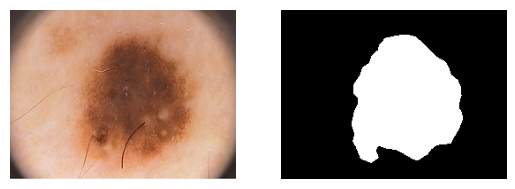

In [3]:

numbers = re.compile(r'(\d+)')
def numericalSort(value):
    parts = numbers.split(value)
    parts[1::2] = map(int, parts[1::2])
    return parts


filelist_trainx = sorted(glob.glob('imgs/Resized_Skin_Lesion_Dataset/Train_images/Trainx/*.bmp'), key=numericalSort)
X_train = np.array([np.array(Image.open(fname)) for fname in filelist_trainx])

filelist_trainy = sorted(glob.glob('imgs/Resized_Skin_Lesion_Dataset/Train_masks/Trainy/*.bmp'), key=numericalSort)
Y_train = np.array([np.array(Image.open(fname)) for fname in filelist_trainy])

# filelist_trainx = sorted(glob.glob('imgs/Electron_Microscopy_Dataset/images/*.tif'), key=numericalSort)
# x_train = np.array([np.array(Image.open(fname).convert('RGB')) for fname in filelist_trainx])

# filelist_trainy = sorted(glob.glob('imgs/Electron_Microscopy_Dataset/masks/*.tif'), key=numericalSort)
# y_train = np.array([np.array(Image.open(fname)) for fname in filelist_trainy])

# filelist_trainx = sorted(glob.glob('imgs/Skin_Lesion_Dataset/trainx/*.jpg'), key=numericalSort)
# x_train = np.array([np.array(Image.open(fname).convert('RGB')) for fname in filelist_trainx])

# filelist_trainy = sorted(glob.glob('imgs/Skin_Lesion_Dataset/trainy/*.jpg'), key=numericalSort)
# y_train = np.array([np.array(Image.open(fname)) for fname in filelist_trainy])


print("X_train shape: ",X_train.shape)
print("Y_train shape: ",Y_train.shape)
plt.subplot(1,2,1)
plt.imshow(X_train[0].astype('uint8'))
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(Y_train[0].astype('uint8'),cmap = plt.cm.binary_r)
plt.axis('off')
plt.show()

In [4]:
x_train,x_test,y_train,y_test=train_test_split(X_train,Y_train,test_size=0.25,random_state=101)

In [5]:
print("X_train shape: ",x_train.shape)
print("Y_train shape: ",y_train.shape)
print("X_test shape: ",x_test.shape)
print("Y_test shape: ",y_test.shape)

X_train shape:  (150, 192, 256, 3)
Y_train shape:  (150, 192, 256)
X_test shape:  (50, 192, 256, 3)
Y_test shape:  (50, 192, 256)


In [6]:
def random_rotation(x_image, y_image):
    rows_x,cols_x, chl_x = x_image.shape
    rows_y,cols_y = y_image.shape
    rand_num = np.random.randint(-40,40)
    M1 = cv2.getRotationMatrix2D((cols_x/2,rows_x/2),rand_num,1)
    M2 = cv2.getRotationMatrix2D((cols_y/2,rows_y/2),rand_num,1)
    x_image = cv2.warpAffine(x_image,M1,(cols_x,rows_x))
    y_image = cv2.warpAffine(y_image.astype('float32'),M2,(cols_y,rows_y))
    return x_image, y_image.astype('int')

def horizontal_flip(x_image, y_image):
    x_image = cv2.flip(x_image, 1)
    y_image = cv2.flip(y_image.astype('float32'), 1)
    return x_image, y_image.astype('int')

In [7]:
def img_augmentation(x_train, y_train):
    x_rotat = []
    y_rotat = []
    x_flip = []
    y_flip = []
    x_nois = []
    for idx in range(len(x_train)):
        x,y = random_rotation(x_train[idx], y_train[idx])
        x_rotat.append(x)
        y_rotat.append(y)
        
        x,y = horizontal_flip(x_train[idx], y_train[idx])
        x_flip.append(x)
        y_flip.append(y)
        return np.array(x_rotat), np.array(y_rotat), np.array(x_flip), np.array(y_flip)

In [8]:
def img_augmentation(x_test, y_test):
    x_rotat = []
    y_rotat = []
    x_flip = []
    y_flip = []
    x_nois = []
    for idx in range(len(x_test)):
        x,y = random_rotation(x_test[idx], y_test[idx])
        x_rotat.append(x)
        y_rotat.append(y)
        
        x,y = horizontal_flip(x_test[idx], y_test[idx])
        x_flip.append(x)
        y_flip.append(y)

    return np.array(x_rotat), np.array(y_rotat), np.array(x_flip), np.array(y_flip)

In [9]:
x_rotated, y_rotated, x_flipped, y_flipped = img_augmentation(x_train, y_train)
x_rotated_t, y_rotated_t, x_flipped_t, y_flipped_t = img_augmentation(x_test, y_test)

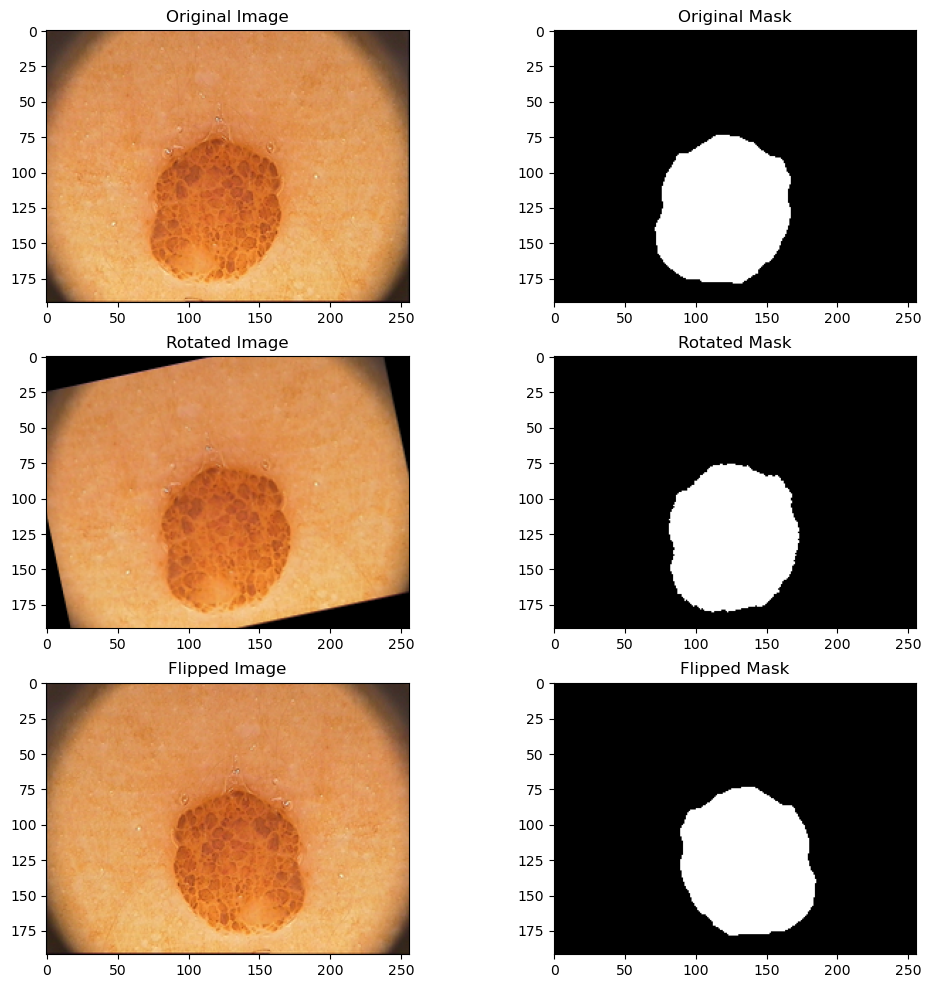

In [10]:
img_num = 114
plt.figure(figsize=(12,12))
plt.subplot(3,2,1)
plt.imshow(x_train[img_num])
plt.title('Original Image')
plt.subplot(3,2,2)
plt.imshow(y_train[img_num], plt.cm.binary_r)
plt.title('Original Mask')
plt.subplot(3,2,3)
plt.imshow(x_rotated[img_num])
plt.title('Rotated Image')
plt.subplot(3,2,4)
plt.imshow(y_rotated[img_num], plt.cm.binary_r)
plt.title('Rotated Mask')
plt.subplot(3,2,5)
plt.imshow(x_flipped[img_num])
plt.title('Flipped Image')
plt.subplot(3,2,6)
plt.imshow(y_flipped[img_num], plt.cm.binary_r)
plt.title('Flipped Mask')
plt.show()

In [11]:
x_train_full = np.concatenate([x_train, x_rotated, x_flipped])
y_train_full = np.concatenate([y_train, y_rotated, y_flipped])

In [12]:
x_train, x_val, y_train, y_val = train_test_split(x_train_full, y_train_full, test_size = 0.20, random_state = 101)

In [13]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)
print(x_val.shape)
print(y_val.shape)

(360, 192, 256, 3)
(360, 192, 256)
(50, 192, 256, 3)
(50, 192, 256)
(90, 192, 256, 3)
(90, 192, 256)


### Saving a version of dimension expanded masks

In [14]:
# expanding dimensions of the masks
y_train_full_exp = np.zeros((y_train_full.shape[0], y_train_full.shape[1], y_train_full.shape[2],1))
for i in range(y_train_full.shape[0]):
    y_train_full_exp[i] = np.expand_dims(y_train_full[i], 2)

y_test_exp = np.zeros((y_test.shape[0], y_test.shape[1], y_test.shape[2], 1))
for i in range(y_test.shape[0]):
    y_test_exp[i] = np.expand_dims(y_test[i],2)
    
Y_train_exp = np.zeros((Y_train.shape[0], Y_train.shape[1], Y_train.shape[2], 1))
for i in range(Y_train.shape[0]):
    Y_train_exp[i] = np.expand_dims(Y_train[i], 2)

In [15]:
x_train, x_val, y_train_exp, y_val_exp = train_test_split(x_train_full, y_train_full_exp, test_size = 0.20, random_state = 101)

In [16]:
print(x_train.shape)
print(y_train_exp.shape)
print(x_test.shape)
print(y_test_exp.shape)
print(x_val.shape)
print(y_val_exp.shape)
print(X_train.shape)
print(Y_train_exp.shape)

(360, 192, 256, 3)
(360, 192, 256, 1)
(50, 192, 256, 3)
(50, 192, 256, 1)
(90, 192, 256, 3)
(90, 192, 256, 1)
(200, 192, 256, 3)
(200, 192, 256, 1)


### Accuracy of the model

In [17]:
def accuracy(y_true, y_pred):
    '''Calculates the mean accuracy rate across all predictions for binary
    classification problems.
    '''
    return K.mean(K.equal(y_true, K.round(y_pred)))

### Extracting image features

In [18]:
IMG_HEIGHT = x_train.shape[1]
IMG_WIDTH  = x_train.shape[2]
IMG_CHANNELS = x_train.shape[3]
num_labels = 1  #Binary
input_shape = (IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS)
batch_size = 8

#FOCAL LOSS AND DICE METRIC
#Focal loss helps focus more on tough to segment classes.
from focal_loss import BinaryFocalLoss

### Dice and Jaccard Coefficients

In [19]:
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2.0 * intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) + 1.0)


def jacard_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)


def jacard_coef_loss(y_true, y_pred):
    return -jacard_coef(y_true, y_pred)


def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

# 1. Simple SegNet

In [20]:
def segnet(epochs_num,savename):

    # Encoding layer
    img_input = Input(shape= (192, 256, 3))
    conv1 = Conv2D(64, (3, 3), padding='same', name='conv1',strides= (1,1))(img_input)
    conv1 = BatchNormalization(name='bn1')(conv1)
    conv1 = Activation('relu')(conv1)
    conv1 = Conv2D(64, (3, 3), padding='same', name='conv2')(conv1)
    conv1 = BatchNormalization(name='bn2')(conv1)
    conv1 = Activation('relu')(conv1)
    pool1 = MaxPooling2D()(conv1)
    
    conv2 = Conv2D(128, (3, 3), padding='same', name='conv3')(pool1)
    conv2 = BatchNormalization(name='bn3')(conv2)
    conv2 = Activation('relu')(conv2)
    conv2 = Conv2D(128, (3, 3), padding='same', name='conv4')(conv2)
    conv2 = BatchNormalization(name='bn4')(conv2)
    conv2 = Activation('relu')(conv2)
    pool2 = MaxPooling2D()(conv2)

    conv3 = Conv2D(256, (3, 3), padding='same', name='conv5')(pool2)
    conv3 = BatchNormalization(name='bn5')(conv3)
    conv3 = Activation('relu')(conv3)
    conv3 = Conv2D(256, (3, 3), padding='same', name='conv6')(conv3)
    conv3 = BatchNormalization(name='bn6')(conv3)
    conv3 = Activation('relu')(conv3)
    conv3 = Conv2D(256, (3, 3), padding='same', name='conv7')(conv3)
    conv3 = BatchNormalization(name='bn7')(conv3)
    conv3 = Activation('relu')(conv3)
    pool3 = MaxPooling2D()(conv3)

    conv4 = Conv2D(512, (3, 3), padding='same', name='conv8')(pool3)
    conv4 = BatchNormalization(name='bn8')(conv4)
    conv4 = Activation('relu')(conv4)
    conv4 = Conv2D(512, (3, 3), padding='same', name='conv9')(conv4)
    conv4 = BatchNormalization(name='bn9')(conv4)
    conv4 = Activation('relu')(conv4)
    conv4 = Conv2D(512, (3, 3), padding='same', name='conv10')(conv4)
    conv4 = BatchNormalization(name='bn10')(conv4)
    conv4 = Activation('relu')(conv4)
    pool4 = MaxPooling2D()(conv4)
    
    conv5 = Conv2D(512, (3, 3), padding='same', name='conv11')(pool4)
    conv5 = BatchNormalization(name='bn11')(conv5)
    conv5 = Activation('relu')(conv5)
    conv5 = Conv2D(512, (3, 3), padding='same', name='conv12')(conv5)
    conv5 = BatchNormalization(name='bn12')(conv5)
    conv5 = Activation('relu')(conv5)
    conv5 = Conv2D(512, (3, 3), padding='same', name='conv13')(conv5)
    conv5 = BatchNormalization(name='bn13')(conv5)
    conv5 = Activation('relu')(conv5)
    pool5 = MaxPooling2D()(conv5)

    bridge = Dense(1024, activation = 'relu', name='fc1')(pool5)
    bridge = Dense(1024, activation = 'relu', name='fc2')(bridge)
    # Decoding Layer 
    up1 = UpSampling2D()(bridge)
    deconv1 = Conv2DTranspose(512, (3, 3), padding='same', name='deconv1')(up1)
    deconv1 = BatchNormalization(name='bn14')(deconv1)
    deconv1 = Activation('relu')(deconv1)
    deconv1 = Conv2DTranspose(512, (3, 3), padding='same', name='deconv2')(deconv1)
    deconv1 = BatchNormalization(name='bn15')(deconv1)
    deconv1 = Activation('relu')(deconv1)
    deconv1 = Conv2DTranspose(512, (3, 3), padding='same', name='deconv3')(deconv1)
    deconv1 = BatchNormalization(name='bn16')(deconv1)
    deconv1 = Activation('relu')(deconv1)
    
    up2 = UpSampling2D()(deconv1)
    deconv2 = Conv2DTranspose(512, (3, 3), padding='same', name='deconv4')(up2)
    deconv2 = BatchNormalization(name='bn17')(deconv2)
    deconv2 = Activation('relu')(deconv2)
    deconv2 = Conv2DTranspose(512, (3, 3), padding='same', name='deconv5')(deconv2)
    deconv2 = BatchNormalization(name='bn18')(deconv2)
    deconv2 = Activation('relu')(deconv2)
    deconv2 = Conv2DTranspose(256, (3, 3), padding='same', name='deconv6')(deconv2)
    deconv2 = BatchNormalization(name='bn19')(deconv2)
    deconv2 = Activation('relu')(deconv2)

    up3 = UpSampling2D()(deconv2)
    deconv3 = Conv2DTranspose(256, (3, 3), padding='same', name='deconv7')(up3)
    deconv3 = BatchNormalization(name='bn20')(deconv3)
    deconv3 = Activation('relu')(deconv3)
    deconv3 = Conv2DTranspose(256, (3, 3), padding='same', name='deconv8')(deconv3)
    deconv3 = BatchNormalization(name='bn21')(deconv3)
    deconv3 = Activation('relu')(deconv3)
    deconv3 = Conv2DTranspose(128, (3, 3), padding='same', name='deconv9')(deconv3)
    deconv3 = BatchNormalization(name='bn22')(deconv3)
    deconv3 = Activation('relu')(deconv3)

    up4 = UpSampling2D()(deconv3)
    deconv4 = Conv2DTranspose(128, (3, 3), padding='same', name='deconv10')(up4)
    deconv4 = BatchNormalization(name='bn23')(deconv4)
    deconv4 = Activation('relu')(deconv4)
    deconv4 = Conv2DTranspose(64, (3, 3), padding='same', name='deconv11')(deconv4)
    deconv4 = BatchNormalization(name='bn24')(deconv4)
    deconv4 = Activation('relu')(deconv4)
    
    up5 = UpSampling2D()(deconv4)
    deconv5 = Conv2DTranspose(64, (3, 3), padding='same', name='deconv12')(up5)
    deconv5 = BatchNormalization(name='bn25')(deconv5)
    deconv5 = Activation('relu')(deconv5)
    deconv5 = Conv2DTranspose(1, (3, 3), padding='same', name='deconv13')(deconv5)
    deconv5 = BatchNormalization(name='bn26')(deconv5)
    deconv5 = Activation('sigmoid')(deconv5)
    pred = Reshape((192,256))(deconv5)
    
    model = Model(inputs=img_input, outputs=pred)
    
    model.compile(optimizer= SGD(lr=0.001, momentum=0.9, decay=0.0005, nesterov=False), loss= ["binary_crossentropy"]
                  , metrics=[accuracy])
    model.summary()
    hist = model.fit(x_train, y_train, epochs= epochs_num, batch_size= 2, validation_data= (x_val, y_val), verbose=1)
    
    model.save(savename)
    return model,hist, conv1, conv2, conv3, conv4, conv5, up1, up2, up3, up4, up5

In [21]:
simple_segnet, simple_segnet_hist, conv1, conv2, conv3, conv4, conv5, up1, up2, up3, up4, up5 = segnet(5, 'segnet_5_epoch.h5')

2023-05-27 18:56:53.747110: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-27 18:56:54.482375: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 10744 MB memory:  -> device: 0, name: Tesla V100-PCIE-16GB, pci bus id: 0000:3b:00.0, compute capability: 7.0


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 192, 256, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 192, 256, 64)      1792      
                                                                 
 bn1 (BatchNormalization)    (None, 192, 256, 64)      256       
                                                                 
 activation (Activation)     (None, 192, 256, 64)      0         
                                                                 
 conv2 (Conv2D)              (None, 192, 256, 64)      36928     
                                                                 
 bn2 (BatchNormalization)    (None, 192, 256, 64)      256       
                                                                 
 activation_1 (Activation)   (None, 192, 256, 64)      0     

 2D)                                                             
                                                                 
 deconv4 (Conv2DTranspose)   (None, 24, 32, 512)       2359808   
                                                                 
 bn17 (BatchNormalization)   (None, 24, 32, 512)       2048      
                                                                 
 activation_16 (Activation)  (None, 24, 32, 512)       0         
                                                                 
 deconv5 (Conv2DTranspose)   (None, 24, 32, 512)       2359808   
                                                                 
 bn18 (BatchNormalization)   (None, 24, 32, 512)       2048      
                                                                 
 activation_17 (Activation)  (None, 24, 32, 512)       0         
                                                                 
 deconv6 (Conv2DTranspose)   (None, 24, 32, 256)       1179904   
          

/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/gradient_descent.py:111: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Epoch 1/5


2023-05-27 18:56:59.730174: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100


180/180 [==============================] - 13s 42ms/step - loss: 0.5117 - accuracy: 0.7912 - val_loss: 0.5536 - val_accuracy: 0.7796
Epoch 2/5
180/180 [==============================] - 7s 37ms/step - loss: 0.4023 - accuracy: 0.8730 - val_loss: 0.3721 - val_accuracy: 0.8799
Epoch 3/5
180/180 [==============================] - 7s 37ms/step - loss: 0.3600 - accuracy: 0.8898 - val_loss: 0.3070 - val_accuracy: 0.9029
Epoch 4/5
180/180 [==============================] - 7s 37ms/step - loss: 0.3298 - accuracy: 0.9020 - val_loss: 0.3704 - val_accuracy: 0.8677
Epoch 5/5
180/180 [==============================] - 7s 37ms/step - loss: 0.3042 - accuracy: 0.9139 - val_loss: 0.2860 - val_accuracy: 0.9081


## Visualizations

### Training loss vs Validation loss

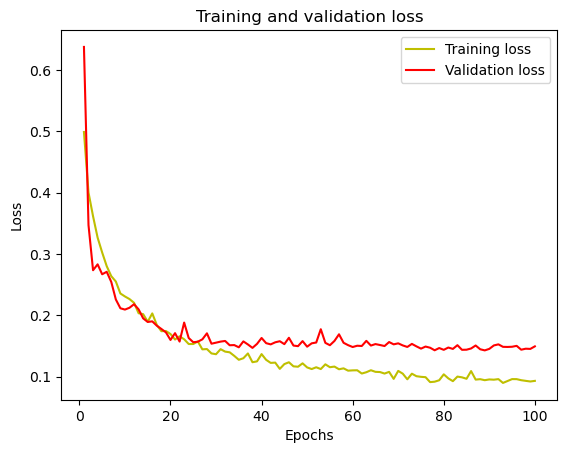

In [22]:
history = simple_segnet_hist

#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Loading the simple SegNet

In [21]:
# simple_segnet = keras.models.load_model('Master_weights/1_skin_simple_segnet_91_meaniou.h5')

2023-04-26 16:03:27.006299: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-26 16:03:28.197238: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 343 MB memory:  -> device: 0, name: Tesla V100-PCIE-16GB, pci bus id: 0000:3b:00.0, compute capability: 7.0


### Predictions

In [22]:
def enhance(img):
    sub = (simple_segnet.predict(img.reshape(1,192,256,3))).flatten()

    for i in range(len(sub)):
        if sub[i] > 0.5:
            sub[i] = 1
        else:
            sub[i] = 0
    return sub

In [23]:
test_img_number = random.randint(0, x_test.shape[0]-1)
test_img = x_test[test_img_number]
ground_truth=y_test[test_img_number]
prediction = enhance(test_img).reshape(192,256)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img, cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth, cmap='gray')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(prediction, cmap='gray')

plt.show()

2023-04-26 16:03:32.818280: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2023-04-26 16:03:33.988821: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 21.06MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-04-26 16:03:33.988884: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 21.06MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-04-26 16:03:33.994806: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 17.35MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance ga

NotFoundError: Graph execution error:

Detected at node 'model/conv1/Conv2D' defined at (most recent call last):
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/traitlets/config/application.py", line 1043, in launch_instance
      app.start()
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 712, in start
      self.io_loop.start()
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 215, in start
      self.asyncio_loop.run_forever()
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/asyncio/base_events.py", line 601, in run_forever
      self._run_once()
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/asyncio/base_events.py", line 1905, in _run_once
      handle._run()
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 510, in dispatch_queue
      await self.process_one()
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 499, in process_one
      await dispatch(*args)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 406, in dispatch_shell
      await result
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 730, in execute_request
      reply_content = await reply_content
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 383, in do_execute
      res = shell.run_cell(
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/ipykernel/zmqshell.py", line 528, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 2961, in run_cell
      result = self._run_cell(
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3016, in _run_cell
      result = runner(coro)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3221, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3400, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3460, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/tmp/ipykernel_107630/129270500.py", line 4, in <module>
      prediction = enhance(test_img).reshape(192,256)
    File "/tmp/ipykernel_107630/2943982748.py", line 2, in enhance
      sub = (simple_segnet.predict(img.reshape(1,192,256,3))).flatten()
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/engine/training.py", line 2253, in predict
      tmp_batch_outputs = self.predict_function(iterator)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/engine/training.py", line 2041, in predict_function
      return step_function(self, iterator)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/engine/training.py", line 2027, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/engine/training.py", line 2015, in run_step
      outputs = model.predict_step(data)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/engine/training.py", line 1983, in predict_step
      return self(x, training=False)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/engine/training.py", line 557, in __call__
      return super().__call__(*args, **kwargs)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/engine/base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/engine/functional.py", line 510, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/engine/functional.py", line 667, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/engine/base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/layers/convolutional/base_conv.py", line 283, in call
      outputs = self.convolution_op(inputs, self.kernel)
    File "/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/layers/convolutional/base_conv.py", line 255, in convolution_op
      return tf.nn.convolution(
Node: 'model/conv1/Conv2D'
No algorithm worked!  Error messages:
  Profiling failure on CUDNN engine 1#TC: UNKNOWN: CUDNN_STATUS_EXECUTION_FAILED
in tensorflow/stream_executor/cuda/cuda_dnn.cc(4023): 'cudnnConvolutionForward( cudnn.handle(), alpha, input_nd_.handle(), input_data.opaque(), filter_.handle(), filter_data.opaque(), conv_.handle(), ToConvForwardAlgo(algo), scratch_memory.opaque(), scratch_memory.size(), beta, output_nd_.handle(), output_data.opaque())'
  Profiling failure on CUDNN engine 1: UNKNOWN: CUDNN_STATUS_EXECUTION_FAILED
in tensorflow/stream_executor/cuda/cuda_dnn.cc(4023): 'cudnnConvolutionForward( cudnn.handle(), alpha, input_nd_.handle(), input_data.opaque(), filter_.handle(), filter_data.opaque(), conv_.handle(), ToConvForwardAlgo(algo), scratch_memory.opaque(), scratch_memory.size(), beta, output_nd_.handle(), output_data.opaque())'
  Profiling failure on CUDNN engine 0#TC: UNKNOWN: CUDNN_STATUS_EXECUTION_FAILED
in tensorflow/stream_executor/cuda/cuda_dnn.cc(4023): 'cudnnConvolutionForward( cudnn.handle(), alpha, input_nd_.handle(), input_data.opaque(), filter_.handle(), filter_data.opaque(), conv_.handle(), ToConvForwardAlgo(algo), scratch_memory.opaque(), scratch_memory.size(), beta, output_nd_.handle(), output_data.opaque())'
  Profiling failure on CUDNN engine 0: UNKNOWN: CUDNN_STATUS_EXECUTION_FAILED
in tensorflow/stream_executor/cuda/cuda_dnn.cc(4023): 'cudnnConvolutionForward( cudnn.handle(), alpha, input_nd_.handle(), input_data.opaque(), filter_.handle(), filter_data.opaque(), conv_.handle(), ToConvForwardAlgo(algo), scratch_memory.opaque(), scratch_memory.size(), beta, output_nd_.handle(), output_data.opaque())'
  Profiling failure on CUDNN engine 2#TC: RESOURCE_EXHAUSTED: Out of memory while trying to allocate 22085632 bytes.
  Profiling failure on CUDNN engine 2: RESOURCE_EXHAUSTED: Out of memory while trying to allocate 22085632 bytes.
  Profiling failure on CUDNN engine 6#TC: UNKNOWN: CUDNN_STATUS_EXECUTION_FAILED
in tensorflow/stream_executor/cuda/cuda_dnn.cc(4023): 'cudnnConvolutionForward( cudnn.handle(), alpha, input_nd_.handle(), input_data.opaque(), filter_.handle(), filter_data.opaque(), conv_.handle(), ToConvForwardAlgo(algo), scratch_memory.opaque(), scratch_memory.size(), beta, output_nd_.handle(), output_data.opaque())'
  Profiling failure on CUDNN engine 6: UNKNOWN: CUDNN_STATUS_EXECUTION_FAILED
in tensorflow/stream_executor/cuda/cuda_dnn.cc(4023): 'cudnnConvolutionForward( cudnn.handle(), alpha, input_nd_.handle(), input_data.opaque(), filter_.handle(), filter_data.opaque(), conv_.handle(), ToConvForwardAlgo(algo), scratch_memory.opaque(), scratch_memory.size(), beta, output_nd_.handle(), output_data.opaque())'
  Profiling failure on CUDNN engine 5#TC: RESOURCE_EXHAUSTED: Out of memory while trying to allocate 18195968 bytes.
  Profiling failure on CUDNN engine 5: RESOURCE_EXHAUSTED: Out of memory while trying to allocate 18195968 bytes.
  Profiling failure on CUDNN engine 7#TC: RESOURCE_EXHAUSTED: Out of memory while trying to allocate 491023360 bytes.
  Profiling failure on CUDNN engine 7: RESOURCE_EXHAUSTED: Out of memory while trying to allocate 491023360 bytes.
	 [[{{node model/conv1/Conv2D}}]] [Op:__inference_predict_function_3958]

### IoU for above prediction

In [ ]:
n_classes = 2
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(ground_truth, prediction)
print("IoU for the above prediction =", IOU_keras.result().numpy())

### Mean IoU for all images in the dataset

In [ ]:
sum_iou=0
for test_img_number in range(X_train.shape[0]):
    test_img = X_train[test_img_number]
    ground_truth=Y_train[test_img_number]

    prediction = enhance(test_img).reshape(192,256)
    
    IOU_keras = MeanIoU(num_classes=n_classes)  
    IOU_keras.update_state(ground_truth, prediction)
    sum_iou+=IOU_keras.result().numpy()*100
    print("IoU for the current prediction =", IOU_keras.result().numpy())
print("Mean IoU: ",sum_iou/X_train.shape[0])

### Interpretability

In [28]:
def visualize_conv_layer(int_out, row_size, col_size):
   
  img_index=0

  print(np.shape(int_out))
  
  fig,ax=plt.subplots(row_size,col_size, figsize=(20, 5))
  for row in range(0,row_size):
    for col in range(0,col_size):
      ax[row][col].imshow(int_out[0, :, :, img_index], cmap='jet')
      ax[row][col].axis('off')
      img_index=img_index+1
        
print("Function to Visualize the Output has been Created")

Function to Visualize the Output has been Created


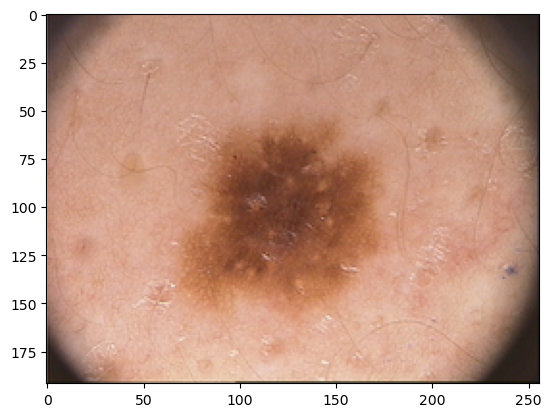

In [29]:
# selecting the image for interpretability
r_ind = random.randint(0, x_test.shape[0]-1)
test_img_input = np.expand_dims(x_test[r_ind], 0)
plt.imshow(x_test[r_ind])

### Maximum Intensity Projections

In [30]:
def make_mips(image_path, output_dir):
    image = sitk.ReadImage(image_path)
    image_size = image.GetSize()

    basename = os.path.basename(image_path)
    if not os.path.isdir(output_dir):
        os.makedirs(output_dir)

    for dim in range(3):
        projection = sitk.MaximumProjection(image, dim)

        if image_size[dim] % 2:  # odd number
            voxel = [0, 0, 0]
            voxel[dim] = (image_size[dim] - 1) / 2
            origin = image.TransformIndexToPhysicalPoint(voxel)
        else:  # even
            voxel1 = np.array([0, 0, 0], int)
            voxel2 = np.array([0, 0, 0], int)
            voxel1[dim] = image_size[dim] / 2 - 1
            voxel2[dim] = image_size[dim] / 2
            point1 = np.array(image.TransformIndexToPhysicalPoint(voxel1.tolist()))
            point2 = np.array(image.TransformIndexToPhysicalPoint(voxel2.tolist()))
            origin = np.mean(np.vstack((point1, point2)), 0)
        projection.SetOrigin(origin)
        projection.SetDirection(image.GetDirection())
        proj_basename = basename.replace('.nii.gz', '_mip_{}.nii.gz'.format(dim))
        sitk.WriteImage(projection, os.path.join(output_dir, proj_basename))


### Feature maps of convolutional blocks

In [31]:
simple_conv_blocks = [conv1, conv2, conv3, conv4, conv5]

In [32]:
simple_deconv_blocks = [up1, up2, up3, up4, up5]

In [33]:
for i in range(5):
    in_to_intermediate = Model(inputs=simple_segnet.inputs, outputs=simple_conv_blocks[i])
    int_out = in_to_intermediate.predict(test_img_input)

    path_to_save = 'Feature_maps/simple_segnet/conv_enc_'+str(i)+'.nii'

    converted_array = np.array(int_out[0], dtype=np.float32) # You need to replace normal array by yours
    affine = np.eye(4)
    nifti_file = nib.Nifti1Image(converted_array, affine)

    nib.save(nifti_file, path_to_save)

1/1 [==============================] - 0s 362ms/step


In [34]:
for i in range(5):
    image_path = 'Feature_maps/simple_segnet/conv_enc_'+str(i)+'.nii'
    output_dir = 'Feature_maps/simple_segnet/conv_mpi/'
    make_mips(image_path, output_dir)

In [35]:
for i in range(5):
    out_np_path = 'Feature_maps/simple_segnet/conv_mpi/conv_enc_'+str(i)+'.nii'
    out_img = nib.load(out_np_path)
    out_img = np.array(out_img.dataobj, dtype='int16')
    out_img = np.squeeze(out_img)
    cv2.imwrite('Feature_maps/simple_segnet/conv_mpi/img_'+str(i)+'.png', out_img)

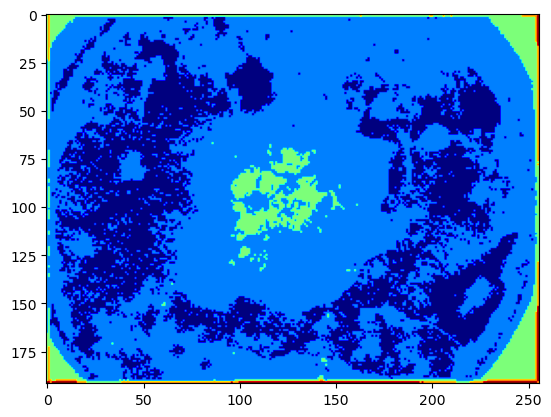

In [36]:
fname = 'Feature_maps/simple_segnet/conv_mpi/img_0.png'
plt.imshow(Image.open(fname), cmap = 'jet');

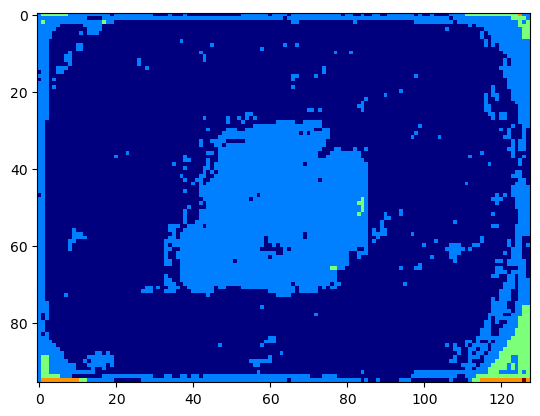

In [37]:
fname = 'Feature_maps/simple_segnet/conv_mpi/img_1.png'
plt.imshow(Image.open(fname), cmap = 'jet');

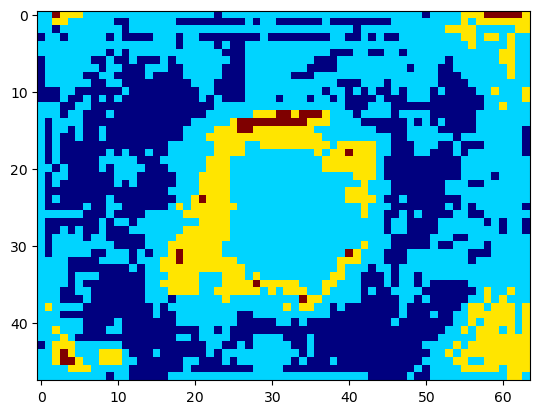

In [38]:
fname = 'Feature_maps/simple_segnet/conv_mpi/img_2.png'
plt.imshow(Image.open(fname), cmap = 'jet');

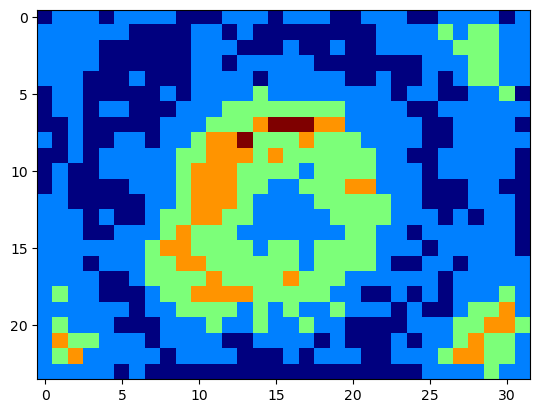

In [39]:
fname = 'Feature_maps/simple_segnet/conv_mpi/img_3.png'
plt.imshow(Image.open(fname), cmap = 'jet');

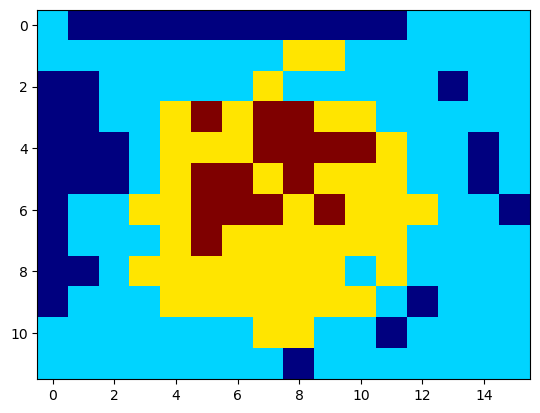

In [40]:
fname = 'Feature_maps/simple_segnet/conv_mpi/img_4.png'
plt.imshow(Image.open(fname), cmap = 'jet');

### Feature maps of de-convolutional blocks

In [41]:
for i in range(5):
    in_to_intermediate = Model(inputs=simple_segnet.inputs, outputs=simple_deconv_blocks[i])
    int_out = in_to_intermediate.predict(test_img_input)

    path_to_save = 'Feature_maps/simple_segnet/deconv_'+str(i)+'.nii'

    converted_array = np.array(int_out[0], dtype=np.float32) # You need to replace normal array by yours
    affine = np.eye(4)
    nifti_file = nib.Nifti1Image(converted_array, affine)

    nib.save(nifti_file, path_to_save)

1/1 [==============================] - 1s 745ms/step


In [42]:
for i in range(5):
    image_path = 'Feature_maps/simple_segnet/deconv_'+str(i)+'.nii'
    output_dir = 'Feature_maps/simple_segnet/conv_mip/'
    make_mips(image_path, output_dir)

In [43]:
for i in range(5):
    out_np_path = 'Feature_maps/simple_segnet/conv_mip/deconv_'+str(i)+'.nii'
    out_img = nib.load(out_np_path)
    out_img = np.array(out_img.dataobj, dtype='int16')
    out_img = np.squeeze(out_img)
    cv2.imwrite('Feature_maps/simple_segnet/conv_mip/de_img_'+str(i)+'.png', out_img)

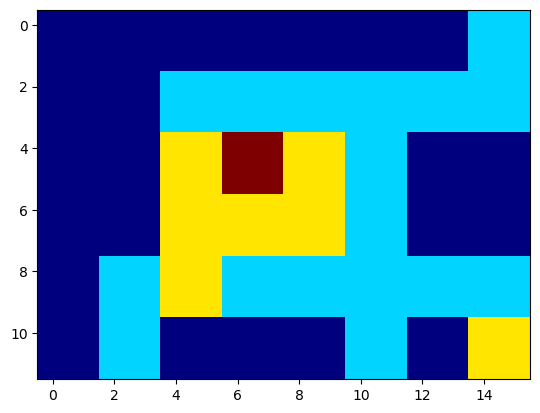

In [44]:
fname = 'Feature_maps/simple_segnet/conv_mip/de_img_0.png'
plt.imshow(Image.open(fname), cmap = 'jet');

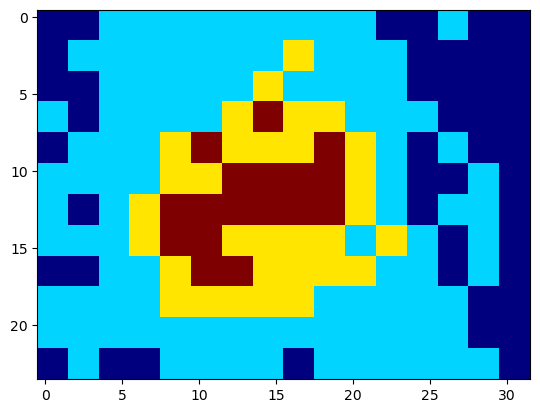

In [45]:
fname = 'Feature_maps/simple_segnet/conv_mip/de_img_1.png'
plt.imshow(Image.open(fname), cmap = 'jet');

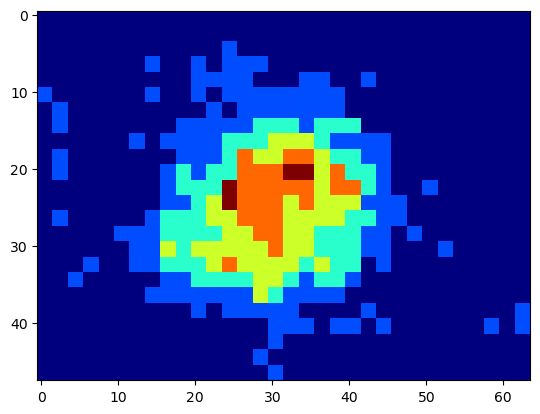

In [46]:
fname = 'Feature_maps/simple_segnet/conv_mip/de_img_2.png'
plt.imshow(Image.open(fname), cmap = 'jet');

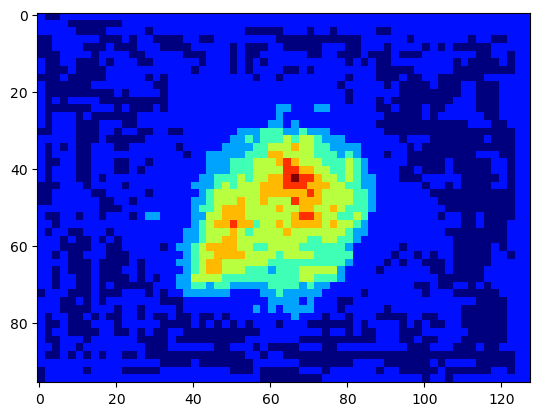

In [47]:
fname = 'Feature_maps/simple_segnet/conv_mip/de_img_3.png'
plt.imshow(Image.open(fname), cmap = 'jet');

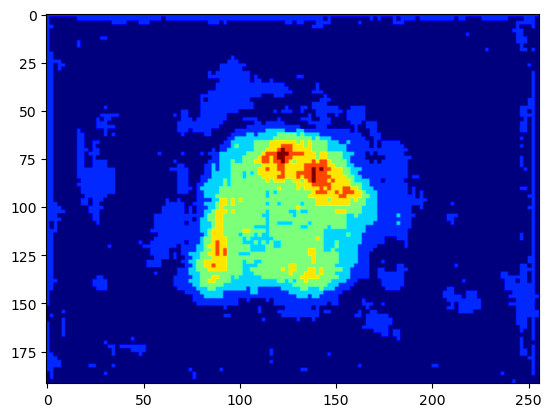

In [48]:
fname = 'Feature_maps/simple_segnet/conv_mip/de_img_4.png'
plt.imshow(Image.open(fname), cmap = 'jet');

# 2. Segnet + Combined connections

In [24]:
def segnet_combined(epochs_num,savename):

    # Encoding layer
    img_input = Input(shape= (192, 256, 3))
    conv1 = Conv2D(64, (3, 3), padding='same', name='conv1',strides= (1,1))(img_input)
    conv1 = BatchNormalization(name='bn1')(conv1)
    conv1 = Activation('relu')(conv1)
    conv1 = Conv2D(64, (3, 3), padding='same', name='conv2')(conv1)
    conv1 = BatchNormalization(name='bn2')(conv1)
    conv1 = Activation('relu')(conv1)
    pool1 = MaxPooling2D()(conv1)
    
    conv2 = Conv2D(128, (3, 3), padding='same', name='conv3')(pool1)
    conv2 = BatchNormalization(name='bn3')(conv2)
    conv2 = Activation('relu')(conv2)
    conv2 = Conv2D(128, (3, 3), padding='same', name='conv4')(conv2)
    conv2 = BatchNormalization(name='bn4')(conv2)
    conv2 = Activation('relu')(conv2)
    pool2 = MaxPooling2D()(conv2)

    conv3 = Conv2D(256, (3, 3), padding='same', name='conv5')(pool2)
    conv3 = BatchNormalization(name='bn5')(conv3)
    conv3 = Activation('relu')(conv3)
    conv3 = Conv2D(256, (3, 3), padding='same', name='conv6')(conv3)
    conv3 = BatchNormalization(name='bn6')(conv3)
    conv3 = Activation('relu')(conv3)
    conv3 = Conv2D(256, (3, 3), padding='same', name='conv7')(conv3)
    conv3 = BatchNormalization(name='bn7')(conv3)
    conv3 = Activation('relu')(conv3)
    pool3 = MaxPooling2D()(conv3)

    conv4 = Conv2D(512, (3, 3), padding='same', name='conv8')(pool3)
    conv4 = BatchNormalization(name='bn8')(conv4)
    conv4 = Activation('relu')(conv4)
    conv4 = Conv2D(512, (3, 3), padding='same', name='conv9')(conv4)
    conv4 = BatchNormalization(name='bn9')(conv4)
    conv4 = Activation('relu')(conv4)
    conv4 = Conv2D(512, (3, 3), padding='same', name='conv10')(conv4)
    conv4 = BatchNormalization(name='bn10')(conv4)
    conv4 = Activation('relu')(conv4)
    pool4 = MaxPooling2D()(conv4)
    
    conv5 = Conv2D(512, (3, 3), padding='same', name='conv11')(pool4)
    conv5 = BatchNormalization(name='bn11')(conv5)
    conv5 = Activation('relu')(conv5)
    conv5 = Conv2D(512, (3, 3), padding='same', name='conv12')(conv5)
    conv5 = BatchNormalization(name='bn12')(conv5)
    conv5 = Activation('relu')(conv5)
    conv5 = Conv2D(512, (3, 3), padding='same', name='conv13')(conv5)
    conv5 = BatchNormalization(name='bn13')(conv5)
    conv5 = Activation('relu')(conv5)
    pool5 = MaxPooling2D()(conv5)

    bridge = Dense(1024, activation = 'relu', name='fc1')(pool5)
    bridge = Dense(1024, activation = 'relu', name='fc2')(bridge)
    # Decoding Layer 
    x = concatenate([pool5,bridge], axis = 3)
    up1 = UpSampling2D()(x)
    deconv1 = Conv2DTranspose(512, (3, 3), padding='same', name='deconv1')(up1)
    deconv1 = BatchNormalization(name='bn14')(deconv1)
    deconv1 = Activation('relu')(deconv1)
    deconv1 = Conv2DTranspose(512, (3, 3), padding='same', name='deconv2')(deconv1)
    deconv1 = BatchNormalization(name='bn15')(deconv1)
    deconv1 = Activation('relu')(deconv1)
    deconv1 = Conv2DTranspose(512, (3, 3), padding='same', name='deconv3')(deconv1)
    deconv1 = BatchNormalization(name='bn16')(deconv1)
    deconv1 = Activation('relu')(deconv1)
    
    x = concatenate([pool4,deconv1], axis = 3)
    up2 = UpSampling2D()(x)
    deconv2 = Conv2DTranspose(512, (3, 3), padding='same', name='deconv4')(up2)
    deconv2 = BatchNormalization(name='bn17')(deconv2)
    deconv2 = Activation('relu')(deconv2)
    deconv2 = Conv2DTranspose(512, (3, 3), padding='same', name='deconv5')(deconv2)
    deconv2 = BatchNormalization(name='bn18')(deconv2)
    deconv2 = Activation('relu')(deconv2)
    deconv2 = Conv2DTranspose(256, (3, 3), padding='same', name='deconv6')(deconv2)
    deconv2 = BatchNormalization(name='bn19')(deconv2)
    deconv2 = Activation('relu')(deconv2)

    x = concatenate([pool3,deconv2], axis = 3)
    up3 = UpSampling2D()(x)
    deconv3 = Conv2DTranspose(256, (3, 3), padding='same', name='deconv7')(up3)
    deconv3 = BatchNormalization(name='bn20')(deconv3)
    deconv3 = Activation('relu')(deconv3)
    deconv3 = Conv2DTranspose(256, (3, 3), padding='same', name='deconv8')(deconv3)
    deconv3 = BatchNormalization(name='bn21')(deconv3)
    deconv3 = Activation('relu')(deconv3)
    deconv3 = Conv2DTranspose(128, (3, 3), padding='same', name='deconv9')(deconv3)
    deconv3 = BatchNormalization(name='bn22')(deconv3)
    deconv3 = Activation('relu')(deconv3)

    x = concatenate([pool2,deconv3], axis = 3)
    up4 = UpSampling2D()(x)
    deconv4 = Conv2DTranspose(128, (3, 3), padding='same', name='deconv10')(up4)
    deconv4 = BatchNormalization(name='bn23')(deconv4)
    deconv4 = Activation('relu')(deconv4)
    deconv4 = Conv2DTranspose(64, (3, 3), padding='same', name='deconv11')(deconv4)
    deconv4 = BatchNormalization(name='bn24')(deconv4)
    deconv4 = Activation('relu')(deconv4)
    
    x = concatenate([pool1,deconv4], axis = 3)
    up5 = UpSampling2D()(x)
    deconv5 = Conv2DTranspose(64, (3, 3), padding='same', name='deconv12')(up5)
    deconv5 = BatchNormalization(name='bn25')(deconv5)
    deconv5 = Activation('relu')(deconv5)
    deconv5 = Conv2DTranspose(1, (3, 3), padding='same', name='deconv13')(deconv5)
    deconv5 = BatchNormalization(name='bn26')(deconv5)
    deconv5 = Activation('sigmoid')(deconv5)
    pred = Reshape((192,256))(deconv5)
    
    model = Model(inputs=img_input, outputs=pred)
    
    model.compile(optimizer= SGD(lr=0.001, momentum=0.9, decay=0.0005, nesterov=False), loss= ["binary_crossentropy"]
                  , metrics=[accuracy])
    model.summary()
    hist = model.fit(x_train, y_train, epochs= epochs_num, batch_size= 2, validation_data= (x_val, y_val), verbose=1)
    
    model.save(savename)
    return model,hist, conv1, conv2, conv3, conv4, conv5, deconv1, deconv2, deconv3, deconv4, deconv5, up1, up2, up3, up4, up5

In [50]:
combined_segnet, combined_segnet_hist, conv1, conv2, conv3, conv4, conv5, deconv1, deconv2, deconv3, deconv4, deconv5, up1, up2, up3, up4, up5 = segnet_combined(100, 'segnet_w_skip_100_epoch.h5')

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 192, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1 (Conv2D)                 (None, 192, 256, 64  1792        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn1 (BatchNormalization)       (None, 192, 256, 64  256         ['conv1[0][0]']                  
                                )                                                          

                                                                                                  
 max_pooling2d_8 (MaxPooling2D)  (None, 12, 16, 512)  0          ['activation_35[0][0]']          
                                                                                                  
 conv11 (Conv2D)                (None, 12, 16, 512)  2359808     ['max_pooling2d_8[0][0]']        
                                                                                                  
 bn11 (BatchNormalization)      (None, 12, 16, 512)  2048        ['conv11[0][0]']                 
                                                                                                  
 activation_36 (Activation)     (None, 12, 16, 512)  0           ['bn11[0][0]']                   
                                                                                                  
 conv12 (Conv2D)                (None, 12, 16, 512)  2359808     ['activation_36[0][0]']          
          

                                                                                                  
 activation_45 (Activation)     (None, 48, 64, 256)  0           ['bn20[0][0]']                   
                                                                                                  
 deconv8 (Conv2DTranspose)      (None, 48, 64, 256)  590080      ['activation_45[0][0]']          
                                                                                                  
 bn21 (BatchNormalization)      (None, 48, 64, 256)  1024        ['deconv8[0][0]']                
                                                                                                  
 activation_46 (Activation)     (None, 48, 64, 256)  0           ['bn21[0][0]']                   
                                                                                                  
 deconv9 (Conv2DTranspose)      (None, 48, 64, 128)  295040      ['activation_46[0][0]']          
          

180/180 [==============================] - 8s 46ms/step - loss: 0.1095 - accuracy: 0.9765 - val_loss: 0.1395 - val_accuracy: 0.9531
Epoch 72/100
180/180 [==============================] - 9s 48ms/step - loss: 0.1193 - accuracy: 0.9723 - val_loss: 0.1411 - val_accuracy: 0.9540
Epoch 73/100
180/180 [==============================] - 8s 46ms/step - loss: 0.1144 - accuracy: 0.9738 - val_loss: 0.1609 - val_accuracy: 0.9443
Epoch 74/100
180/180 [==============================] - 8s 47ms/step - loss: 0.1095 - accuracy: 0.9761 - val_loss: 0.1442 - val_accuracy: 0.9531
Epoch 75/100
180/180 [==============================] - 8s 47ms/step - loss: 0.1165 - accuracy: 0.9734 - val_loss: 0.1349 - val_accuracy: 0.9549
Epoch 76/100
180/180 [==============================] - 8s 46ms/step - loss: 0.1051 - accuracy: 0.9778 - val_loss: 0.1375 - val_accuracy: 0.9538
Epoch 77/100
180/180 [==============================] - 8s 47ms/step - loss: 0.1077 - accuracy: 0.9763 - val_loss: 0.1371 - val_accuracy: 0.954

## Visualizations

### Training loss vs Validation loss

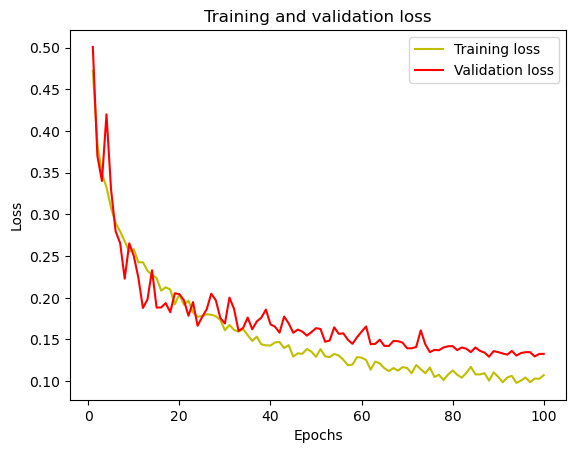

In [51]:
history = combined_segnet_hist

#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Loading the simple SegNet

In [25]:
combined_segnet = keras.models.load_model('Master_weights/segnet_w_skip_100_epoch.h5')
# Yet to store the weights for this model

2023-04-26 16:04:01.194369: W tensorflow/core/common_runtime/bfc_allocator.cc:479] Allocator (GPU_0_bfc) ran out of memory trying to allocate 9.00MiB (rounded to 9437184)requested by op AddV2
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2023-04-26 16:04:01.194462: I tensorflow/core/common_runtime/bfc_allocator.cc:1033] BFCAllocator dump for GPU_0_bfc
2023-04-26 16:04:01.194493: I tensorflow/core/common_runtime/bfc_allocator.cc:1040] Bin (256): 	Total Chunks: 91, Chunks in use: 91. 22.8KiB allocated for chunks. 22.8KiB in use in bin. 10.7KiB client-requested in use in bin.
2023-04-26 16:04:01.194517: I tensorflow/core/common_runtime/bfc_allocator.cc:1040] Bin (512): 	Total Chunks: 42, Chunks in use: 42. 21.5KiB allocated for chunks. 21.5KiB in use in bin. 21.0KiB client-requested in use in bin.
2023-04-26 16:04:01.194539: I tens

ResourceExhaustedError: {{function_node __wrapped__AddV2_device_/job:localhost/replica:0/task:0/device:GPU:0}} failed to allocate memory [Op:AddV2]

### Predictions

In [27]:
def enhance(img):
    sub = (combined_segnet.predict(img.reshape(1,192,256,3))).flatten()

    for i in range(len(sub)):
        if sub[i] > 0.5:
            sub[i] = 1
        else:
            sub[i] = 0
    return sub

1/1 [==============================] - 1s 1s/step


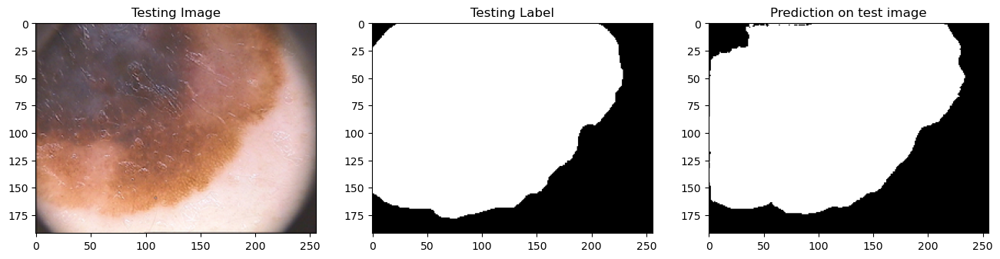

In [28]:
test_img_number = random.randint(0, x_test.shape[0]-1)
test_img = x_test[test_img_number]
ground_truth=y_test[test_img_number]
prediction = enhance(test_img).reshape(192,256)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img, cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth, cmap='gray')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(prediction, cmap='gray')

plt.show()

### IoU for above prediction

In [29]:
n_classes = 2
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(ground_truth, prediction)
print("IoU for the above prediction =", IOU_keras.result().numpy())

IoU for the above prediction = 0.92251897


### Mean IoU for all images in the dataset

In [30]:
sum_iou=0
for test_img_number in range(X_train.shape[0]):
    test_img = X_train[test_img_number]
    ground_truth=Y_train[test_img_number]

    prediction = enhance(test_img).reshape(192,256)
    
    IOU_keras = MeanIoU(num_classes=n_classes)  
    IOU_keras.update_state(ground_truth, prediction)
    sum_iou+=IOU_keras.result().numpy()*100
    print("IoU for the current prediction =", IOU_keras.result().numpy())
print("Mean IoU: ",sum_iou/X_train.shape[0])

1/1 [==============================] - 0s 57ms/step
IoU for the current prediction = 0.92272735
1/1 [==============================] - 0s 74ms/step
IoU for the current prediction = 0.89963835
1/1 [==============================] - 0s 71ms/step
IoU for the current prediction = 0.9232415
1/1 [==============================] - 0s 76ms/step
IoU for the current prediction = 0.9100596
1/1 [==============================] - 0s 83ms/step
IoU for the current prediction = 0.90569246
1/1 [==============================] - 0s 98ms/step
IoU for the current prediction = 0.90452796
1/1 [==============================] - 0s 85ms/step
IoU for the current prediction = 0.940614
1/1 [==============================] - 0s 184ms/step
IoU for the current prediction = 0.9459902
1/1 [==============================] - 0s 173ms/step
IoU for the current prediction = 0.917739
1/1 [==============================] - 0s 81ms/step
IoU for the current prediction = 0.83249426
1/1 [==============================] - 0s 71m

1/1 [==============================] - 0s 55ms/step
IoU for the current prediction = 0.95570546
1/1 [==============================] - 0s 74ms/step
IoU for the current prediction = 0.96241915
1/1 [==============================] - 0s 128ms/step
IoU for the current prediction = 0.96607995
1/1 [==============================] - 0s 96ms/step
IoU for the current prediction = 0.906828
1/1 [==============================] - 0s 129ms/step
IoU for the current prediction = 0.92303044
1/1 [==============================] - 0s 74ms/step
IoU for the current prediction = 0.9403124
1/1 [==============================] - 0s 87ms/step
IoU for the current prediction = 0.9681583
1/1 [==============================] - 0s 86ms/step
IoU for the current prediction = 0.96988845
1/1 [==============================] - 0s 84ms/step
IoU for the current prediction = 0.8892257
1/1 [==============================] - 0s 46ms/step
IoU for the current prediction = 0.9517946
1/1 [==============================] - 0s 46

1/1 [==============================] - 0s 67ms/step
IoU for the current prediction = 0.531059
1/1 [==============================] - 0s 58ms/step
IoU for the current prediction = 0.9591018
1/1 [==============================] - 0s 81ms/step
IoU for the current prediction = 0.89758694
1/1 [==============================] - 0s 68ms/step
IoU for the current prediction = 0.91970897
1/1 [==============================] - 0s 81ms/step
IoU for the current prediction = 0.90546846
1/1 [==============================] - 0s 104ms/step
IoU for the current prediction = 0.9597562
1/1 [==============================] - 0s 80ms/step
IoU for the current prediction = 0.95413756
1/1 [==============================] - 0s 60ms/step
IoU for the current prediction = 0.5576042
1/1 [==============================] - 0s 75ms/step
IoU for the current prediction = 0.598021
1/1 [==============================] - 0s 66ms/step
IoU for the current prediction = 0.70360404
1/1 [==============================] - 0s 84ms

### Interpretability

In [57]:
def visualize_conv_layer(int_out, row_size, col_size):
   
  img_index=0

  print(np.shape(int_out))
  
  fig,ax=plt.subplots(row_size,col_size, figsize=(20, 5))
  for row in range(0,row_size):
    for col in range(0,col_size):
      ax[row][col].imshow(int_out[0, :, :, img_index], cmap='jet')
      ax[row][col].axis('off')
      img_index=img_index+1
        
print("Function to Visualize the Output has been Created")

Function to Visualize the Output has been Created


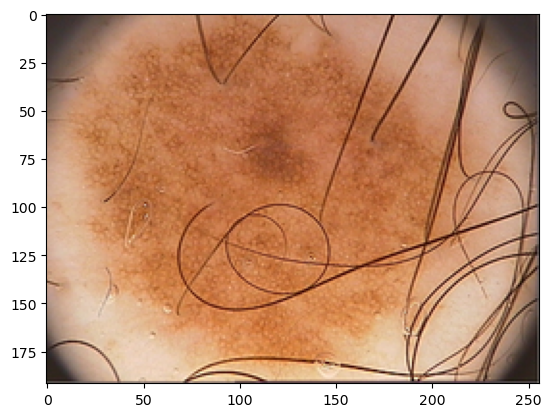

In [58]:
# selecting the image for interpretability
r_ind = random.randint(0, x_test.shape[0]-1)
test_img_input = np.expand_dims(x_test[r_ind], 0)
plt.imshow(x_test[r_ind])

### Maximum Intensity Projections

In [59]:
def make_mips(image_path, output_dir):
    image = sitk.ReadImage(image_path)
    image_size = image.GetSize()

    basename = os.path.basename(image_path)
    if not os.path.isdir(output_dir):
        os.makedirs(output_dir)

    for dim in range(3):
        projection = sitk.MaximumProjection(image, dim)

        if image_size[dim] % 2:  # odd number
            voxel = [0, 0, 0]
            voxel[dim] = (image_size[dim] - 1) / 2
            origin = image.TransformIndexToPhysicalPoint(voxel)
        else:  # even
            voxel1 = np.array([0, 0, 0], int)
            voxel2 = np.array([0, 0, 0], int)
            voxel1[dim] = image_size[dim] / 2 - 1
            voxel2[dim] = image_size[dim] / 2
            point1 = np.array(image.TransformIndexToPhysicalPoint(voxel1.tolist()))
            point2 = np.array(image.TransformIndexToPhysicalPoint(voxel2.tolist()))
            origin = np.mean(np.vstack((point1, point2)), 0)
        projection.SetOrigin(origin)
        projection.SetDirection(image.GetDirection())
        proj_basename = basename.replace('.nii.gz', '_mip_{}.nii.gz'.format(dim))
        sitk.WriteImage(projection, os.path.join(output_dir, proj_basename))


### Feature maps of convolutional blocks

In [60]:
combined_conv_blocks = [conv1, conv2, conv3, conv4, conv5]

In [61]:
combined_deconv_blocks = [up1, up2, up3, up4, up5]

In [62]:
for i in range(5):
    in_to_intermediate = Model(inputs=combined_segnet.inputs, outputs=combined_conv_blocks[i])
    int_out = in_to_intermediate.predict(test_img_input)

    path_to_save = 'Feature_maps/combined_segnet/conv_'+str(i)+'.nii'

    converted_array = np.array(int_out[0], dtype=np.float32) # You need to replace normal array by yours
    affine = np.eye(4)
    nifti_file = nib.Nifti1Image(converted_array, affine)

    nib.save(nifti_file, path_to_save)

1/1 [==============================] - 0s 331ms/step


In [63]:
for i in range(5):
    image_path = 'Feature_maps/combined_segnet/conv_'+str(i)+'.nii'
    output_dir = 'Feature_maps/combined_segnet/mip/'
    make_mips(image_path, output_dir)

In [64]:
for i in range(5):
    out_np_path = 'Feature_maps/combined_segnet/mip/conv_'+str(i)+'.nii'
    out_img = nib.load(out_np_path)
    out_img = np.array(out_img.dataobj, dtype='int16')
    out_img = np.squeeze(out_img)
    cv2.imwrite('Feature_maps/combined_segnet/mip/conv_img_'+str(i)+'.png', out_img)

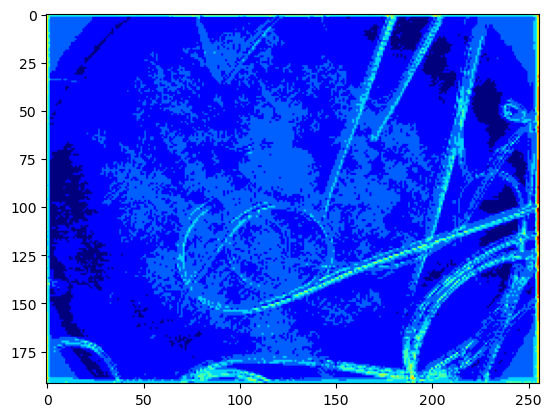

In [65]:
fname = 'Feature_maps/combined_segnet/mip/conv_img_0.png'
plt.imshow(Image.open(fname), cmap = 'jet');

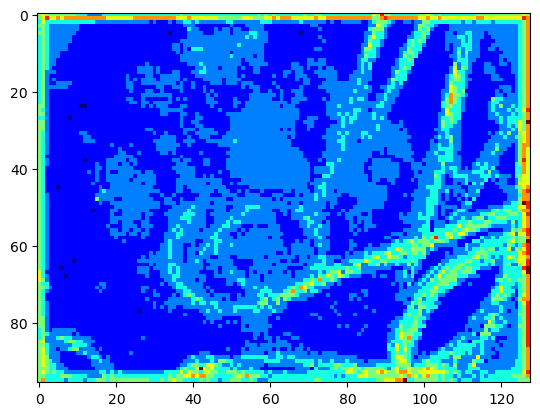

In [66]:
fname = 'Feature_maps/combined_segnet/mip/conv_img_1.png'
plt.imshow(Image.open(fname), cmap = 'jet');

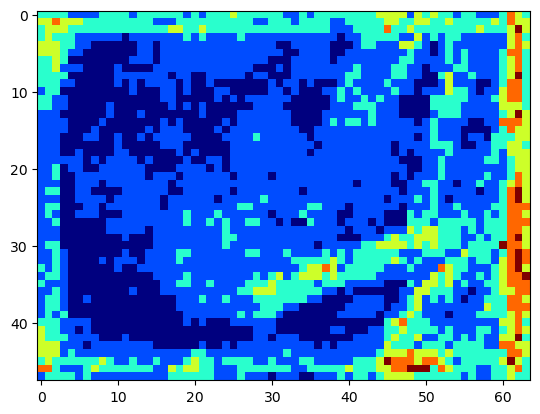

In [67]:
fname = 'Feature_maps/combined_segnet/mip/conv_img_2.png'
plt.imshow(Image.open(fname), cmap = 'jet');

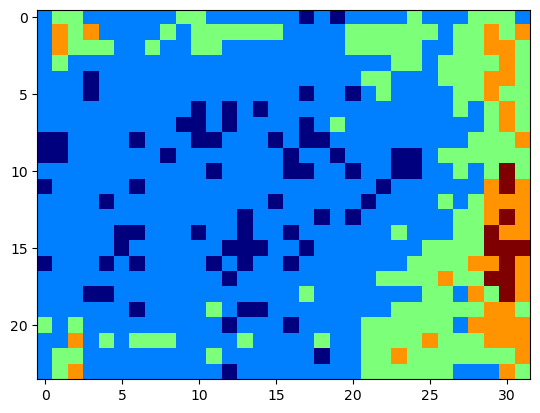

In [68]:
fname = 'Feature_maps/combined_segnet/mip/conv_img_3.png'
plt.imshow(Image.open(fname), cmap = 'jet');

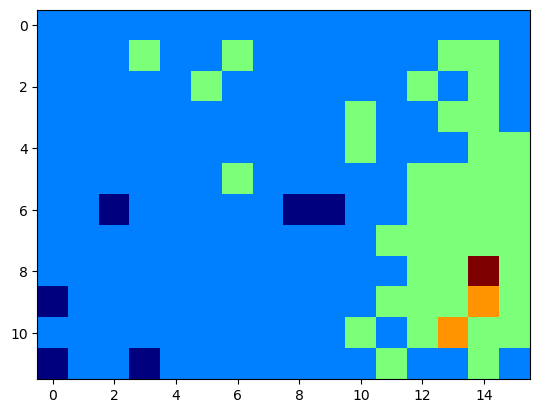

In [69]:
fname = 'Feature_maps/combined_segnet/mip/conv_img_4.png'
plt.imshow(Image.open(fname), cmap = 'jet');

### Feature maps of de-convolutional blocks

In [70]:
for i in range(5):
    in_to_intermediate = Model(inputs=combined_segnet.inputs, outputs=combined_deconv_blocks[i])
    int_out = in_to_intermediate.predict(test_img_input)

    path_to_save = 'Feature_maps/combined_segnet/deconv_'+str(i)+'.nii'

    converted_array = np.array(int_out[0], dtype=np.float32) # You need to replace normal array by yours
    affine = np.eye(4)
    nifti_file = nib.Nifti1Image(converted_array, affine)

    nib.save(nifti_file, path_to_save)

1/1 [==============================] - 1s 909ms/step


In [71]:
for i in range(5):
    image_path = 'Feature_maps/combined_segnet/deconv_'+str(i)+'.nii'
    output_dir = 'Feature_maps/combined_segnet/mip/'
    make_mips(image_path, output_dir)

In [72]:
for i in range(5):
    out_np_path = 'Feature_maps/combined_segnet/mip/deconv_'+str(i)+'.nii'
    out_img = nib.load(out_np_path)
    out_img = np.array(out_img.dataobj, dtype='int16')
    out_img = np.squeeze(out_img)
    cv2.imwrite('Feature_maps/combined_segnet/mip/de_img_'+str(i)+'.png', out_img)

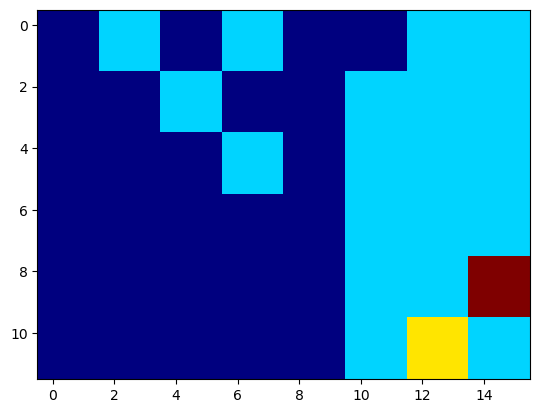

In [73]:
fname = 'Feature_maps/combined_segnet/mip/de_img_0.png'
plt.imshow(Image.open(fname), cmap = 'jet');

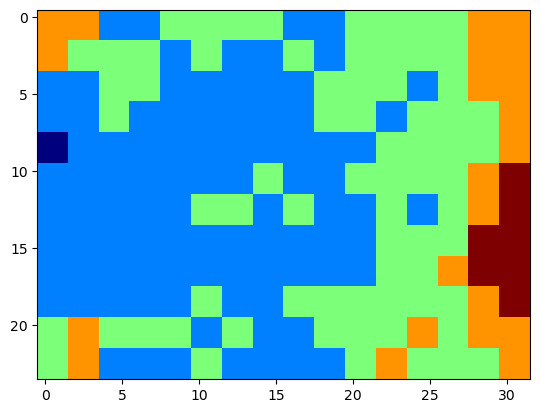

In [74]:
fname = 'Feature_maps/combined_segnet/mip/de_img_1.png'
plt.imshow(Image.open(fname), cmap = 'jet');

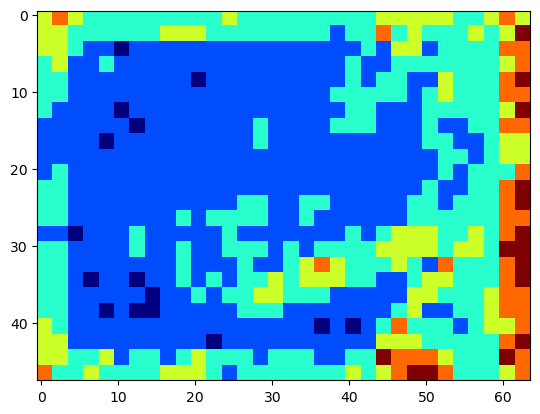

In [75]:
fname = 'Feature_maps/combined_segnet/mip/de_img_2.png'
plt.imshow(Image.open(fname), cmap = 'jet');

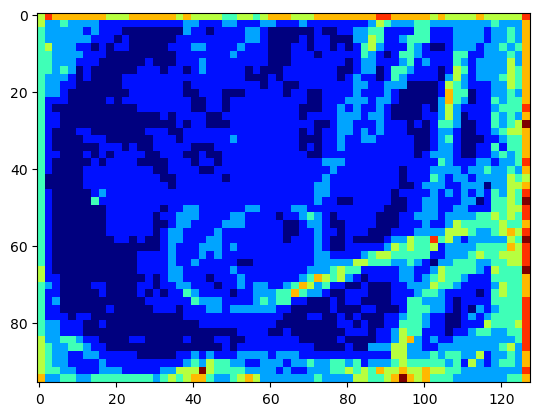

In [76]:
fname = 'Feature_maps/combined_segnet/mip/de_img_3.png'
plt.imshow(Image.open(fname), cmap = 'jet');

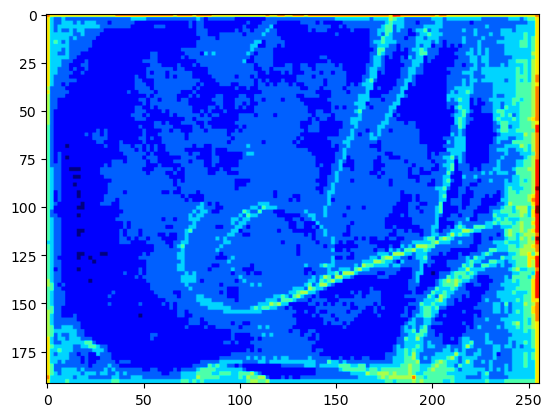

In [77]:
fname = 'Feature_maps/combined_segnet/mip/de_img_4.png'
plt.imshow(Image.open(fname), cmap = 'jet');

# 3. Segnet + Residual convolutions

In [78]:
def repeat_elem(tensor, rep):
    # lambda function to repeat Repeats the elements of a tensor along an axis
    #by a factor of rep.
    # If tensor has shape (None, 256,256,3), lambda will return a tensor of shape 
    #(None, 256,256,6), if specified axis=3 and rep=2.

     return layers.Lambda(lambda x, repnum: K.repeat_elements(x, repnum, axis=3),
                          arguments={'repnum': rep})(tensor)


def res_conv_block_2(x, filter_size, size, dropout, batch_norm=False):
    '''
    Residual convolutional layer.
    Two variants....
    Either put activation function before the addition with shortcut
    or after the addition (which would be as proposed in the original resNet).
    
    1. conv - BN - Activation - conv - BN - Activation 
                                          - shortcut  - BN - shortcut+BN
                                          
    2. conv - BN - Activation - conv - BN   
                                     - shortcut  - BN - shortcut+BN - Activation                                     
    
    Check fig 4 in https://arxiv.org/ftp/arxiv/papers/1802/1802.06955.pdf
    '''

    conv = layers.Conv2D(size, (filter_size, filter_size), padding='same')(x)
    if batch_norm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    conv = layers.Activation('relu')(conv)
    
    conv = layers.Conv2D(size, (filter_size, filter_size), padding='same')(conv)
    if batch_norm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    #conv = layers.Activation('relu')(conv)    #Activation before addition with shortcut
    if dropout > 0:
        conv = layers.Dropout(dropout)(conv)

    shortcut = layers.Conv2D(size, kernel_size=(1, 1), padding='same')(x)
    if batch_norm is True:
        shortcut = layers.BatchNormalization(axis=3)(shortcut)

    res_path = layers.add([shortcut, conv])
    res_path = layers.Activation('relu')(res_path)    #Activation after addition with shortcut (Original residual block)
    return res_path

def res_conv_block_3(x, filter_size, size, dropout, batch_norm=False):
    '''
    Residual convolutional layer.
    Two variants....
    Either put activation function before the addition with shortcut
    or after the addition (which would be as proposed in the original resNet).
    
    1. conv - BN - Activation - conv - BN - Activation 
                                          - shortcut  - BN - shortcut+BN
                                          
    2. conv - BN - Activation - conv - BN   
                                     - shortcut  - BN - shortcut+BN - Activation                                     
    
    Check fig 4 in https://arxiv.org/ftp/arxiv/papers/1802/1802.06955.pdf
    '''

    conv = layers.Conv2D(size, (filter_size, filter_size), padding='same')(x)
    if batch_norm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    conv = layers.Activation('relu')(conv)
    
    conv = layers.Conv2D(size, (filter_size, filter_size), padding='same')(conv)
    if batch_norm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    conv = layers.Activation('relu')(conv)
    
    conv = layers.Conv2D(size, (filter_size, filter_size), padding='same')(conv)
    if batch_norm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    #conv = layers.Activation('relu')(conv)    #Activation before addition with shortcut
    if dropout > 0:
        conv = layers.Dropout(dropout)(conv)

    shortcut = layers.Conv2D(size, kernel_size=(1, 1), padding='same')(x)
    if batch_norm is True:
        shortcut = layers.BatchNormalization(axis=3)(shortcut)

    res_path = layers.add([shortcut, conv])
    res_path = layers.Activation('relu')(res_path)
    return res_path

In [79]:
def ressegnet(input_shape, NUM_CLASSES=1, dropout_rate=0.0, batch_norm=True):
    '''
    Residual segnet
    
    '''
    # network structure
    FILTER_NUM = 64 # number of basic filters for the first layer
    FILTER_SIZE = 3 # size of the convolutional filter
    UP_SAMP_SIZE = 2 # size of upsampling filters
    # input data
    # dimension of the image depth
    inputs = layers.Input(input_shape, dtype=tf.float32)
    
    axis = 3

    # Downsampling layers
    # DownRes 1, double residual convolution + pooling
    conv_64 = res_conv_block_2(inputs, FILTER_SIZE, FILTER_NUM, dropout_rate, batch_norm)
    pool_64 = layers.MaxPooling2D(pool_size=(2,2))(conv_64)
    # DownRes 2
    conv_128 = res_conv_block_2(pool_64, FILTER_SIZE, 2*FILTER_NUM, dropout_rate, batch_norm)
    pool_128 = layers.MaxPooling2D(pool_size=(2,2))(conv_128)
    # DownRes 3
    conv_256 = res_conv_block_3(pool_128, FILTER_SIZE, 4*FILTER_NUM, dropout_rate, batch_norm)
    pool_256 = layers.MaxPooling2D(pool_size=(2,2))(conv_256)
    # DownRes 4
    conv_512_1 = res_conv_block_3(pool_256, FILTER_SIZE, 8*FILTER_NUM, dropout_rate, batch_norm)
    pool_512_1 = layers.MaxPooling2D(pool_size=(2,2))(conv_512_1)
    # DownRes 5
    conv_512_2 = res_conv_block_3(pool_512_1, FILTER_SIZE, 8*FILTER_NUM, dropout_rate, batch_norm)
    pool_512_2 = layers.MaxPooling2D(pool_size=(2,2))(conv_512_2)
    # DownRes 6, convolution only
    bridge = res_conv_block_2(pool_512_2, FILTER_SIZE, 16*FILTER_NUM, dropout_rate, batch_norm)

    # Upsampling layers
    # UpRes 7, attention gated concatenation + upsampling + double residual convolution
#     gating_512_2 = gating_signal(bridge, 8*FILTER_NUM, batch_norm)
#     att_512_2 = attention_block(conv_512_2, gating_512_2, 8*FILTER_NUM)
    up_512_2 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(bridge)
    up_512_2 = layers.concatenate([up_512_2, conv_512_2], axis=axis)
    up_conv_512_2 = res_conv_block_3(up_512_2, FILTER_SIZE, 8*FILTER_NUM, dropout_rate, batch_norm)
    # UpRes 8
#     gating_512_1 = gating_signal(up_conv_512_2, 8*FILTER_NUM, batch_norm)
#     att_512_1 = attention_block(conv_512_1, gating_512_1, 8*FILTER_NUM)
    up_512_1 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(up_conv_512_2)
    up_512_1 = layers.concatenate([up_512_1, conv_512_1], axis=axis)
    up_conv_512_1 = res_conv_block_3(up_512_1, FILTER_SIZE, 8*FILTER_NUM, dropout_rate, batch_norm)
    # UpRes 9
#     gating_256 = gating_signal(up_conv_512_1, 4*FILTER_NUM, batch_norm)
#     att_256 = attention_block(conv_256, gating_256, 4*FILTER_NUM)
    up_256 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(up_conv_512_1)
    up_256 = layers.concatenate([up_256, conv_256], axis=axis)
    up_conv_256 = res_conv_block_3(up_256, FILTER_SIZE, 4*FILTER_NUM, dropout_rate, batch_norm)
    # UpRes 10
#     gating_128 = gating_signal(up_conv_256, 2*FILTER_NUM, batch_norm)
#     att_128 = attention_block(conv_128, gating_128, 2*FILTER_NUM)
    up_128 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(up_conv_256)
    up_128 = layers.concatenate([up_128, conv_128], axis=axis)
    up_conv_128 = res_conv_block_2(up_128, FILTER_SIZE, 2*FILTER_NUM, dropout_rate, batch_norm)
    # UpRes 9
#     gating_64 = gating_signal(up_conv_128, FILTER_NUM, batch_norm)
#     att_64 = attention_block(conv_64, gating_64, FILTER_NUM)
    up_64 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(up_conv_128)
    up_64 = layers.concatenate([up_64, conv_64], axis=axis)
    up_conv_64 = res_conv_block_2(up_64, FILTER_SIZE, FILTER_NUM, dropout_rate, batch_norm)

    # 1*1 convolutional layers
    
    conv_final = layers.Conv2D(NUM_CLASSES, kernel_size=(1,1))(up_conv_64)
    conv_final = layers.BatchNormalization(axis=axis)(conv_final)
    conv_final = layers.Activation('sigmoid')(conv_final)  #Change to softmax for multichannel

    # Model integration
    model = models.Model(inputs, conv_final, name="ressegnet")
    return model, inputs, conv_512_2, conv_512_1, conv_256, conv_128, conv_64, up_conv_512_2, up_conv_512_1, up_conv_256, up_conv_128, up_conv_64

In [80]:
ressegnet_model, input_inter, conv_512_2, conv_512_1, conv_256, conv_128, conv_64, up_conv_512_2, up_conv_512_1, up_conv_256, up_conv_128, up_conv_64 = ressegnet(input_shape)

ressegnet_model.compile(optimizer=Adam(lr = 1e-2), loss=BinaryFocalLoss(gamma=2), 
              metrics=['accuracy', jacard_coef])

print(ressegnet_model.summary())


start3 = datetime.now() 
ressegnet_history = ressegnet_model.fit(x_train, y_train_exp, 
                    verbose=1,
                    batch_size = batch_size,
                    validation_data=(x_test, y_test_exp), 
                    shuffle=False,
                    epochs=100)
stop3 = datetime.now()

#Execution time of the model 
execution_time_ressegnet = stop3-start3
print("Residual segnet execution time is: ", execution_time_ressegnet)

ressegnet_model.save('skin_residual_150epochs_B_focal.hdf5')


Model: "ressegnet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 192, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 192, 256, 64  1792        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 192, 256, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                         

                                                                                                  
 batch_normalization_9 (BatchNo  (None, 48, 64, 256)  1024       ['conv2d_9[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_8 (BatchNo  (None, 48, 64, 256)  1024       ['conv2d_8[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 add_2 (Add)                    (None, 48, 64, 256)  0           ['batch_normalization_9[0][0]',  
                                                                  'batch_normalization_8[0][0]']  
                                                                                                  
 activatio

                                                                                                  
 activation_65 (Activation)     (None, 6, 8, 1024)   0           ['batch_normalization_18[0][0]'] 
                                                                                                  
 conv2d_20 (Conv2D)             (None, 6, 8, 1024)   525312      ['max_pooling2d_14[0][0]']       
                                                                                                  
 conv2d_19 (Conv2D)             (None, 6, 8, 1024)   9438208     ['activation_65[0][0]']          
                                                                                                  
 batch_normalization_20 (BatchN  (None, 6, 8, 1024)  4096        ['conv2d_20[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_nor

/home/ok_sikha/anaconda3/envs/tf_gpu_segnet/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


 conv2d_27 (Conv2D)             (None, 24, 32, 512)  2359808     ['activation_71[0][0]']          
                                                                                                  
 batch_normalization_28 (BatchN  (None, 24, 32, 512)  2048       ['conv2d_28[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_27 (BatchN  (None, 24, 32, 512)  2048       ['conv2d_27[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 add_7 (Add)                    (None, 24, 32, 512)  0           ['batch_normalization_28[0][0]', 
                                                                  'batch_normalization_27[0][0]'] 
          

                                                                                                  
 concatenate_9 (Concatenate)    (None, 192, 256, 19  0           ['up_sampling2d_14[0][0]',       
                                2)                                'activation_53[0][0]']          
                                                                                                  
 conv2d_36 (Conv2D)             (None, 192, 256, 64  110656      ['concatenate_9[0][0]']          
                                )                                                                 
                                                                                                  
 batch_normalization_36 (BatchN  (None, 192, 256, 64  256        ['conv2d_36[0][0]']              
 ormalization)                  )                                                                 
                                                                                                  
 activatio

Epoch 65/100
45/45 [==============================] - 8s 189ms/step - loss: 0.0110 - accuracy: 0.9829 - jacard_coef: 0.7733 - val_loss: 0.0837 - val_accuracy: 0.9449 - val_jacard_coef: 0.6921
Epoch 66/100
45/45 [==============================] - 8s 188ms/step - loss: 0.0114 - accuracy: 0.9823 - jacard_coef: 0.7721 - val_loss: 0.4213 - val_accuracy: 0.9039 - val_jacard_coef: 0.6354
Epoch 67/100
45/45 [==============================] - 8s 187ms/step - loss: 0.0127 - accuracy: 0.9804 - jacard_coef: 0.7680 - val_loss: 0.4148 - val_accuracy: 0.9132 - val_jacard_coef: 0.6670
Epoch 68/100
45/45 [==============================] - 9s 190ms/step - loss: 0.0115 - accuracy: 0.9822 - jacard_coef: 0.7670 - val_loss: 0.1069 - val_accuracy: 0.9403 - val_jacard_coef: 0.6778
Epoch 69/100
45/45 [==============================] - 8s 187ms/step - loss: 0.0119 - accuracy: 0.9817 - jacard_coef: 0.7759 - val_loss: 0.3976 - val_accuracy: 0.9137 - val_jacard_coef: 0.6500
Epoch 70/100
45/45 [====================

### Loading the model

In [31]:
# # model = att_res_SegNet_model
# # skin_AttResSegNet_150epochs_B_focal.hdf5
# model_path = "Master_weights/2_skin_residual_only_93_meaniou.hdf5"
# ressegnet_model = tf.keras.models.load_model(model_path, compile=False)

# Visualizations

In [82]:
ressegnet_history_df = pd.DataFrame(ressegnet_history.history) 

with open('custom_code_att_res_SegNet_history_df.csv', mode='w') as f:
    ressegnet_history_df.to_csv(f) 

### Training loss vs Validation loss

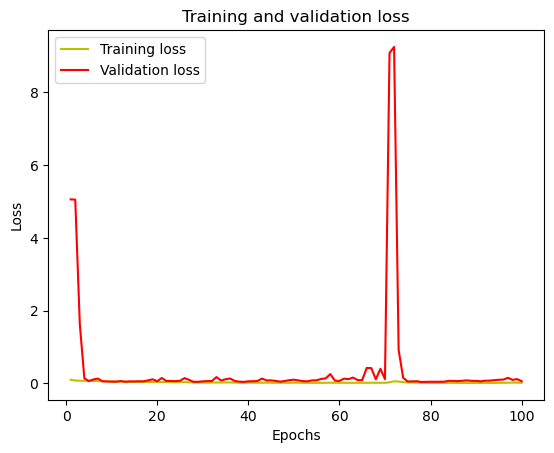

In [83]:
history = ressegnet_history

#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Training Jaccard vs Validation Jaccard

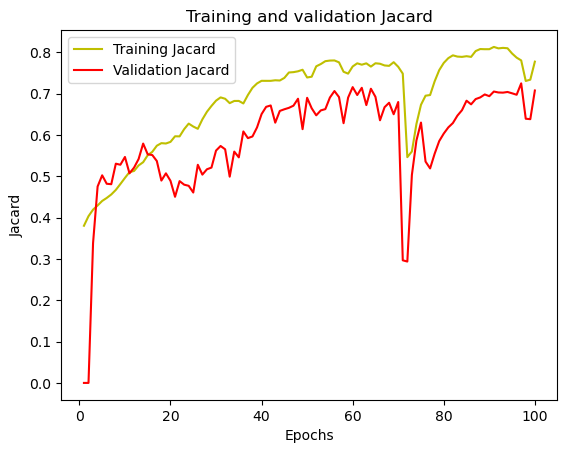

In [84]:
acc = history.history['jacard_coef']
#acc = history.history['accuracy']
val_acc = history.history['val_jacard_coef']
#val_acc = history.history['val_accuracy']

plt.plot(epochs, acc, 'y', label='Training Jacard')
plt.plot(epochs, val_acc, 'r', label='Validation Jacard')
plt.title('Training and validation Jacard')
plt.xlabel('Epochs')
plt.ylabel('Jacard')
plt.legend()
plt.show()

### Predictions

1/1 [==============================] - 1s 1s/step


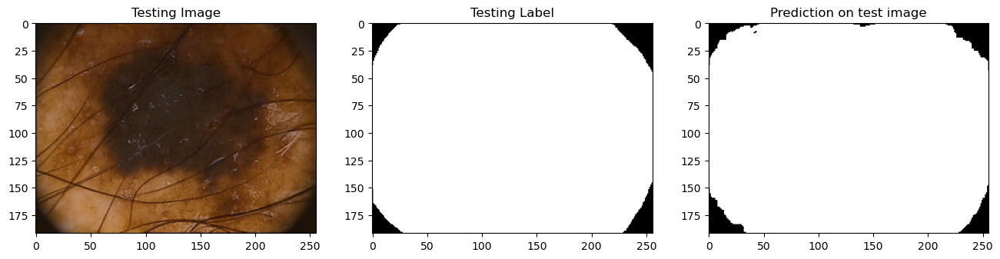

In [32]:
model = ressegnet_model

test_img_number = random.randint(0, x_test.shape[0]-1)
test_img = x_test[test_img_number]
ground_truth=y_test_exp[test_img_number]

test_img_input=np.expand_dims(test_img, 0)
prediction = (model.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img, cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], cmap='gray')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(prediction, cmap='gray')

plt.show()

### IoU for the above prediction

In [33]:
n_classes = 2
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(ground_truth[:,:,0], prediction)
print("IoU for the above prediction =", IOU_keras.result().numpy())

IoU for the above prediction = 0.8715135


### Mean IoU for all the images in the dataset

In [34]:
sum_iou=0
for test_img_number in range(X_train.shape[0]):
    test_img = X_train[test_img_number]
    ground_truth=Y_train_exp[test_img_number]

    test_img_input=np.expand_dims(test_img, 0)
    prediction = (model.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8)
    
    IOU_keras = MeanIoU(num_classes=n_classes)  
    IOU_keras.update_state(ground_truth[:,:,0], prediction)
    sum_iou+=IOU_keras.result().numpy()*100
    print("IoU for the current prediction =", IOU_keras.result().numpy())
print("Mean IoU: ",sum_iou/X_train.shape[0])

1/1 [==============================] - 0s 78ms/step
IoU for the current prediction = 0.95290804
1/1 [==============================] - 0s 73ms/step
IoU for the current prediction = 0.92491734
1/1 [==============================] - 0s 53ms/step
IoU for the current prediction = 0.8873878
1/1 [==============================] - 0s 55ms/step
IoU for the current prediction = 0.89475375
1/1 [==============================] - 0s 53ms/step
IoU for the current prediction = 0.86797154
1/1 [==============================] - 0s 32ms/step
IoU for the current prediction = 0.8741008
1/1 [==============================] - 0s 68ms/step
IoU for the current prediction = 0.93910336
1/1 [==============================] - 0s 86ms/step
IoU for the current prediction = 0.9300573
1/1 [==============================] - 0s 53ms/step
IoU for the current prediction = 0.9422662
1/1 [==============================] - 0s 84ms/step
IoU for the current prediction = 0.7484453
1/1 [==============================] - 0s 69m

1/1 [==============================] - 0s 67ms/step
IoU for the current prediction = 0.96318275
1/1 [==============================] - 0s 60ms/step
IoU for the current prediction = 0.9591688
1/1 [==============================] - 0s 83ms/step
IoU for the current prediction = 0.9574951
1/1 [==============================] - 0s 76ms/step
IoU for the current prediction = 0.9104383
1/1 [==============================] - 0s 42ms/step
IoU for the current prediction = 0.9529264
1/1 [==============================] - 0s 38ms/step
IoU for the current prediction = 0.9221348
1/1 [==============================] - 0s 63ms/step
IoU for the current prediction = 0.88399655
1/1 [==============================] - 0s 73ms/step
IoU for the current prediction = 0.9561607
1/1 [==============================] - 0s 67ms/step
IoU for the current prediction = 0.9406744
1/1 [==============================] - 0s 34ms/step
IoU for the current prediction = 0.81546116
1/1 [==============================] - 0s 35ms/

1/1 [==============================] - 0s 44ms/step
IoU for the current prediction = 0.4637646
1/1 [==============================] - 0s 79ms/step
IoU for the current prediction = 0.92443585
1/1 [==============================] - 0s 54ms/step
IoU for the current prediction = 0.9526088
1/1 [==============================] - 0s 63ms/step
IoU for the current prediction = 0.86096245
1/1 [==============================] - 0s 104ms/step
IoU for the current prediction = 0.9101003
1/1 [==============================] - 0s 33ms/step
IoU for the current prediction = 0.9832115
1/1 [==============================] - 0s 80ms/step
IoU for the current prediction = 0.8881688
1/1 [==============================] - 0s 75ms/step
IoU for the current prediction = 0.8715135
1/1 [==============================] - 0s 91ms/step
IoU for the current prediction = 0.6080369
1/1 [==============================] - 0s 58ms/step
IoU for the current prediction = 0.9008749
1/1 [==============================] - 0s 33ms/

### Interpretability

In [88]:
def visualize_conv_layer(int_out, row_size, col_size):
   
  img_index=0

  print(np.shape(int_out))
  
  fig,ax=plt.subplots(row_size,col_size, figsize=(20, 5))
  for row in range(0,row_size):
    for col in range(0,col_size):
      ax[row][col].imshow(int_out[0, :, :, img_index], cmap='jet')
      ax[row][col].axis('off')
      img_index=img_index+1
        
print("Function to Visualize the Output has been Created")

Function to Visualize the Output has been Created


Convolutional block 1
1/1 [==============================] - 0s 413ms/step
(1, 12, 16, 512)


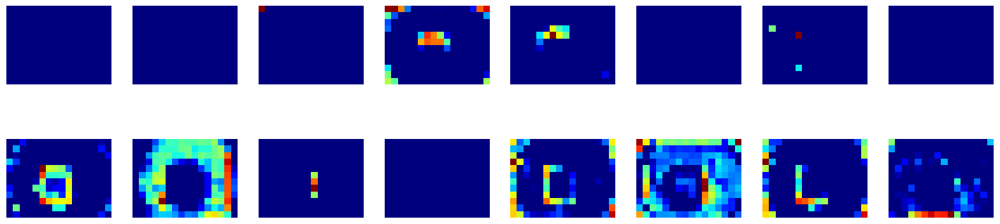

In [89]:
ressegnet_conv_blocks = [conv_512_2, conv_512_1, conv_256, conv_128, conv_64]
print("Convolutional block 1")
in_to_intermediate = Model(inputs=input_inter, outputs=ressegnet_conv_blocks[0])
int_out = in_to_intermediate.predict(test_img_input)
visualize_conv_layer(int_out,2,8)

Convolutional block 2
1/1 [==============================] - 0s 328ms/step
(1, 24, 32, 512)


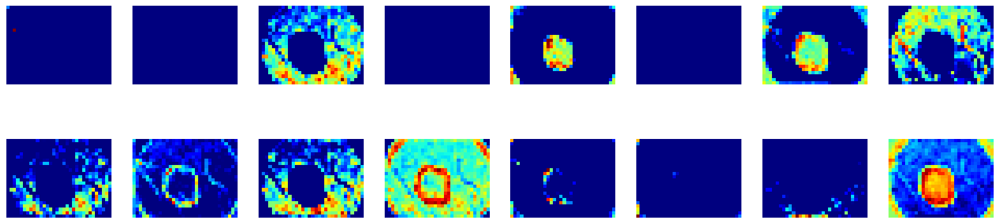

In [90]:
print("Convolutional block 2")
in_to_intermediate = Model(inputs=input_inter, outputs=ressegnet_conv_blocks[1])
int_out = in_to_intermediate.predict(test_img_input)
visualize_conv_layer(int_out,2 ,8)

Convolutional block 3
1/1 [==============================] - 0s 246ms/step
(1, 48, 64, 256)


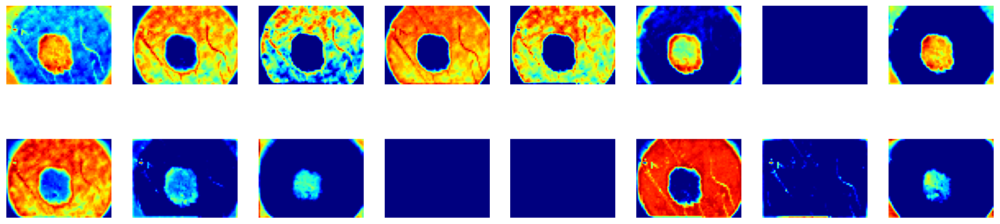

In [91]:
print("Convolutional block 3")
in_to_intermediate = Model(inputs=input_inter, outputs=ressegnet_conv_blocks[2])
int_out = in_to_intermediate.predict(test_img_input)
visualize_conv_layer(int_out,2,8)

Convolutional block 4
1/1 [==============================] - 0s 260ms/step
(1, 96, 128, 128)


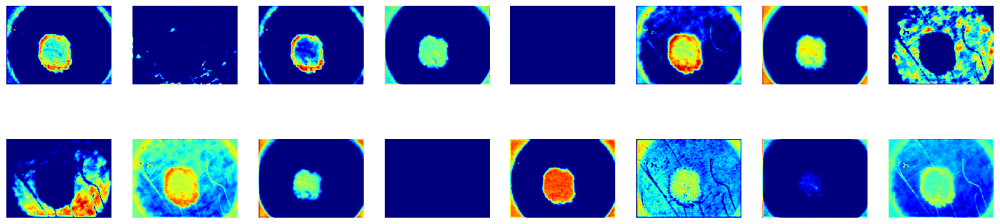

In [92]:
print("Convolutional block 4")
in_to_intermediate = Model(inputs=input_inter, outputs=ressegnet_conv_blocks[3])
int_out = in_to_intermediate.predict(test_img_input)
visualize_conv_layer(int_out,2,8)

Convolutional block 5
1/1 [==============================] - 0s 158ms/step
(1, 192, 256, 64)


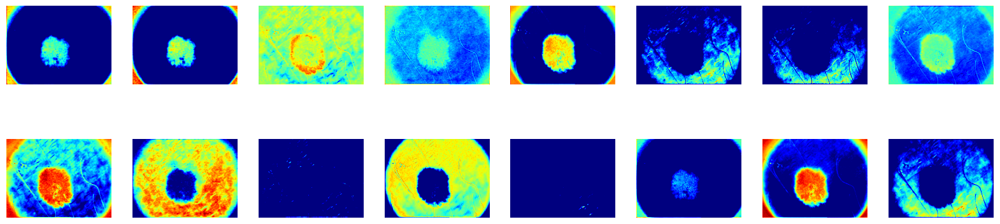

In [93]:
print("Convolutional block 5")
in_to_intermediate = Model(inputs=input_inter, outputs=ressegnet_conv_blocks[4])
int_out = in_to_intermediate.predict(test_img_input)
visualize_conv_layer(int_out,2,8)

In [94]:
ressegnet_de_conv_blocks = [up_conv_512_2, up_conv_512_1, up_conv_256, up_conv_128, up_conv_64]

Deconvolutional block 1
1/1 [==============================] - 1s 687ms/step
(1, 12, 16, 512)


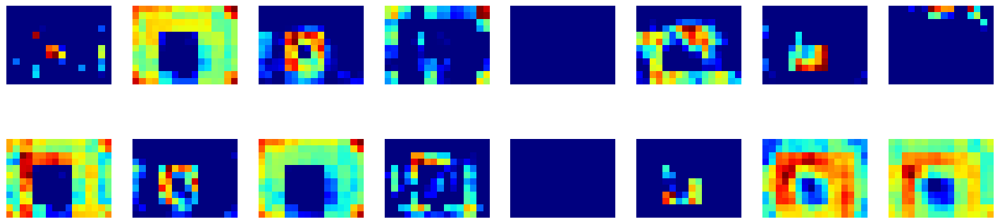

In [95]:
print("Deconvolutional block 1")
in_to_intermediate = Model(inputs=input_inter, outputs=ressegnet_de_conv_blocks[0])
int_out = in_to_intermediate.predict(test_img_input)
visualize_conv_layer(int_out,2,8)

Deconvolutional block 2
1/1 [==============================] - 1s 682ms/step
(1, 24, 32, 512)


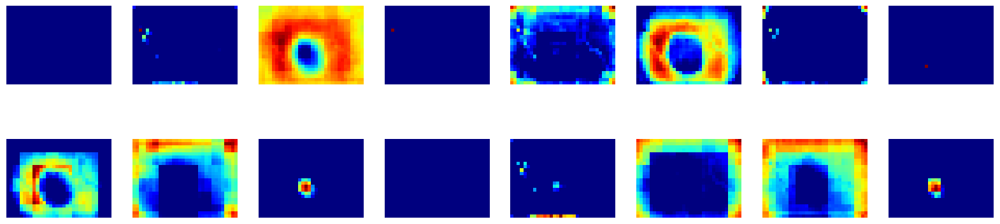

In [96]:
print("Deconvolutional block 2")
in_to_intermediate = Model(inputs=input_inter, outputs=ressegnet_de_conv_blocks[1])
int_out = in_to_intermediate.predict(test_img_input)
visualize_conv_layer(int_out,2,8)

Deconvolutional block 3
1/1 [==============================] - 1s 1s/step
(1, 48, 64, 256)


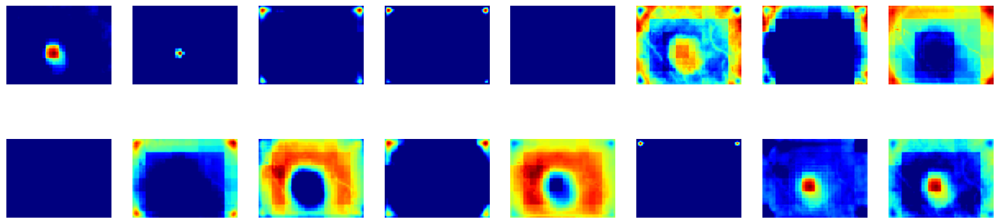

In [97]:
print("Deconvolutional block 3")
in_to_intermediate = Model(inputs=input_inter, outputs=ressegnet_de_conv_blocks[2])
int_out = in_to_intermediate.predict(test_img_input)
visualize_conv_layer(int_out,2,8)

Deconvolutional block 4
1/1 [==============================] - 1s 955ms/step
(1, 96, 128, 128)


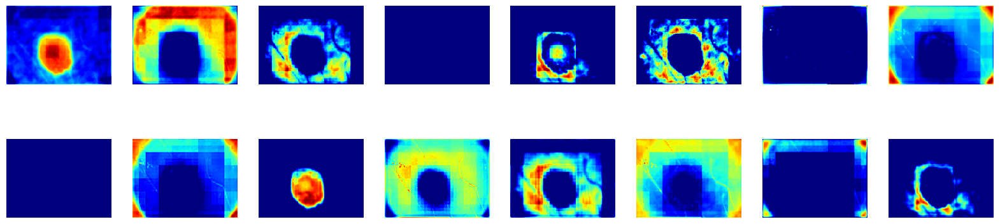

In [98]:
print("Deconvolutional block 4")
in_to_intermediate = Model(inputs=input_inter, outputs=ressegnet_de_conv_blocks[3])
int_out = in_to_intermediate.predict(test_img_input)
visualize_conv_layer(int_out,2,8)

Deconvolutional block 5
1/1 [==============================] - 1s 995ms/step
(1, 192, 256, 64)


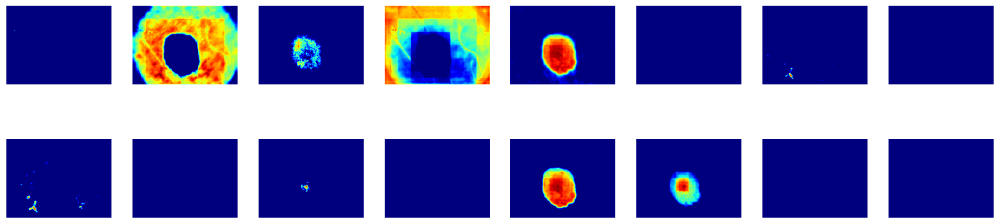

In [99]:
print("Deconvolutional block 5")
in_to_intermediate = Model(inputs=input_inter, outputs=ressegnet_de_conv_blocks[4])
int_out = in_to_intermediate.predict(test_img_input)
visualize_conv_layer(int_out,2,8)

### Maximum Intensity Projections

In [100]:
def make_mips(image_path, output_dir):
    image = sitk.ReadImage(image_path)
    image_size = image.GetSize()

    basename = os.path.basename(image_path)
    if not os.path.isdir(output_dir):
        os.makedirs(output_dir)

    for dim in range(3):
        projection = sitk.MaximumProjection(image, dim)

        if image_size[dim] % 2:  # odd number
            voxel = [0, 0, 0]
            voxel[dim] = (image_size[dim] - 1) / 2
            origin = image.TransformIndexToPhysicalPoint(voxel)
        else:  # even
            voxel1 = np.array([0, 0, 0], int)
            voxel2 = np.array([0, 0, 0], int)
            voxel1[dim] = image_size[dim] / 2 - 1
            voxel2[dim] = image_size[dim] / 2
            point1 = np.array(image.TransformIndexToPhysicalPoint(voxel1.tolist()))
            point2 = np.array(image.TransformIndexToPhysicalPoint(voxel2.tolist()))
            origin = np.mean(np.vstack((point1, point2)), 0)
        projection.SetOrigin(origin)
        projection.SetDirection(image.GetDirection())
        proj_basename = basename.replace('.nii.gz', '_mip_{}.nii.gz'.format(dim))
        sitk.WriteImage(projection, os.path.join(output_dir, proj_basename))

In [101]:
for i in range(5):
    in_to_intermediate = Model(inputs=ressegnet_model.inputs, outputs=ressegnet_conv_blocks[i])
    int_out = in_to_intermediate.predict(test_img_input)

    path_to_save = 'Feature_maps/residual_segnet/conv_'+str(i)+'.nii'

    converted_array = np.array(int_out[0], dtype=np.float32) # You need to replace normal array by yours
    affine = np.eye(4)
    nifti_file = nib.Nifti1Image(converted_array, affine)

    nib.save(nifti_file, path_to_save)

1/1 [==============================] - 0s 111ms/step


In [102]:
for i in range(5):
    image_path = 'Feature_maps/residual_segnet/conv_'+str(i)+'.nii'
    output_dir = 'Feature_maps/residual_segnet/mip/'
    make_mips(image_path, output_dir)

In [103]:
for i in range(5):
    out_np_path = 'Feature_maps/residual_segnet/mip/conv_'+str(i)+'.nii'
    out_img = nib.load(out_np_path)
    out_img = np.array(out_img.dataobj, dtype='int16')
    out_img = np.squeeze(out_img)
    cv2.imwrite('Feature_maps/residual_segnet/mip/conv_img_'+str(i)+'.png', out_img)

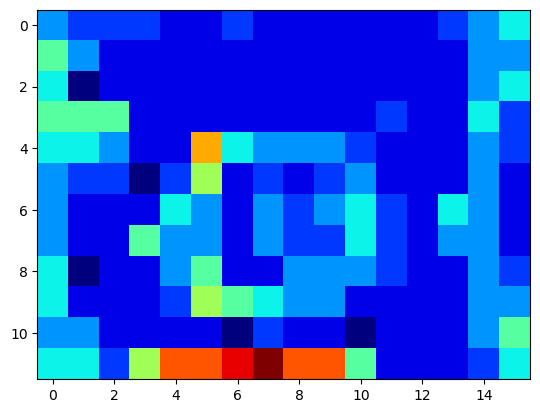

In [104]:
fname = 'Feature_maps/residual_segnet/mip/conv_img_0.png'
plt.imshow(Image.open(fname), cmap = 'jet');

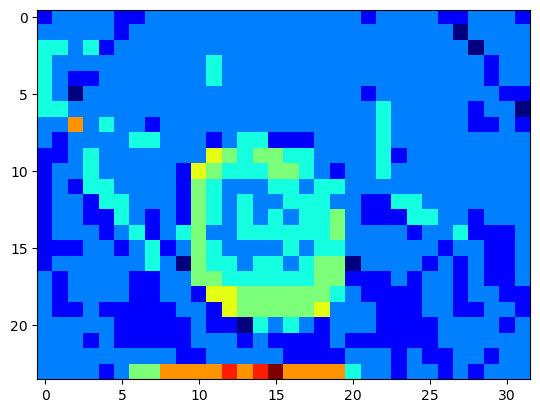

In [105]:
fname = 'Feature_maps/residual_segnet/mip/conv_img_1.png'
plt.imshow(Image.open(fname), cmap = 'jet');

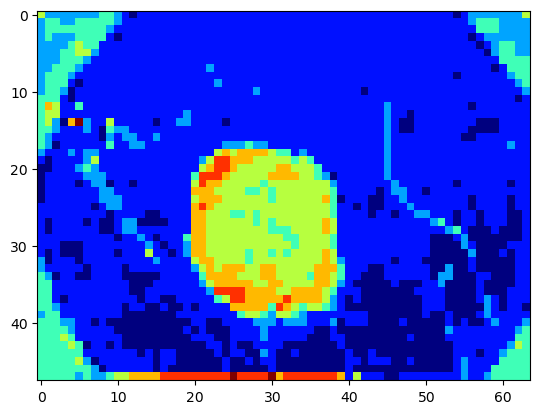

In [106]:
fname = 'Feature_maps/residual_segnet/mip/conv_img_2.png'
plt.imshow(Image.open(fname), cmap = 'jet');

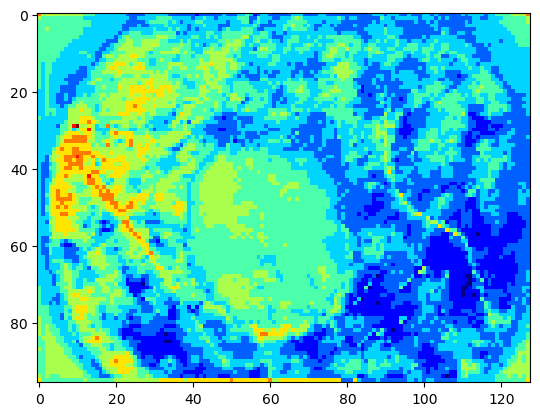

In [107]:
fname = 'Feature_maps/residual_segnet/mip/conv_img_3.png'
plt.imshow(Image.open(fname), cmap = 'jet');

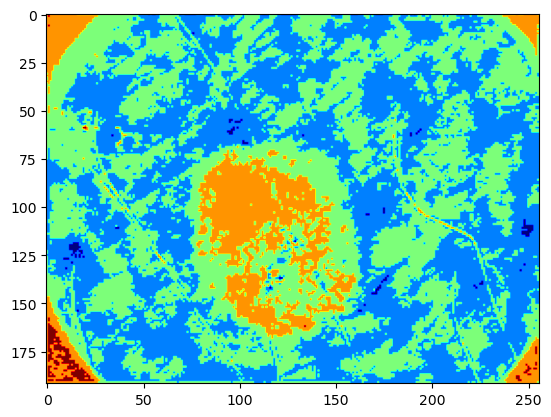

In [108]:
fname = 'Feature_maps/residual_segnet/mip/conv_img_4.png'
plt.imshow(Image.open(fname), cmap = 'jet');

### Feature maps of de-convolutional blocks

In [109]:
for i in range(5):
    in_to_intermediate = Model(inputs=ressegnet_model.inputs, outputs=ressegnet_de_conv_blocks[i])
    int_out = in_to_intermediate.predict(test_img_input)

    path_to_save = 'Feature_maps/residual_segnet/deconv_'+str(i)+'.nii'

    converted_array = np.array(int_out[0], dtype=np.float32) # You need to replace normal array by yours
    affine = np.eye(4)
    nifti_file = nib.Nifti1Image(converted_array, affine)

    nib.save(nifti_file, path_to_save)

1/1 [==============================] - 1s 902ms/step


In [110]:
for i in range(5):
    image_path = 'Feature_maps/residual_segnet/deconv_'+str(i)+'.nii'
    output_dir = 'Feature_maps/residual_segnet/mip/'
    make_mips(image_path, output_dir)

In [111]:
for i in range(5):
    out_np_path = 'Feature_maps/residual_segnet/mip/deconv_'+str(i)+'.nii'
    out_img = nib.load(out_np_path)
    out_img = np.array(out_img.dataobj, dtype='int16')
    out_img = np.squeeze(out_img)
    cv2.imwrite('Feature_maps/residual_segnet/mip/de_img_'+str(i)+'.png', out_img)

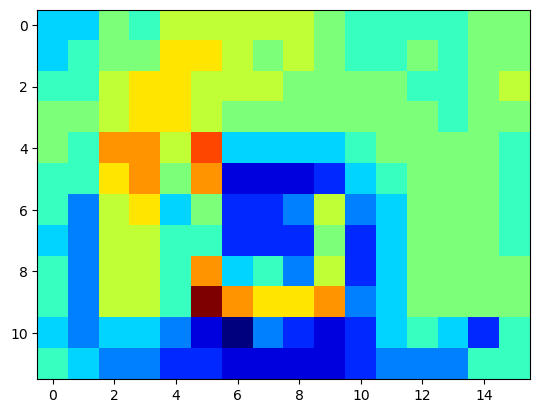

In [112]:
fname = 'Feature_maps/residual_segnet/mip/de_img_0.png'
plt.imshow(Image.open(fname), cmap = 'jet');

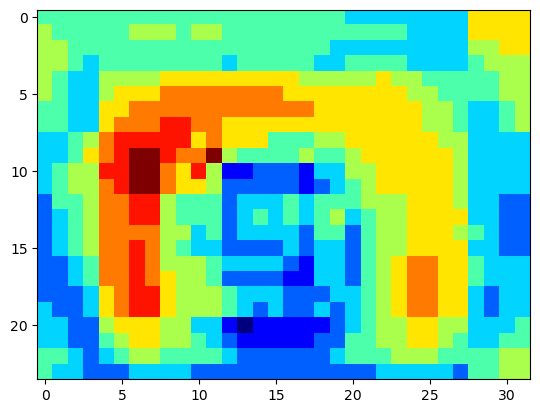

In [113]:
fname = 'Feature_maps/residual_segnet/mip/de_img_1.png'
plt.imshow(Image.open(fname), cmap = 'jet');

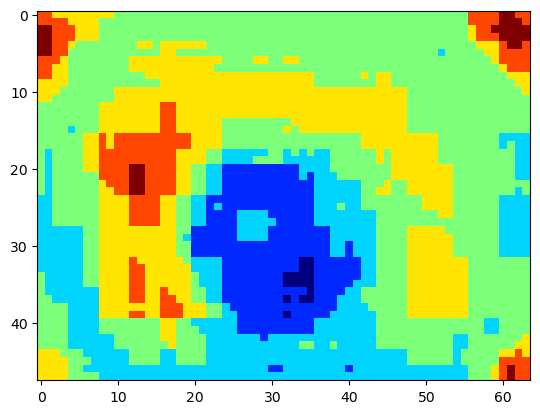

In [114]:
fname = 'Feature_maps/residual_segnet/mip/de_img_2.png'
plt.imshow(Image.open(fname), cmap = 'jet');

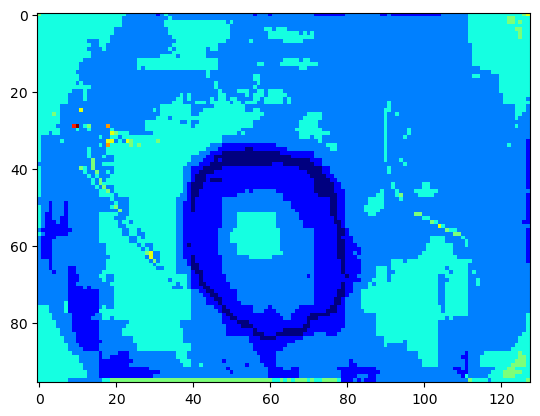

In [115]:
fname = 'Feature_maps/residual_segnet/mip/de_img_3.png'
plt.imshow(Image.open(fname), cmap = 'jet');

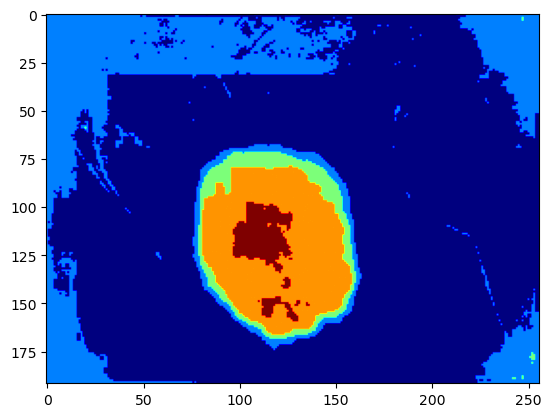

In [116]:
fname = 'Feature_maps/residual_segnet/mip/de_img_4.png'
plt.imshow(Image.open(fname), cmap = 'jet');

# 4. Segnet + Residual Convolutions + Attention gates

In [20]:
def gating_signal(input, out_size, batch_norm=False):
    """
    resize the down layer feature map into the same dimension as the up layer feature map
    using 1x1 conv
    :return: the gating feature map with the same dimension of the up layer feature map
    """
    x = layers.Conv2D(out_size, (1, 1), padding='same')(input)
    if batch_norm:
        x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    return x

def attention_block(x, gating, inter_shape):
    shape_x = K.int_shape(x)
    shape_g = K.int_shape(gating)

# Getting the x signal to the same shape as the gating signal
    theta_x = layers.Conv2D(inter_shape, (2, 2), strides=(2, 2), padding='same')(x)  # 16
    shape_theta_x = K.int_shape(theta_x)

# Getting the gating signal to the same number of filters as the inter_shape
    phi_g = layers.Conv2D(inter_shape, (1, 1), padding='same')(gating)
    upsample_g = layers.Conv2DTranspose(inter_shape, (3, 3),
                                 strides=(shape_theta_x[1] // shape_g[1], shape_theta_x[2] // shape_g[2]),
                                 padding='same')(phi_g)  # 16

    concat_xg = layers.add([upsample_g, theta_x])
    act_xg = layers.Activation('relu')(concat_xg)
    psi = layers.Conv2D(1, (1, 1), padding='same')(act_xg)
    sigmoid_xg = layers.Activation('sigmoid')(psi)
    shape_sigmoid = K.int_shape(sigmoid_xg)
    upsample_psi = layers.UpSampling2D(size=(shape_x[1] // shape_sigmoid[1], shape_x[2] // shape_sigmoid[2]))(sigmoid_xg)  # 32

    upsample_psi = repeat_elem(upsample_psi, shape_x[3])

    y = layers.multiply([upsample_psi, x])

    result = layers.Conv2D(shape_x[3], (1, 1), padding='same')(y)
    result_bn = layers.BatchNormalization()(result)
    return result_bn

In [21]:
def Attention_ResSegNet(input_shape, NUM_CLASSES=1, dropout_rate=0.0, batch_norm=True):
    '''
    Rsidual UNet, with attention 
    
    '''
    # network structure
    FILTER_NUM = 64 # number of basic filters for the first layer
    FILTER_SIZE = 3 # size of the convolutional filter
    UP_SAMP_SIZE = 2 # size of upsampling filters
    # input data
    # dimension of the image depth
    inputs = layers.Input(input_shape, dtype=tf.float32)
    
    axis = 3

    # Downsampling layers
    # DownRes 1, double residual convolution + pooling
    conv_64 = res_conv_block_2(inputs, FILTER_SIZE, FILTER_NUM, dropout_rate, batch_norm)
    pool_64 = layers.MaxPooling2D(pool_size=(2,2))(conv_64)
    # DownRes 2
    conv_128 = res_conv_block_2(pool_64, FILTER_SIZE, 2*FILTER_NUM, dropout_rate, batch_norm)
    pool_128 = layers.MaxPooling2D(pool_size=(2,2))(conv_128)
    # DownRes 3
    conv_256 = res_conv_block_3(pool_128, FILTER_SIZE, 4*FILTER_NUM, dropout_rate, batch_norm)
    pool_256 = layers.MaxPooling2D(pool_size=(2,2))(conv_256)
    # DownRes 4
    conv_512_1 = res_conv_block_3(pool_256, FILTER_SIZE, 8*FILTER_NUM, dropout_rate, batch_norm)
    pool_512_1 = layers.MaxPooling2D(pool_size=(2,2))(conv_512_1)
    # DownRes 5
    conv_512_2 = res_conv_block_3(pool_512_1, FILTER_SIZE, 8*FILTER_NUM, dropout_rate, batch_norm)
    pool_512_2 = layers.MaxPooling2D(pool_size=(2,2))(conv_512_2)
    # DownRes 6, convolution only
    bridge = res_conv_block_2(pool_512_2, FILTER_SIZE, 16*FILTER_NUM, dropout_rate, batch_norm)

    # Upsampling layers
    # UpRes 7, attention gated concatenation + upsampling + double residual convolution
    gating_512_2 = gating_signal(bridge, 8*FILTER_NUM, batch_norm)
    att_512_2 = attention_block(conv_512_2, gating_512_2, 8*FILTER_NUM)
    up_512_2 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(bridge)
    up_512_2 = layers.concatenate([up_512_2, att_512_2], axis=axis)
    up_conv_512_2 = res_conv_block_3(up_512_2, FILTER_SIZE, 8*FILTER_NUM, dropout_rate, batch_norm)
    # UpRes 8
    gating_512_1 = gating_signal(up_conv_512_2, 8*FILTER_NUM, batch_norm)
    att_512_1 = attention_block(conv_512_1, gating_512_1, 8*FILTER_NUM)
    up_512_1 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(up_conv_512_2)
    up_512_1 = layers.concatenate([up_512_1, att_512_1], axis=axis)
    up_conv_512_1 = res_conv_block_3(up_512_1, FILTER_SIZE, 8*FILTER_NUM, dropout_rate, batch_norm)
    # UpRes 9
    gating_256 = gating_signal(up_conv_512_1, 4*FILTER_NUM, batch_norm)
    att_256 = attention_block(conv_256, gating_256, 4*FILTER_NUM)
    up_256 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(up_conv_512_1)
    up_256 = layers.concatenate([up_256, att_256], axis=axis)
    up_conv_256 = res_conv_block_3(up_256, FILTER_SIZE, 4*FILTER_NUM, dropout_rate, batch_norm)
    # UpRes 10
    gating_128 = gating_signal(up_conv_256, 2*FILTER_NUM, batch_norm)
    att_128 = attention_block(conv_128, gating_128, 2*FILTER_NUM)
    up_128 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(up_conv_256)
    up_128 = layers.concatenate([up_128, att_128], axis=axis)
    up_conv_128 = res_conv_block_2(up_128, FILTER_SIZE, 2*FILTER_NUM, dropout_rate, batch_norm)
    # UpRes 9
    gating_64 = gating_signal(up_conv_128, FILTER_NUM, batch_norm)
    att_64 = attention_block(conv_64, gating_64, FILTER_NUM)
    up_64 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(up_conv_128)
    up_64 = layers.concatenate([up_64, att_64], axis=axis)
    up_conv_64 = res_conv_block_2(up_64, FILTER_SIZE, FILTER_NUM, dropout_rate, batch_norm)

    # 1*1 convolutional layers
    
    conv_final = layers.Conv2D(NUM_CLASSES, kernel_size=(1,1))(up_conv_64)
    conv_final = layers.BatchNormalization(axis=axis)(conv_final)
    conv_final = layers.Activation('sigmoid')(conv_final)  #Change to softmax for multichannel

    # Model integration
    model = models.Model(inputs, conv_final, name="AttentionResUNet")
    return model, inputs, att_512_2, att_512_1, att_256, att_128, att_64, conv_64, conv_128, conv_256, conv_512_1, conv_512_2, up_conv_512_2, up_conv_512_1, up_conv_256, up_conv_128, up_conv_64

In [119]:
att_res_SegNet_model, input_inter, att_512_2, att_512_1, att_256, att_128, att_64, conv_64, conv_128, conv_256, conv_512_1, conv_512_2, up_conv_512_2, up_conv_512_1, up_conv_256, up_conv_128, up_conv_64 = Attention_ResSegNet(input_shape)

att_res_SegNet_model.compile(optimizer=Adam(lr = 1e-2), loss=BinaryFocalLoss(gamma=2), 
              metrics=['accuracy', jacard_coef])

print(att_res_SegNet_model.summary())


start3 = datetime.now() 
att_res_SegNet_history = att_res_SegNet_model.fit(x_train, y_train_exp, 
                    verbose=1,
                    batch_size = batch_size,
                    validation_data=(x_test, y_test_exp), 
                    shuffle=False,
                    epochs=100)
stop3 = datetime.now()

#Execution time of the model 
execution_time_AttResSegNet = stop3-start3
print("Attention ResSegNet execution time is: ", execution_time_AttResSegNet)

att_res_SegNet_model.save('skin_AttResSegNet_150epochs_B_focal.hdf5')


Model: "AttentionResUNet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 192, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_40 (Conv2D)             (None, 192, 256, 64  1792        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_40 (BatchN  (None, 192, 256, 64  256        ['conv2d_40[0][0]']              
 ormalization)                  )                                                  

                                                                                                  
 batch_normalization_49 (BatchN  (None, 48, 64, 256)  1024       ['conv2d_49[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_48 (BatchN  (None, 48, 64, 256)  1024       ['conv2d_48[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 add_13 (Add)                   (None, 48, 64, 256)  0           ['batch_normalization_49[0][0]', 
                                                                  'batch_normalization_48[0][0]'] 
                                                                                                  
 activatio

                                                                                                  
 activation_94 (Activation)     (None, 6, 8, 1024)   0           ['batch_normalization_58[0][0]'] 
                                                                                                  
 conv2d_60 (Conv2D)             (None, 6, 8, 1024)   525312      ['max_pooling2d_19[0][0]']       
                                                                                                  
 conv2d_59 (Conv2D)             (None, 6, 8, 1024)   9438208     ['activation_94[0][0]']          
                                                                                                  
 batch_normalization_60 (BatchN  (None, 6, 8, 1024)  4096        ['conv2d_60[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_nor

                                                                                                  
 add_18 (Add)                   (None, 12, 16, 512)  0           ['batch_normalization_66[0][0]', 
                                                                  'batch_normalization_65[0][0]'] 
                                                                                                  
 activation_101 (Activation)    (None, 12, 16, 512)  0           ['add_18[0][0]']                 
                                                                                                  
 conv2d_70 (Conv2D)             (None, 12, 16, 512)  262656      ['activation_101[0][0]']         
                                                                                                  
 batch_normalization_67 (BatchN  (None, 12, 16, 512)  2048       ['conv2d_70[0][0]']              
 ormalization)                                                                                    
          

                                                                                                  
 conv2d_81 (Conv2D)             (None, 24, 32, 256)  65792       ['activation_108[0][0]']         
                                                                                                  
 conv2d_transpose_2 (Conv2DTran  (None, 24, 32, 256)  590080     ['conv2d_81[0][0]']              
 spose)                                                                                           
                                                                                                  
 conv2d_80 (Conv2D)             (None, 24, 32, 256)  262400      ['activation_87[0][0]']          
                                                                                                  
 add_21 (Add)                   (None, 24, 32, 256)  0           ['conv2d_transpose_2[0][0]',     
                                                                  'conv2d_80[0][0]']              
          

                                                                                                  
 conv2d_91 (Conv2D)             (None, 48, 64, 1)    129         ['activation_115[0][0]']         
                                                                                                  
 activation_116 (Activation)    (None, 48, 64, 1)    0           ['conv2d_91[0][0]']              
                                                                                                  
 up_sampling2d_21 (UpSampling2D  (None, 96, 128, 1)  0           ['activation_116[0][0]']         
 )                                                                                                
                                                                                                  
 lambda_3 (Lambda)              (None, 96, 128, 128  0           ['up_sampling2d_21[0][0]']       
                                )                                                                 
          

                                )                                 'activation_82[0][0]']          
                                                                                                  
 conv2d_100 (Conv2D)            (None, 192, 256, 64  4160        ['multiply_4[0][0]']             
                                )                                                                 
                                                                                                  
 up_sampling2d_24 (UpSampling2D  (None, 192, 256, 12  0          ['activation_118[0][0]']         
 )                              8)                                                                
                                                                                                  
 batch_normalization_85 (BatchN  (None, 192, 256, 64  256        ['conv2d_100[0][0]']             
 ormalization)                  )                                                                 
          

45/45 [==============================] - 10s 226ms/step - loss: 0.0098 - accuracy: 0.9850 - jacard_coef: 0.7735 - val_loss: 0.0479 - val_accuracy: 0.9531 - val_jacard_coef: 0.6716
Epoch 60/100
45/45 [==============================] - 10s 226ms/step - loss: 0.0098 - accuracy: 0.9849 - jacard_coef: 0.7735 - val_loss: 0.0466 - val_accuracy: 0.9547 - val_jacard_coef: 0.6830
Epoch 61/100
45/45 [==============================] - 10s 226ms/step - loss: 0.0098 - accuracy: 0.9850 - jacard_coef: 0.7778 - val_loss: 0.0490 - val_accuracy: 0.9529 - val_jacard_coef: 0.6877
Epoch 62/100
45/45 [==============================] - 10s 229ms/step - loss: 0.0100 - accuracy: 0.9846 - jacard_coef: 0.7810 - val_loss: 0.0576 - val_accuracy: 0.9519 - val_jacard_coef: 0.6921
Epoch 63/100
45/45 [==============================] - 10s 226ms/step - loss: 0.0105 - accuracy: 0.9840 - jacard_coef: 0.7810 - val_loss: 0.0572 - val_accuracy: 0.9468 - val_jacard_coef: 0.6753
Epoch 64/100
45/45 [============================

### If loading the model

In [22]:
# # model = att_res_SegNet_model
# # skin_AttResSegNet_150epochs_B_focal.hdf5
# model_path = "Master_weights/3_skin_Attres_Segnet_93_5_meaniou.hdf5"
# att_res_SegNet_model = tf.keras.models.load_model(model_path, compile=False)

2023-05-30 12:29:29.561935: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-30 12:29:30.924181: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 10717 MB memory:  -> device: 0, name: Tesla V100-PCIE-16GB, pci bus id: 0000:3b:00.0, compute capability: 7.0


In [121]:
# model.compile(optimizer=Adam(lr = 1e-2), loss=BinaryFocalLoss(gamma=2), 
#               metrics=['accuracy', jacard_coef])

# att_res_SegNet_history = model.fit(X_train, y_train, 
#                     verbose=1,
#                     batch_size = batch_size,
#                     validation_data=(X_test, y_test ), 
#                     shuffle=False,
#                     epochs=1)

In [122]:
### If loading the model

# # model = att_res_SegNet_model
# # skin_AttResSegNet_150epochs_B_focal.hdf5
# model_path = "SegNet_Weights/Skin_Attention_Residual_Segnet_150_epochs_95.9%.hdf5"
# model = tf.keras.models.load_model(model_path, compile=False)

# model.compile(optimizer=Adam(lr = 1e-2), loss=BinaryFocalLoss(gamma=2), 
#               metrics=['accuracy', jacard_coef])

# att_res_SegNet_history = model.fit(X_train, y_train, 
#                     verbose=1,
#                     batch_size = batch_size,
#                     validation_data=(X_test, y_test ), 
#                     shuffle=False,
#                     epochs=1)

## Visualizations

In [123]:
att_res_SegNet_history_df = pd.DataFrame(att_res_SegNet_history.history) 

with open('custom_code_att_res_SegNet_history_df.csv', mode='w') as f:
    att_res_SegNet_history_df.to_csv(f) 

### Training loss vs Validation loss

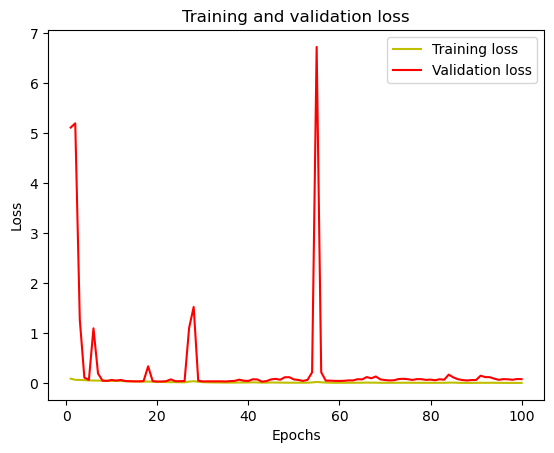

In [124]:
history = att_res_SegNet_history

#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Training Jaccard vs Validation Jaccard

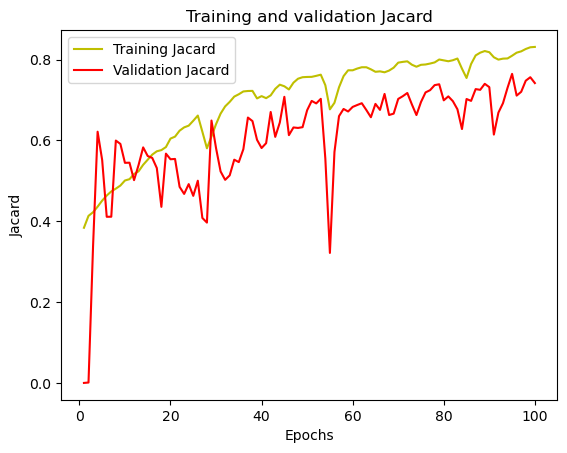

In [125]:
acc = history.history['jacard_coef']
#acc = history.history['accuracy']
val_acc = history.history['val_jacard_coef']
#val_acc = history.history['val_accuracy']

plt.plot(epochs, acc, 'y', label='Training Jacard')
plt.plot(epochs, val_acc, 'r', label='Validation Jacard')
plt.title('Training and validation Jacard')
plt.xlabel('Epochs')
plt.ylabel('Jacard')
plt.legend()
plt.show()

### Predictions

2023-05-30 12:29:46.593604: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100


1/1 [==============================] - 7s 7s/step


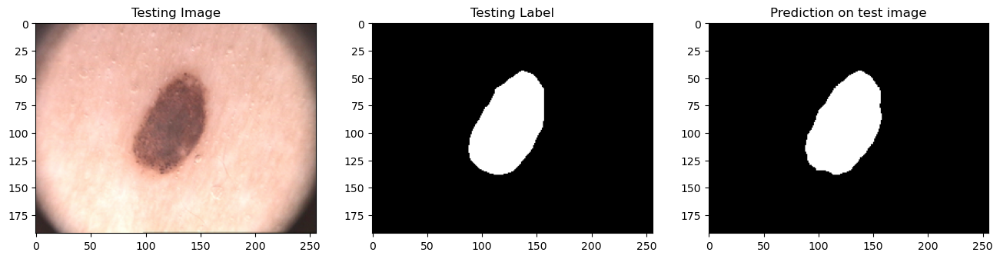

In [23]:
model = att_res_SegNet_model

import random
test_img_number = random.randint(0, x_test.shape[0]-1)
test_img = x_test[test_img_number]
ground_truth=y_test_exp[test_img_number]

test_img_input=np.expand_dims(test_img, 0)
prediction = (model.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img, cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], cmap='gray')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(prediction, cmap='gray')

plt.show()

### IoU for the above prediction

In [24]:
n_classes = 2
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(ground_truth[:,:,0], prediction)
print("IoU for the above prediction =", IOU_keras.result().numpy())

IoU for the above prediction = 0.9822862


### Mean IoU for all the images in the dataset

In [25]:
sum_iou=0
for test_img_number in range(X_train.shape[0]):
    test_img = X_train[test_img_number]
    ground_truth=Y_train_exp[test_img_number]

    test_img_input=np.expand_dims(test_img, 0)
    prediction = (model.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8)
    
    IOU_keras = MeanIoU(num_classes=n_classes)  
    IOU_keras.update_state(ground_truth[:,:,0], prediction)
    sum_iou+=IOU_keras.result().numpy()*100
    print("IoU for the current prediction =", IOU_keras.result().numpy())
print("Mean IoU: ",sum_iou/X_train.shape[0])

1/1 [==============================] - 0s 41ms/step
IoU for the current prediction = 0.9167559
1/1 [==============================] - 0s 36ms/step
IoU for the current prediction = 0.9004352
1/1 [==============================] - 0s 37ms/step
IoU for the current prediction = 0.8999659
1/1 [==============================] - 0s 37ms/step
IoU for the current prediction = 0.9132394
1/1 [==============================] - 0s 33ms/step
IoU for the current prediction = 0.7975774
1/1 [==============================] - 0s 43ms/step
IoU for the current prediction = 0.90615785
1/1 [==============================] - 0s 40ms/step
IoU for the current prediction = 0.9271004
1/1 [==============================] - 0s 33ms/step
IoU for the current prediction = 0.9648143
1/1 [==============================] - 0s 32ms/step
IoU for the current prediction = 0.9358571
1/1 [==============================] - 0s 39ms/step
IoU for the current prediction = 0.9383331
1/1 [==============================] - 0s 34ms/st

1/1 [==============================] - 0s 45ms/step
IoU for the current prediction = 0.76073134
1/1 [==============================] - 0s 42ms/step
IoU for the current prediction = 0.9603347
1/1 [==============================] - 0s 49ms/step
IoU for the current prediction = 0.88718957
1/1 [==============================] - 0s 35ms/step
IoU for the current prediction = 0.83938384
1/1 [==============================] - 0s 46ms/step
IoU for the current prediction = 0.9404904
1/1 [==============================] - 0s 40ms/step
IoU for the current prediction = 0.969701
1/1 [==============================] - 0s 40ms/step
IoU for the current prediction = 0.926887
1/1 [==============================] - 0s 38ms/step
IoU for the current prediction = 0.87971234
1/1 [==============================] - 0s 43ms/step
IoU for the current prediction = 0.605744
1/1 [==============================] - 0s 36ms/step
IoU for the current prediction = 0.70208234
1/1 [==============================] - 0s 43ms/s

### Guided filtering - Preprocessing test

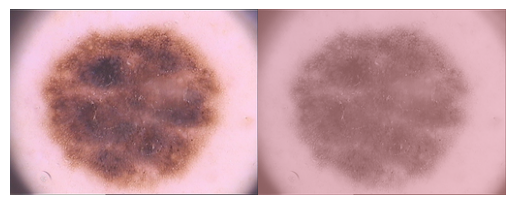

In [27]:
# img = test_img.copy()
# img_norm = np.float32(img) / 255.0
# radius = 100
# epsilon = 0.1
# guided_img = cv2.ximgproc.guidedFilter(img_norm, img_norm, radius, epsilon)
# guided_img = (guided_img * 255.0).astype(np.uint8)
# disp_img = np.hstack((img, guided_img))
# plt.imshow(disp_img)
# plt.axis('off');

1/1 [==============================] - 0s 36ms/step


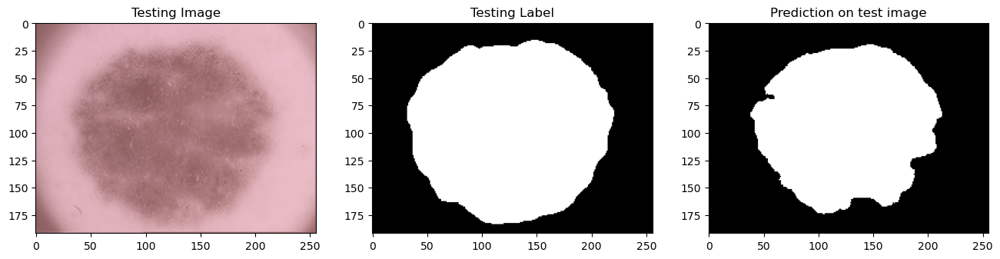

IoU for the above prediction = 0.8222706


In [29]:
# test_img_input=np.expand_dims(guided_img, 0)
# prediction = (model.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8)

# plt.figure(figsize=(16, 8))
# plt.subplot(231)
# plt.title('Testing Image')
# plt.imshow(guided_img, cmap='gray')
# plt.subplot(232)
# plt.title('Testing Label')
# plt.imshow(ground_truth[:,:,0], cmap='gray')
# plt.subplot(233)
# plt.title('Prediction on test image')
# plt.imshow(prediction, cmap='gray')

# plt.show()

# n_classes = 2
# IOU_keras = MeanIoU(num_classes=n_classes)  
# IOU_keras.update_state(ground_truth[:,:,0], prediction)
# print("IoU for the above prediction =", IOU_keras.result().numpy())

### Interpretability

In [129]:
def visualize_conv_layer(int_out, row_size, col_size):
   
  img_index=0

  print(np.shape(int_out))
  
  fig,ax=plt.subplots(row_size,col_size, figsize=(20, 5))
  for row in range(0,row_size):
    for col in range(0,col_size):
      ax[row][col].imshow(int_out[0, :, :, img_index], cmap='jet')
      ax[row][col].axis('off')
      img_index=img_index+1
        
print("Function to Visualize the Output has been Created")

Function to Visualize the Output has been Created


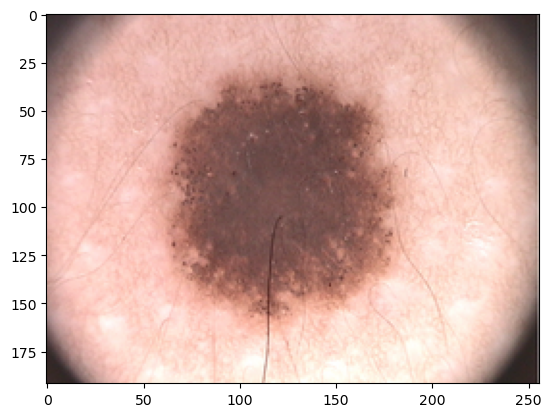

In [130]:
# selecting the image for interpretability
test_img_input = np.expand_dims(x_test[2], 0)
plt.imshow(x_test[2])

Attention block 1
1/1 [==============================] - 1s 659ms/step
(1, 12, 16, 512)


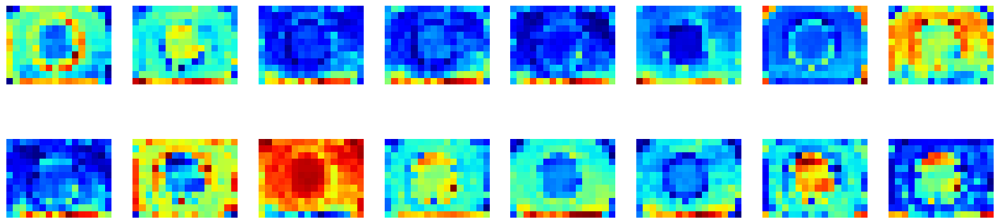

In [131]:
attention_blocks = [att_512_2, att_512_1, att_256, att_128, att_64]
print("Attention block 1")
in_to_intermediate = Model(inputs=model.inputs, outputs=attention_blocks[0])
int_out = in_to_intermediate.predict(test_img_input)
visualize_conv_layer(int_out,2,8)

Attention block 2
1/1 [==============================] - 1s 1s/step
(1, 24, 32, 512)


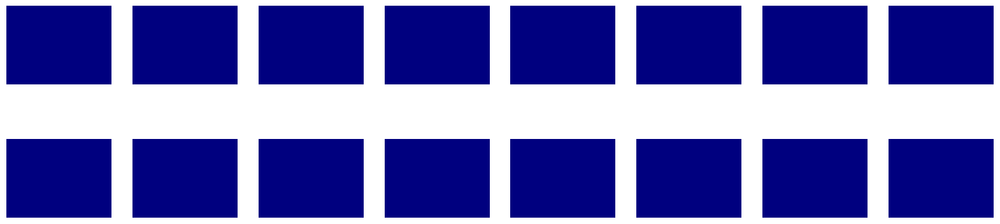

In [132]:
print("Attention block 2")
in_to_intermediate = Model(inputs=model.inputs, outputs=attention_blocks[1])
int_out = in_to_intermediate.predict(test_img_input)
visualize_conv_layer(int_out,2 ,8)

Attention block 3
1/1 [==============================] - 1s 1s/step
(1, 48, 64, 256)


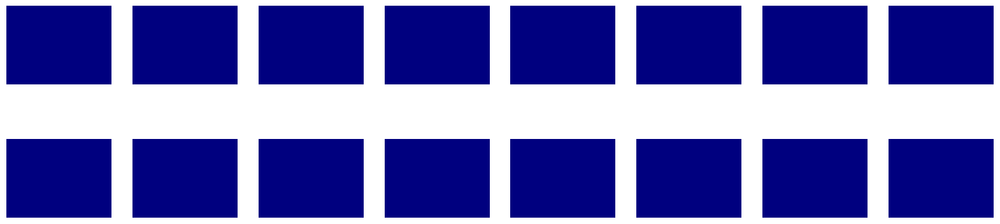

In [133]:
print("Attention block 3")
in_to_intermediate = Model(inputs=model.inputs, outputs=attention_blocks[2])
int_out = in_to_intermediate.predict(test_img_input)
visualize_conv_layer(int_out,2,8)

Attention block 4
1/1 [==============================] - 1s 1s/step
(1, 96, 128, 128)


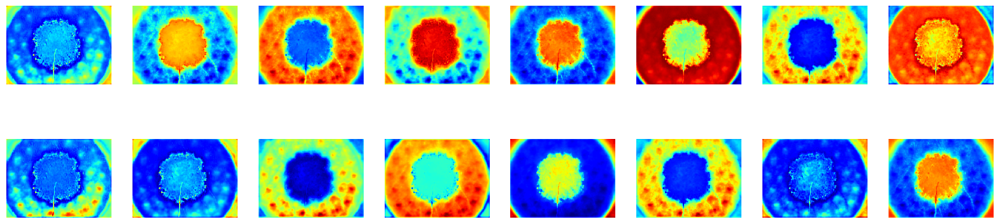

In [134]:
print("Attention block 4")
in_to_intermediate = Model(inputs=model.inputs, outputs=attention_blocks[3])
int_out = in_to_intermediate.predict(test_img_input)
visualize_conv_layer(int_out,2,8)

Attention block 5
1/1 [==============================] - 2s 2s/step
(1, 192, 256, 64)


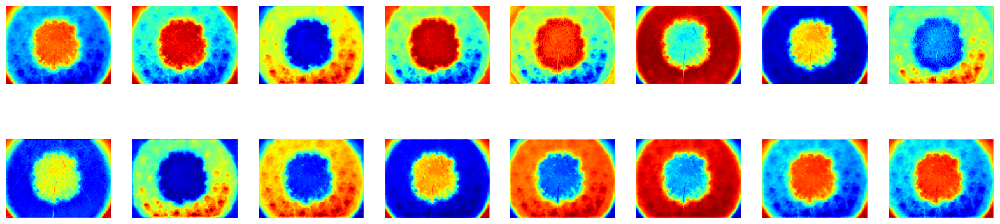

In [135]:
print("Attention block 5")
in_to_intermediate = Model(inputs=model.inputs, outputs=attention_blocks[4])
int_out = in_to_intermediate.predict(test_img_input)
visualize_conv_layer(int_out,2,8)

### Max Intensity Projection

In [136]:
def make_mips(image_path, output_dir):
    image = sitk.ReadImage(image_path)
    image_size = image.GetSize()

    basename = os.path.basename(image_path)
    if not os.path.isdir(output_dir):
        os.makedirs(output_dir)

    for dim in range(3):
        projection = sitk.MaximumProjection(image, dim)

        if image_size[dim] % 2:  # odd number
            voxel = [0, 0, 0]
            voxel[dim] = (image_size[dim] - 1) / 2
            origin = image.TransformIndexToPhysicalPoint(voxel)
        else:  # even
            voxel1 = np.array([0, 0, 0], int)
            voxel2 = np.array([0, 0, 0], int)
            voxel1[dim] = image_size[dim] / 2 - 1
            voxel2[dim] = image_size[dim] / 2
            point1 = np.array(image.TransformIndexToPhysicalPoint(voxel1.tolist()))
            point2 = np.array(image.TransformIndexToPhysicalPoint(voxel2.tolist()))
            origin = np.mean(np.vstack((point1, point2)), 0)
        projection.SetOrigin(origin)
        projection.SetDirection(image.GetDirection())
        proj_basename = basename.replace('.nii.gz', '_mip_{}.nii.gz'.format(dim))
        sitk.WriteImage(projection, os.path.join(output_dir, proj_basename))

In [137]:
attention_conv_blocks = [conv_64, conv_128, conv_256, conv_512_1, conv_512_2]
attention_deconv_blocks = [up_conv_512_2, up_conv_512_1, up_conv_256, up_conv_128, up_conv_64]

In [138]:
for i in range(5):
    in_to_intermediate = Model(inputs=att_res_SegNet_model.inputs, outputs=attention_conv_blocks[i])
    int_out = in_to_intermediate.predict(test_img_input)

    path_to_save = 'Feature_maps/attention_segnet/conv_'+str(i)+'.nii'

    converted_array = np.array(int_out[0], dtype=np.float32) # You need to replace normal array by yours
    affine = np.eye(4)
    nifti_file = nib.Nifti1Image(converted_array, affine)

    nib.save(nifti_file, path_to_save)

1/1 [==============================] - 0s 424ms/step


In [139]:
for i in range(5):
    image_path = 'Feature_maps/attention_segnet/conv_'+str(i)+'.nii'
    output_dir = 'Feature_maps/attention_segnet/mip/'
    make_mips(image_path, output_dir)

In [140]:
for i in range(5):
    out_np_path = 'Feature_maps/attention_segnet/mip/conv_'+str(i)+'.nii'
    out_img = nib.load(out_np_path)
    out_img = np.array(out_img.dataobj, dtype='int16')
    out_img = np.squeeze(out_img)
    cv2.imwrite('Feature_maps/attention_segnet/mip/conv_img_'+str(i)+'.png', out_img)

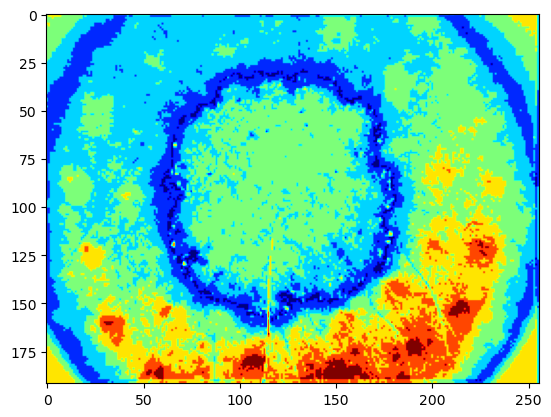

In [141]:
fname = 'Feature_maps/attention_segnet/mip/conv_img_0.png'
plt.imshow(Image.open(fname), cmap = 'jet');

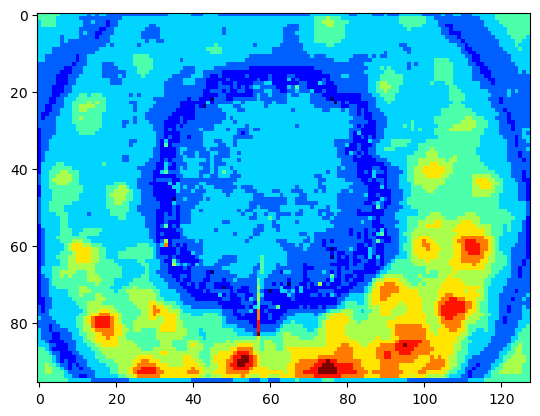

In [142]:
fname = 'Feature_maps/attention_segnet/mip/conv_img_1.png'
plt.imshow(Image.open(fname), cmap = 'jet');

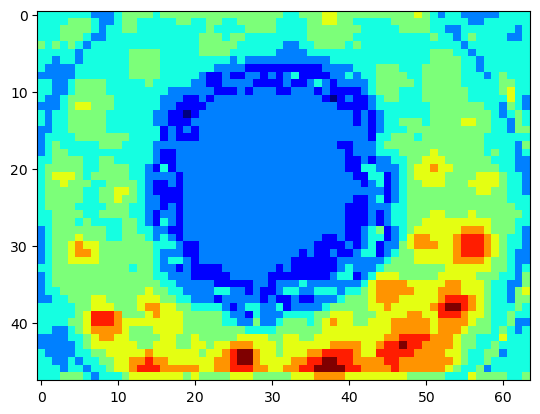

In [143]:
fname = 'Feature_maps/attention_segnet/mip/conv_img_2.png'
plt.imshow(Image.open(fname), cmap = 'jet');

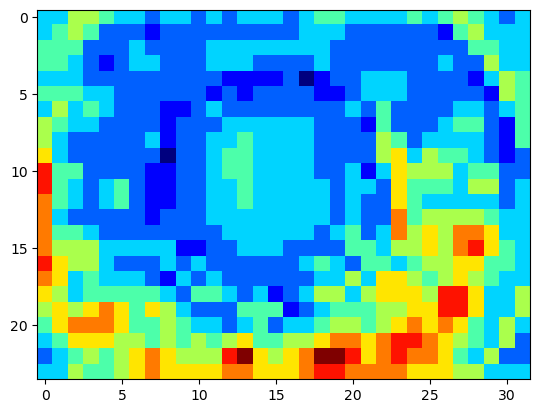

In [144]:
fname = 'Feature_maps/attention_segnet/mip/conv_img_3.png'
plt.imshow(Image.open(fname), cmap = 'jet');

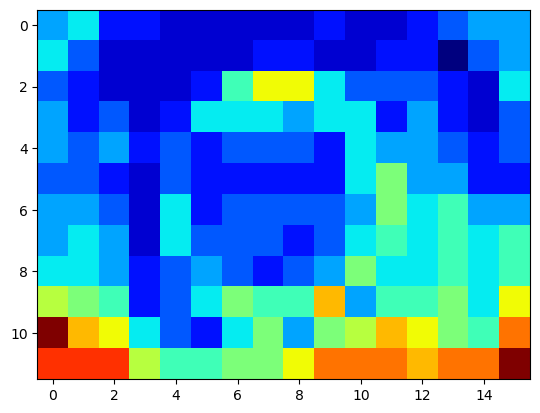

In [145]:
fname = 'Feature_maps/attention_segnet/mip/conv_img_4.png'
plt.imshow(Image.open(fname), cmap = 'jet');

### Feature maps of de-convolutional blocks

In [146]:
for i in range(5):
    in_to_intermediate = Model(inputs=att_res_SegNet_model.inputs, outputs=attention_deconv_blocks[i])
    int_out = in_to_intermediate.predict(test_img_input)

    path_to_save = 'Feature_maps/attention_segnet/deconv_'+str(i)+'.nii'

    converted_array = np.array(int_out[0], dtype=np.float32) # You need to replace normal array by yours
    affine = np.eye(4)
    nifti_file = nib.Nifti1Image(converted_array, affine)

    nib.save(nifti_file, path_to_save)

1/1 [==============================] - 2s 2s/step


In [147]:
for i in range(5):
    image_path = 'Feature_maps/attention_segnet/deconv_'+str(i)+'.nii'
    output_dir = 'Feature_maps/attention_segnet/mip/'
    make_mips(image_path, output_dir)

In [148]:
for i in range(5):
    out_np_path = 'Feature_maps/attention_segnet/mip/deconv_'+str(i)+'.nii'
    out_img = nib.load(out_np_path)
    out_img = np.array(out_img.dataobj, dtype='int16')
    out_img = np.squeeze(out_img)
    cv2.imwrite('Feature_maps/attention_segnet/mip/de_img_'+str(i)+'.png', out_img)

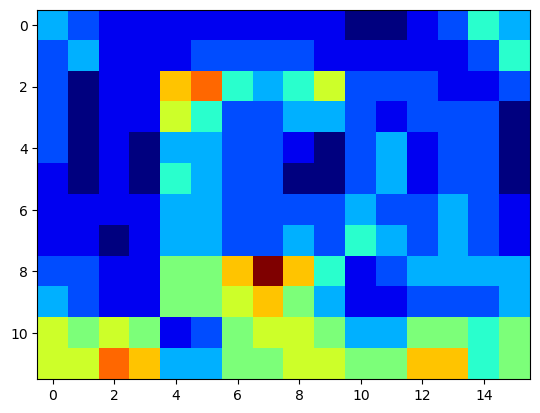

In [149]:
fname = 'Feature_maps/attention_segnet/mip/de_img_0.png'
plt.imshow(Image.open(fname), cmap = 'jet');

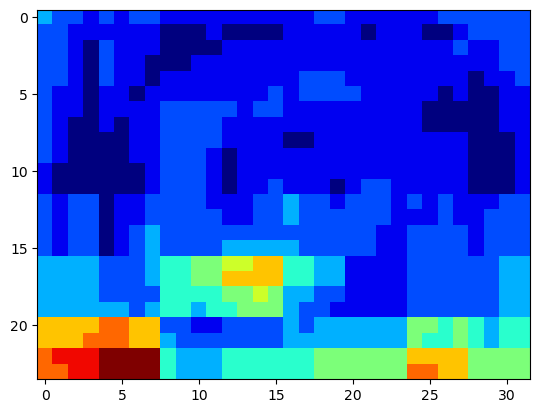

In [150]:
fname = 'Feature_maps/attention_segnet/mip/de_img_1.png'
plt.imshow(Image.open(fname), cmap = 'jet');

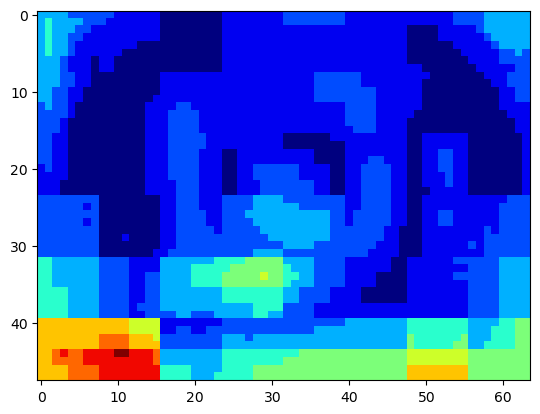

In [151]:
fname = 'Feature_maps/attention_segnet/mip/de_img_2.png'
plt.imshow(Image.open(fname), cmap = 'jet');

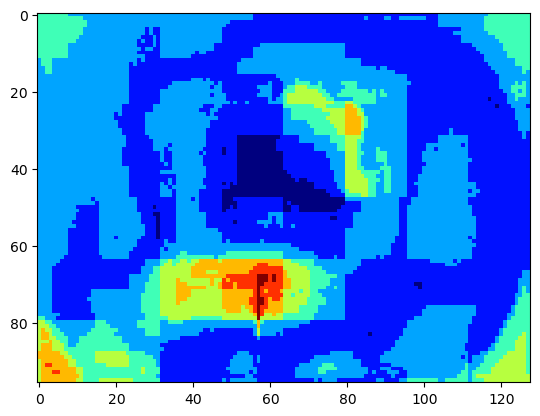

In [152]:
fname = 'Feature_maps/attention_segnet/mip/de_img_3.png'
plt.imshow(Image.open(fname), cmap = 'jet');

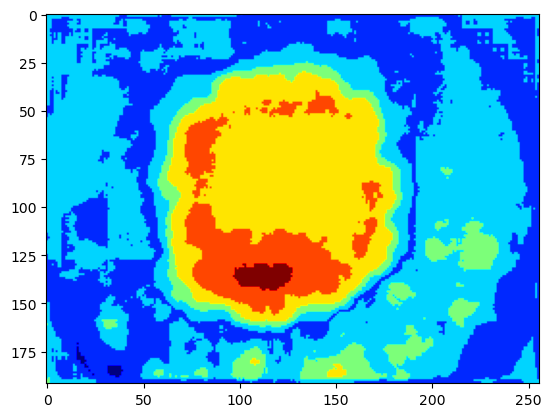

In [153]:
fname = 'Feature_maps/attention_segnet/mip/de_img_4.png'
plt.imshow(Image.open(fname), cmap = 'jet');

# Segmentation comparison panel

In [39]:
'''
1. Select a representational image
2. Get the prediction from all the models
3. Get the corresponding IoU values from each of the models
4. Plot them side by side along with the ground truth
'''
# Getting the test image
'''
Run the prediction of all the images of the dataset and make 4 lists with iou values. Find the image
with maximum difference 
'''


def enhance_model(img, model):
    sub = (model.predict(img.reshape(1,192,256,3))).flatten()

    for i in range(len(sub)):
        if sub[i] > 0.5:
            sub[i] = 1
        else:
            sub[i] = 0
    return sub

simple_lis, combined_lis, ressegnet_lis, att_res_segnet_lis = [], [], [], []

for test_img_number in range(X_train.shape[0]):
    test_img = X_train[test_img_number]
    ground_truth=Y_train[test_img_number]

    # Simple segnet
    prediction = enhance_model(test_img, simple_segnet).reshape(192,256)
    IOU_keras = MeanIoU(num_classes=n_classes)  
    IOU_keras.update_state(ground_truth, prediction)
    simple_lis.append(IOU_keras.result().numpy()*100)
    
    # Combined segnet
    prediction = enhance_model(test_img, combined_segnet).reshape(192,256)
    IOU_keras = MeanIoU(num_classes=n_classes)  
    IOU_keras.update_state(ground_truth, prediction)
    combined_lis.append(IOU_keras.result().numpy()*100)
    
    # residual segnet
    ground_truth=Y_train_exp[test_img_number]
    test_img_input=np.expand_dims(test_img, 0)
    prediction = (ressegnet_model.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8)
    IOU_keras = MeanIoU(num_classes=n_classes) 
    IOU_keras.update_state(ground_truth[:,:,0], prediction)
    ressegnet_lis.append(IOU_keras.result().numpy()*100)
    
    # attention segnet
    prediction = (att_res_SegNet_model.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8)
    IOU_keras = MeanIoU(num_classes=n_classes)  
    IOU_keras.update_state(ground_truth[:,:,0], prediction)
    att_res_segnet_lis.append(IOU_keras.result().numpy()*100)

1/1 [==============================] - 0s 68ms/step


1/1 [==============================] - 0s 84ms/step


1/1 [==============================] - 0s 56ms/step


In [40]:
# Combining 4 lists into one list
comb_lis = list(zip(simple_lis, combined_lis, ressegnet_lis, att_res_segnet_lis))
# Creating variance calculation function
def variance(tup):
    a,b,c,d = tup
    mean = (a + b + c + d) / 4
    variance = ((a - mean) ** 2 + (b - mean) ** 2 + (c - mean) ** 2 + (d - mean) ** 2) / 4
    return variance
# Constructing the variance numpy array
var_lis = []
for i in comb_lis:
    var_lis.append(variance(i))
var_np = np.array(var_lis)

In [41]:
# Get the indices of the top 5 maximum values
top5_indices = np.argsort(var_np)[-5:]

# Get the top 5 maximum values
top5_values = var_np[top5_indices]

print("Indices of top 5 maximum values:", top5_indices)
print("Top 5 maximum values:", top5_values)

# printing corresponding iou values 
for i in top5_indices:
    print(comb_lis[i])

Indices of top 5 maximum values: [186 105 179 112  92]
Top 5 maximum values: [209.33534059 213.76574443 252.38191503 329.40489607 429.91983817]
(84.57940816879272, 91.71454906463623, 56.85235261917114, 92.27491617202759)
(94.88280415534973, 62.28147745132446, 97.04944491386414, 96.0680365562439)
(55.8266818523407, 55.7604193687439, 87.15134859085083, 87.97123432159424)
(81.88434839248657, 34.511905908584595, 73.78398776054382, 70.08663415908813)
(95.13334035873413, 96.81583046913147, 88.39965462684631, 46.120816469192505)


In [42]:
# Constructing the panel
def visual_panels(iou_tup, ind):
    
    fig,ax=plt.subplots(1, 5, figsize=(10, 5), squeeze=False)
    test_img = x_train_full[ind]
    test_img_input = np.expand_dims(test_img, 0)
    ax[0][0].set_title("Ground Truth")
    ax[0][0].imshow(y_train_full[ind], cmap='gray')
    ax[0][0].set_xlabel("IOU")
    ax[0][0].set_xticks([])
    ax[0][0].set_yticks([])

    ax[0][1].set_title("Simple Segnet")
    ax[0][1].imshow(enhance_model(test_img, simple_segnet).reshape(192,256), cmap='gray')
    ax[0][1].set_xlabel("{:.2f}".format((simple_lis[ind])))
    ax[0][1].set_xticks([])
    ax[0][1].set_yticks([])
    
    ax[0][2].set_title("Combined Segnet")
    ax[0][2].imshow(enhance_model(test_img, combined_segnet).reshape(192,256), cmap='gray')
    ax[0][2].set_xlabel("{:.2f}".format((combined_lis[ind])))
    ax[0][2].set_xticks([])
    ax[0][2].set_yticks([])
    
    ax[0][3].set_title("Residual Segnet")
    ax[0][3].imshow((ressegnet_model.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8), cmap='gray')
    ax[0][3].set_xlabel("{:.2f}".format((ressegnet_lis[ind])))
    ax[0][3].set_xticks([])
    ax[0][3].set_yticks([])
    
    ax[0][4].set_title("Attention Segnet")
    ax[0][4].imshow((att_res_SegNet_model.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8), cmap='gray')
    ax[0][4].set_xlabel("{:.2f}".format((att_res_segnet_lis[ind])))
    ax[0][4].set_xticks([])
    ax[0][4].set_yticks([])


1/1 [==============================] - 0s 90ms/step


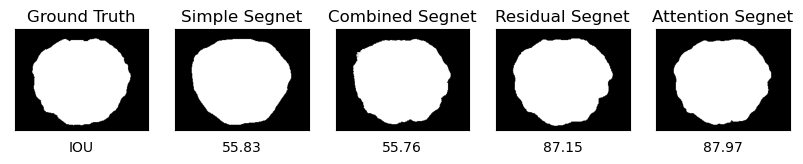

In [43]:
visual_panels(comb_lis[2], top5_indices[2])

1/1 [==============================] - 0s 79ms/step


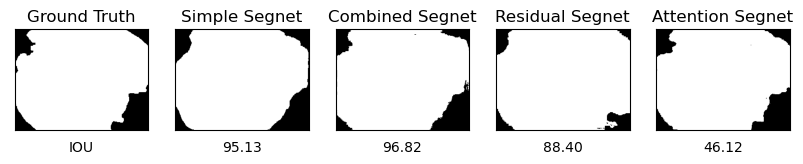

In [44]:
visual_panels(comb_lis[4], top5_indices[4])

1/1 [==============================] - 0s 102ms/step


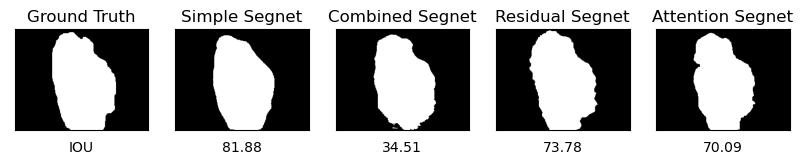

In [45]:
visual_panels(comb_lis[3], top5_indices[3])

In [46]:
# Middle 5 values 
sorted_indices = np.argsort(var_np)
mid_ind = len(var_lis)//2
mid_indices = sorted_indices[mid_ind-2:mid_ind+3]
print(mid_indices)

[127  60 161 147 177]


1/1 [==============================] - 0s 52ms/step


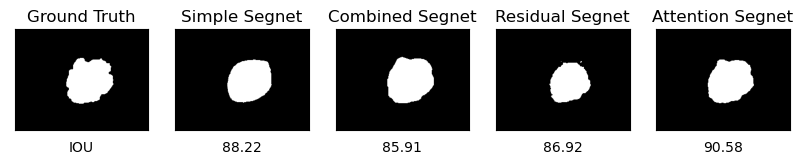

In [47]:
visual_panels(comb_lis[mid_indices[0]], mid_indices[0])

1/1 [==============================] - 0s 38ms/step


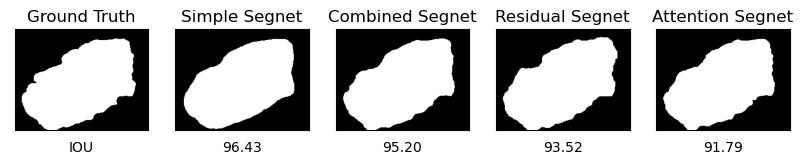

In [48]:
visual_panels(comb_lis[mid_indices[1]], mid_indices[1])

1/1 [==============================] - 0s 91ms/step


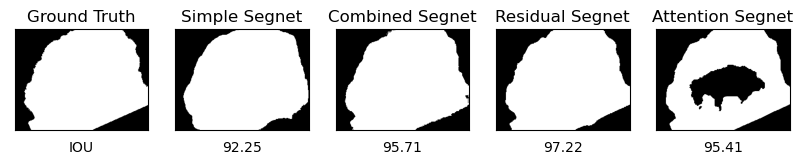

In [49]:
visual_panels(comb_lis[mid_indices[2]], mid_indices[2])

1/1 [==============================] - 0s 85ms/step


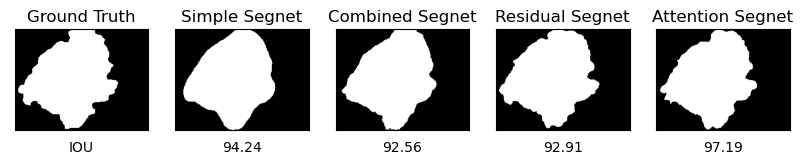

In [50]:
visual_panels(comb_lis[mid_indices[3]], mid_indices[3])

1/1 [==============================] - 0s 110ms/step


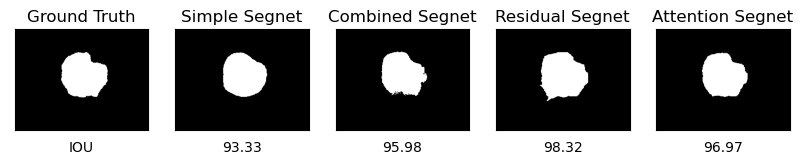

In [51]:
visual_panels(comb_lis[mid_indices[4]], mid_indices[4])

In [52]:
# Top 5 IoU variances
top_5indices = sorted_indices[:5]
top_5indices

array([ 56,  11, 164,  88,  85])

1/1 [==============================] - 0s 73ms/step


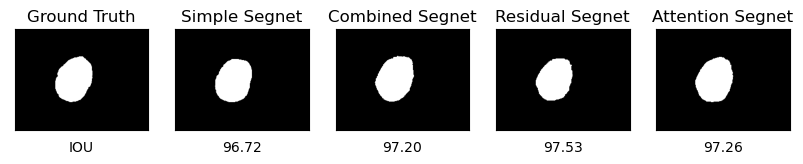

In [53]:
visual_panels(comb_lis[top_5indices[0]], top_5indices[0])

1/1 [==============================] - 0s 54ms/step


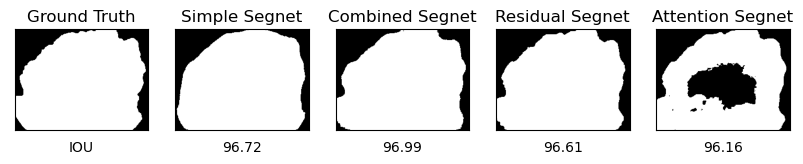

In [54]:
visual_panels(comb_lis[top_5indices[1]], top_5indices[1])

1/1 [==============================] - 0s 88ms/step


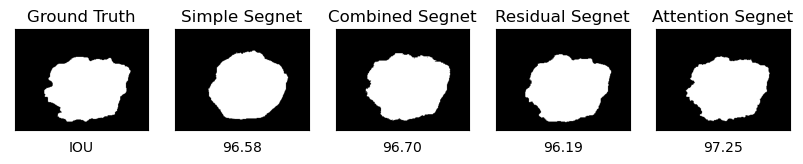

In [55]:
visual_panels(comb_lis[top_5indices[2]], top_5indices[2])

1/1 [==============================] - 0s 48ms/step


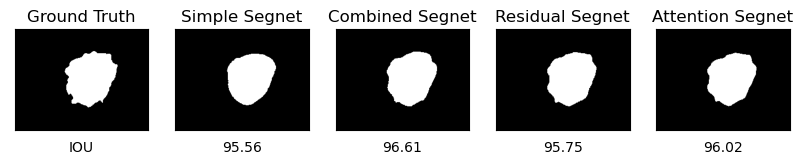

In [56]:
visual_panels(comb_lis[top_5indices[3]], top_5indices[3])

1/1 [==============================] - 0s 52ms/step


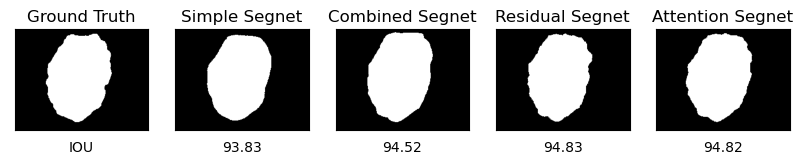

In [57]:
visual_panels(comb_lis[top_5indices[4]], top_5indices[4])

In [58]:
# case where simple < combined < residual < attention
proper_lis = []
for i in comb_lis:
    a,b,c,d = i
    if a<b and b<c and c<d:
        proper_lis.append(comb_lis.index(i))
print("Original combined list: ", len(comb_lis))
print("Proper list: ", len(proper_lis))

Original combined list:  200
Proper list:  25


# Final deconvolutional block output panel

In [174]:
def final_layer_interpretability(model_name, test_img_input, model, deconv_lis):

    in_to_intermediate = Model(inputs=model.inputs, outputs=deconv_lis[4])
    int_out = in_to_intermediate.predict(test_img_input)
    path_to_save = 'Feature_maps/Final_layers/'+model_name+'.nii'
    converted_array = np.array(int_out[0], dtype=np.float32) # You need to replace normal array by yours
    affine = np.eye(4)
    nifti_file = nib.Nifti1Image(converted_array, affine)
    nib.save(nifti_file, path_to_save)

    
    image_path = 'Feature_maps/Final_layers/'+model_name+'.nii'
    output_dir = 'Feature_maps/Final_layers/'
    make_mips(image_path, output_dir)


    out_np_path = 'Feature_maps/Final_layers/'+model_name+'.nii'
    out_img = nib.load(out_np_path)
    out_img = np.array(out_img.dataobj, dtype='int16')
    out_img = np.squeeze(out_img)
    cv2.imwrite('Feature_maps/Final_layers/'+model_name+'.png', out_img)

In [175]:
def final_interpretability(ind):
    test_img_input = np.expand_dims(x_train_full[ind], 0)
#     plt.imshow(x_train_full[6])

    final_layer_interpretability("simple", test_img_input, simple_segnet, simple_deconv_blocks)
    final_layer_interpretability("combined", test_img_input, combined_segnet, combined_deconv_blocks)
    final_layer_interpretability("ressegnet", test_img_input, ressegnet_model, ressegnet_de_conv_blocks)
    final_layer_interpretability("attention", test_img_input, att_res_SegNet_model, attention_deconv_blocks)
    
    fig,ax=plt.subplots(1, 5, figsize=(10, 5), squeeze=False)
    ax[0][0].set_title("Ground Truth")
    ax[0][0].imshow(y_train_full[ind], cmap='gray')
    ax[0][0].axis('off')

    ax[0][1].set_title("Simple Segnet")
    ax[0][1].imshow(Image.open('Feature_maps/Final_layers/simple.png'), cmap = 'gray')
    ax[0][1].axis('off')

    ax[0][2].set_title("Combined Segnet")
    ax[0][2].imshow(Image.open('Feature_maps/Final_layers/combined.png'), cmap = 'gray')
    ax[0][2].axis('off')

    ax[0][3].set_title("Residual Segnet")
    ax[0][3].imshow(Image.open('Feature_maps/Final_layers/ressegnet.png'), cmap = 'gray')
    ax[0][3].axis('off')

    ax[0][4].set_title("Attention Segnet")
    ax[0][4].imshow(Image.open('Feature_maps/Final_layers/attention.png'), cmap = 'gray')
    ax[0][4].axis('off');

1/1 [==============================] - 2s 2s/step


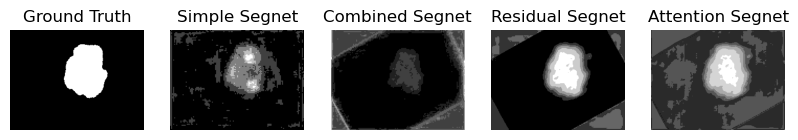

In [176]:
final_interpretability(mid_indices[0])

1/1 [==============================] - 2s 2s/step


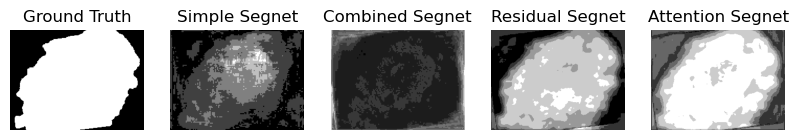

In [177]:
final_interpretability(mid_indices[2])

1/1 [==============================] - 2s 2s/step


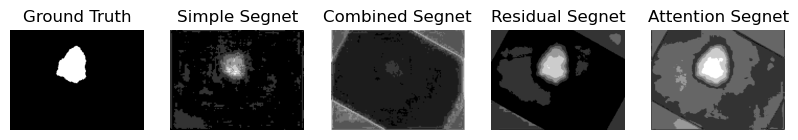

In [178]:
final_interpretability(mid_indices[4])

1/1 [==============================] - 2s 2s/step


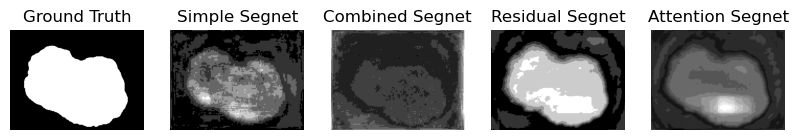

In [179]:
final_interpretability(top_5indices[0])

1/1 [==============================] - 2s 2s/step


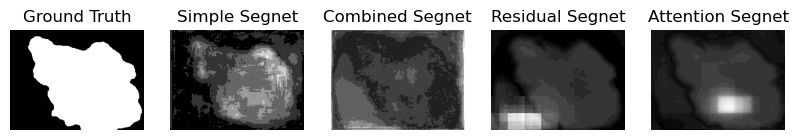

In [180]:
final_interpretability(top_5indices[3])

1/1 [==============================] - 1s 1s/step


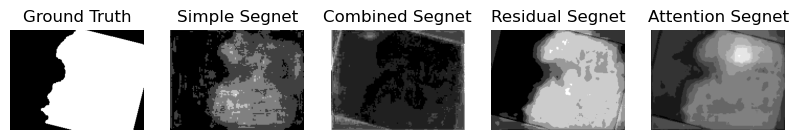

In [181]:
final_interpretability(top_5indices[4])

## Proper examples

1/1 [==============================] - 0s 92ms/step


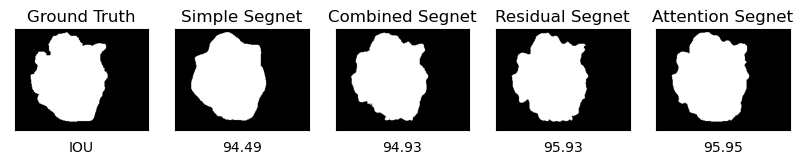

In [182]:
ran_ind = proper_lis[random.randint(0,len(proper_lis))]
visual_panels(comb_lis[ran_ind], ran_ind)

1/1 [==============================] - 2s 2s/step


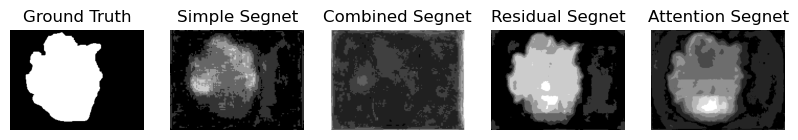

In [183]:
final_interpretability(ran_ind)

# Confusion matrix

### 1. Single example

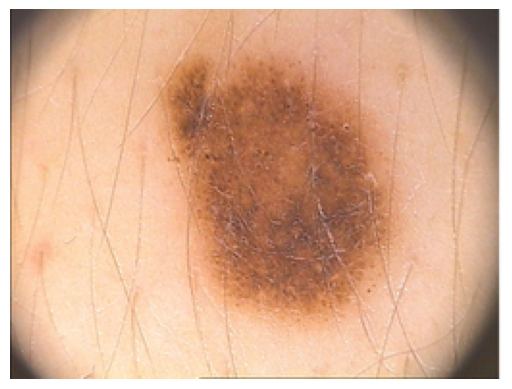

In [59]:
conf_img = X_train[20]
conf_img_exp = np.expand_dims(X_train[20], 0)
plt.imshow(X_train[20])
plt.axis('off');

In [60]:
simple_pred = enhance_model(conf_img, simple_segnet).reshape(192,256)
combined_pred = enhance_model(conf_img, combined_segnet).reshape(192,256)
residual_pred = (ressegnet_model.predict(conf_img_exp)[0,:,:,0] > 0.5).astype(np.uint8)
attention_pred = (att_res_SegNet_model.predict(conf_img_exp)[0,:,:,0] > 0.5).astype(np.uint8)

1/1 [==============================] - 0s 68ms/step


#### Simple segnet

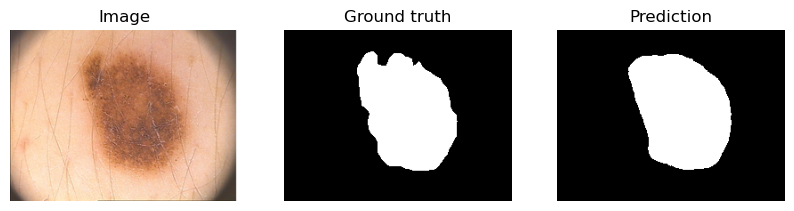

In [61]:
fig, ax = plt.subplots(1,3,figsize=(10, 5),squeeze=False)
ax[0][0].imshow(X_train[20])
ax[0][0].set_title("Image")
ax[0][0].axis('off')
ax[0][1].imshow(Y_train[20], cmap='gray')
ax[0][1].set_title("Ground truth")
ax[0][1].axis('off')
ax[0][2].imshow(simple_pred, cmap='gray')
ax[0][2].set_title("Prediction")
ax[0][2].axis('off');

In [62]:
from sklearn.metrics import confusion_matrix
flat_truth = Y_train_exp[20].flatten()
flat_preds = simple_pred.flatten()
cm = confusion_matrix(flat_truth, flat_preds, labels=list(range(2)))

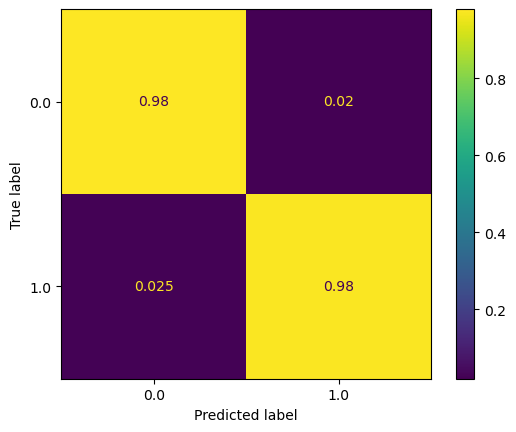

In [63]:
from sklearn.metrics import ConfusionMatrixDisplay,f1_score

ConfusionMatrixDisplay.from_predictions(flat_truth, flat_preds, normalize='true')

### Calculating the TPR and FPR

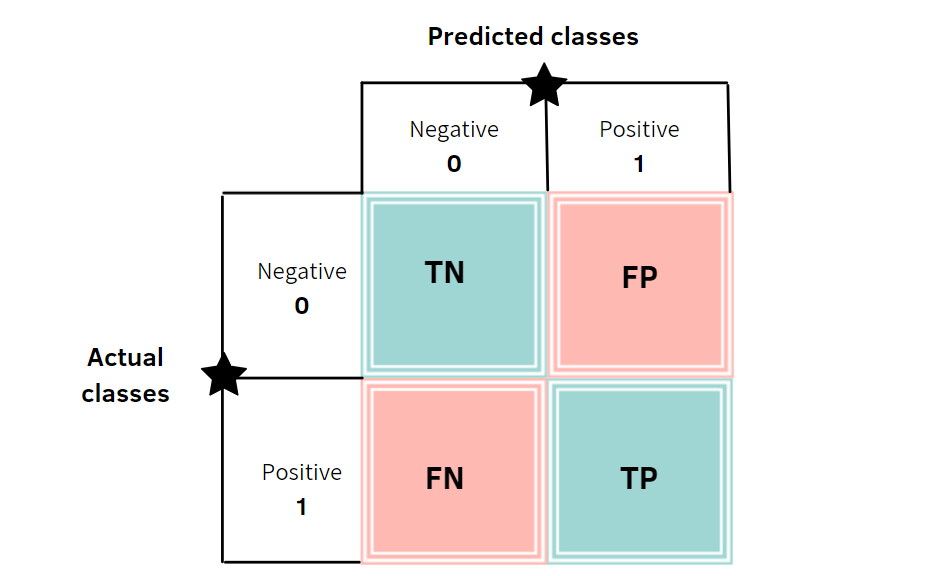

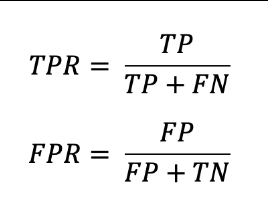

In [64]:
# Calculating the True Positive Rate, False Positive Rate
def tpr_fpr_tnr_fnr(cm):
    tn = cm[0][0]
    fp = cm[0][1]
    fn = cm[1][0]
    tp = cm[1][1]
    tpr = tp/(tp+fn)
    fpr = fp/(fp+tn)
    tnr, fnr = 1-tpr, 1-fpr
    return tpr, fpr, tnr, fnr

In [65]:
tpr, fpr, tnr, fnr = tpr_fpr_tnr_fnr(cm)
print("True Positive Rate(TPR): ",tpr)
print("False Positive Rate(FPR): ",fpr)
print("True Negative Rate(TNR): ", tnr)
print("False Negative Rate(FNR): ", fnr)

True Positive Rate(TPR):  0.97521343982374
False Positive Rate(FPR):  0.020256671632818423
True Negative Rate(TNR):  0.02478656017626002
False Negative Rate(FNR):  0.9797433283671816


In [66]:
print("F1 score of the prediction: ",f1_score(flat_truth, flat_preds, average='macro'))

F1 score of the prediction:  0.9696862224413219


#### Combined segnet

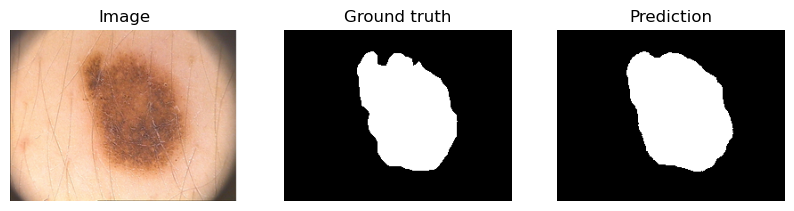

In [67]:
fig, ax = plt.subplots(1,3,figsize=(10, 5),squeeze=False)
ax[0][0].imshow(X_train[20])
ax[0][0].set_title("Image")
ax[0][0].axis('off')
ax[0][1].imshow(Y_train[20], cmap='gray')
ax[0][1].set_title("Ground truth")
ax[0][1].axis('off')
ax[0][2].imshow(combined_pred, cmap='gray')
ax[0][2].set_title("Prediction")
ax[0][2].axis('off');

In [68]:
from sklearn.metrics import confusion_matrix
flat_truth = Y_train_exp[20].flatten()
flat_preds = combined_pred.flatten()
cm = confusion_matrix(flat_truth, flat_preds, labels=list(range(2)))

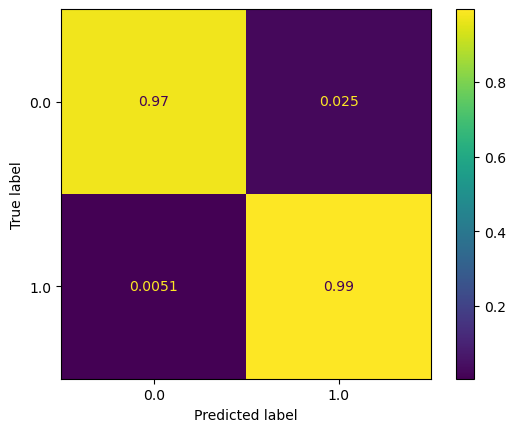

In [69]:
from sklearn.metrics import ConfusionMatrixDisplay,f1_score

ConfusionMatrixDisplay.from_predictions(flat_truth, flat_preds, normalize='true')

In [70]:
# Calculating the True Positive Rate, False Positive Rate
def tpr_fpr_tnr_fnr(cm):
    tn = cm[0][0]
    fp = cm[0][1]
    fn = cm[1][0]
    tp = cm[1][1]
    tpr = tp/(tp+fn)
    fpr = fp/(fp+tn)
    tnr, fnr = 1-tpr, 1-fpr
    return tpr, fpr, tnr, fnr

In [71]:
tpr, fpr, tnr, fnr = tpr_fpr_tnr_fnr(cm)
print("True Positive Rate(TPR): ",tpr)
print("False Positive Rate(FPR): ",fpr)
print("True Negative Rate(TNR): ", tnr)
print("False Negative Rate(FNR): ", fnr)

True Positive Rate(TPR):  0.9948590838152942
False Positive Rate(FPR):  0.025301236310410622
True Negative Rate(TNR):  0.005140916184705802
False Negative Rate(FNR):  0.9746987636895894


In [72]:
print("F1 score of the prediction: ",f1_score(flat_truth, flat_preds, average='macro'))

F1 score of the prediction:  0.9706709971989196


#### Residual segnet

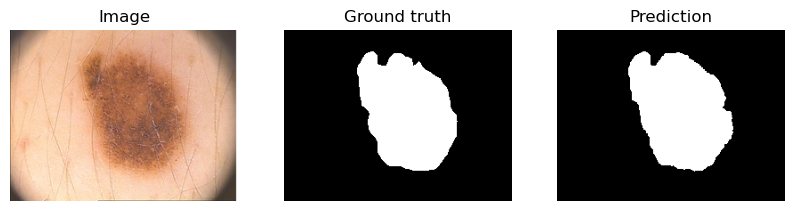

In [73]:
fig, ax = plt.subplots(1,3,figsize=(10, 5),squeeze=False)
ax[0][0].imshow(X_train[20])
ax[0][0].set_title("Image")
ax[0][0].axis('off')
ax[0][1].imshow(Y_train[20], cmap='gray')
ax[0][1].set_title("Ground truth")
ax[0][1].axis('off')
ax[0][2].imshow(residual_pred, cmap='gray')
ax[0][2].set_title("Prediction")
ax[0][2].axis('off');

In [74]:
from sklearn.metrics import confusion_matrix
flat_truth = Y_train_exp[20].flatten()
flat_preds = residual_pred.flatten()
cm = confusion_matrix(flat_truth, flat_preds, labels=list(range(2)))

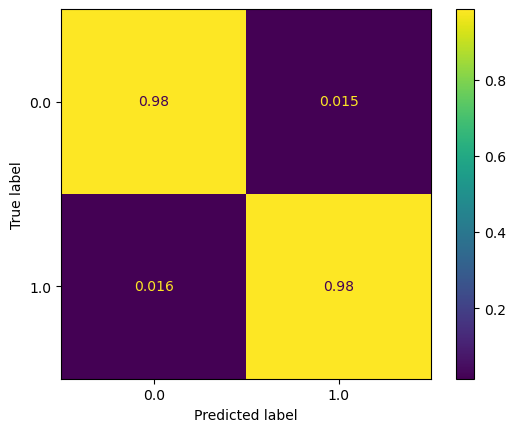

In [75]:
from sklearn.metrics import ConfusionMatrixDisplay,f1_score

ConfusionMatrixDisplay.from_predictions(flat_truth, flat_preds, normalize='true')

In [76]:
# Calculating the True Positive Rate, False Positive Rate
def tpr_fpr_tnr_fnr(cm):
    tn = cm[0][0]
    fp = cm[0][1]
    fn = cm[1][0]
    tp = cm[1][1]
    tpr = tp/(tp+fn)
    fpr = fp/(fp+tn)
    tnr, fnr = 1-tpr, 1-fpr
    return tpr, fpr, tnr, fnr

In [77]:
tpr, fpr, tnr, fnr = tpr_fpr_tnr_fnr(cm)
print("True Positive Rate(TPR): ",tpr)
print("False Positive Rate(FPR): ",fpr)
print("True Negative Rate(TNR): ", tnr)
print("False Negative Rate(FNR): ", fnr)

True Positive Rate(TPR):  0.9838428348480676
False Positive Rate(FPR):  0.015264382236859301
True Negative Rate(TNR):  0.01615716515193244
False Negative Rate(FNR):  0.9847356177631407


In [78]:
print("F1 score of the prediction: ",f1_score(flat_truth, flat_preds, average='macro'))

F1 score of the prediction:  0.977885481767205


#### Attention segnet

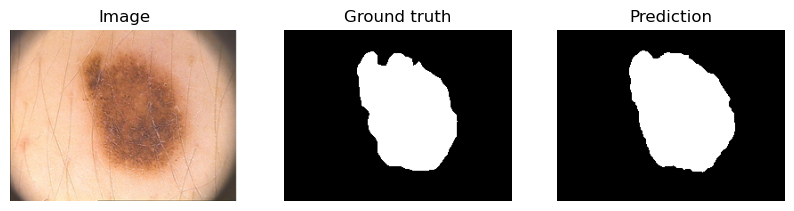

In [79]:
fig, ax = plt.subplots(1,3,figsize=(10, 5),squeeze=False)
ax[0][0].imshow(X_train[20])
ax[0][0].set_title("Image")
ax[0][0].axis('off')
ax[0][1].imshow(Y_train[20], cmap='gray')
ax[0][1].set_title("Ground truth")
ax[0][1].axis('off')
ax[0][2].imshow(attention_pred, cmap='gray')
ax[0][2].set_title("Prediction")
ax[0][2].axis('off');

In [80]:
from sklearn.metrics import confusion_matrix
flat_truth = Y_train_exp[20].flatten()
flat_preds = residual_pred.flatten()
cm = confusion_matrix(flat_truth, flat_preds, labels=list(range(2)))

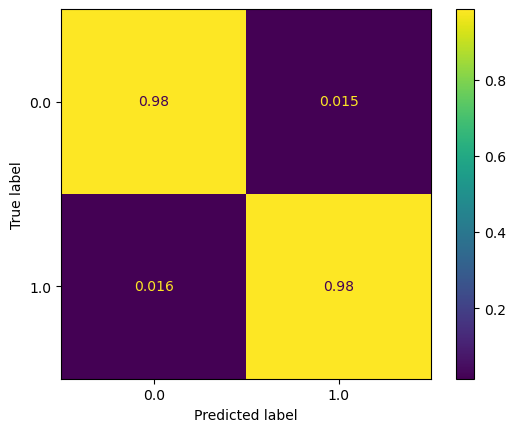

In [81]:
from sklearn.metrics import ConfusionMatrixDisplay,f1_score

ConfusionMatrixDisplay.from_predictions(flat_truth, flat_preds, normalize='true')

In [82]:
# Calculating the True Positive Rate, False Positive Rate
def tpr_fpr_tnr_fnr(cm):
    tn = cm[0][0]
    fp = cm[0][1]
    fn = cm[1][0]
    tp = cm[1][1]
    tpr = tp/(tp+fn)
    fpr = fp/(fp+tn)
    tnr, fnr = 1-tpr, 1-fpr
    return tpr, fpr, tnr, fnr

In [83]:
tpr, fpr, tnr, fnr = tpr_fpr_tnr_fnr(cm)
print("True Positive Rate(TPR): ",tpr)
print("False Positive Rate(FPR): ",fpr)
print("True Negative Rate(TNR): ", tnr)
print("False Negative Rate(FNR): ", fnr)

True Positive Rate(TPR):  0.9838428348480676
False Positive Rate(FPR):  0.015264382236859301
True Negative Rate(TNR):  0.01615716515193244
False Negative Rate(FNR):  0.9847356177631407


In [84]:
print("F1 score of the prediction: ",f1_score(flat_truth, flat_preds, average='macro'))

F1 score of the prediction:  0.977885481767205


## For all images

In [85]:
simple_pred_arr = []
combined_pred_arr = []
residual_pred_arr = []
attention_pred_arr = []
for i in X_train:
    simple_pred_arr.append(enhance_model(i, simple_segnet).reshape(192,256))
    combined_pred_arr.append(enhance_model(i, combined_segnet).reshape(192,256))
    residual_pred_arr.append((ressegnet_model.predict(np.expand_dims(i, 0))[0,:,:,0] > 0.5).astype(np.uint8))
    attention_pred_arr.append((att_res_SegNet_model.predict(np.expand_dims(i, 0))[0,:,:,0] > 0.5).astype(np.uint8))

1/1 [==============================] - 0s 71ms/step


1/1 [==============================] - 0s 73ms/step


1/1 [==============================] - 0s 66ms/step


1/1 [==============================] - 0s 59ms/step


In [86]:
flat_truth_arr = Y_train_exp.flatten()

#### Simple segnet

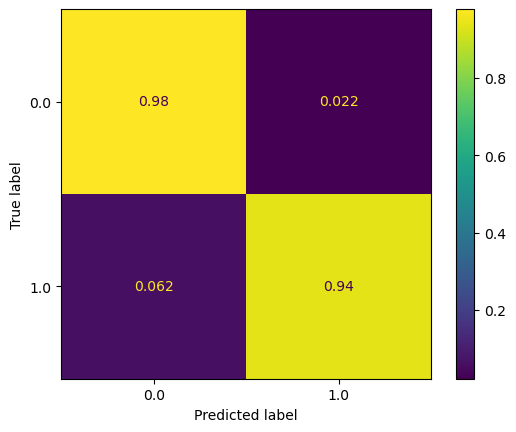

In [87]:
flat_preds_arr = np.array(simple_pred_arr).flatten()
cm = confusion_matrix(flat_truth_arr, flat_preds_arr, labels=list(range(2)))
ConfusionMatrixDisplay.from_predictions(flat_truth_arr, flat_preds_arr, normalize='true')

In [88]:
# Calculating the True Positive Rate, False Positive Rate
def tpr_fpr_tnr_fnr(cm):
    tn = cm[0][0]
    fp = cm[0][1]
    fn = cm[1][0]
    tp = cm[1][1]
    tpr = tp/(tp+fn)
    fpr = fp/(fp+tn)
    tnr, fnr = 1-tpr, 1-fpr
    return tpr, fpr, tnr, fnr

In [89]:
tpr, fpr, tnr, fnr = tpr_fpr_tnr_fnr(cm)
print("True Positive Rate(TPR): ",tpr)
print("False Positive Rate(FPR): ",fpr)
print("True Negative Rate(TNR): ", tnr)
print("False Negative Rate(FNR): ", fnr)

True Positive Rate(TPR):  0.9375749108005849
False Positive Rate(FPR):  0.022098002881819276
True Negative Rate(TNR):  0.06242508919941514
False Negative Rate(FNR):  0.9779019971181807


In [90]:
print("F1 score of the predictions: ",f1_score(flat_truth_arr, flat_preds_arr, average='macro'))

F1 score of the predictions:  0.9596675642906758


#### Combined segnet

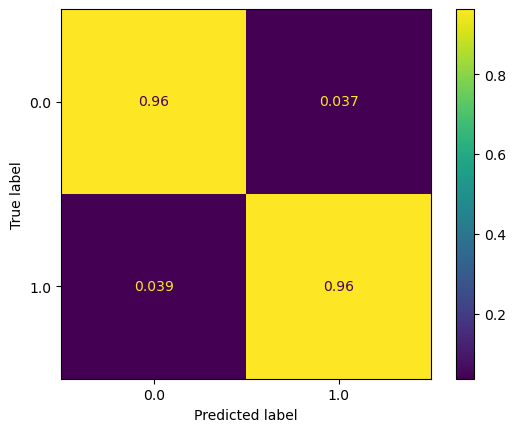

In [91]:
flat_preds_arr = np.array(combined_pred_arr).flatten()
cm = confusion_matrix(flat_truth_arr, flat_preds_arr, labels=list(range(2)))
ConfusionMatrixDisplay.from_predictions(flat_truth_arr, flat_preds_arr, normalize='true')

In [92]:
# Calculating the True Positive Rate, False Positive Rate
def tpr_fpr_tnr_fnr(cm):
    tn = cm[0][0]
    fp = cm[0][1]
    fn = cm[1][0]
    tp = cm[1][1]
    tpr = tp/(tp+fn)
    fpr = fp/(fp+tn)
    tnr, fnr = 1-tpr, 1-fpr
    return tpr, fpr, tnr, fnr

In [93]:
tpr, fpr, tnr, fnr = tpr_fpr_tnr_fnr(cm)
print("True Positive Rate(TPR): ",tpr)
print("False Positive Rate(FPR): ",fpr)
print("True Negative Rate(TNR): ", tnr)
print("False Negative Rate(FNR): ", fnr)

True Positive Rate(TPR):  0.9612582303365651
False Positive Rate(FPR):  0.03693378514075828
True Negative Rate(TNR):  0.0387417696634349
False Negative Rate(FNR):  0.9630662148592417


In [94]:
print("F1 score of the predictions: ",f1_score(flat_truth_arr, flat_preds_arr, average='macro'))

F1 score of the predictions:  0.9575094945802752


#### Residual segnet

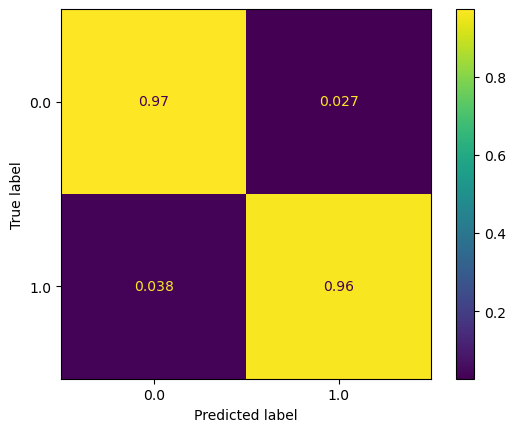

In [95]:
flat_preds_arr = np.array(residual_pred_arr).flatten()
cm = confusion_matrix(flat_truth_arr, flat_preds_arr, labels=list(range(2)))
ConfusionMatrixDisplay.from_predictions(flat_truth_arr, flat_preds_arr, normalize='true')

In [96]:
# Calculating the True Positive Rate, False Positive Rate
def tpr_fpr_tnr_fnr(cm):
    tn = cm[0][0]
    fp = cm[0][1]
    fn = cm[1][0]
    tp = cm[1][1]
    tpr = tp/(tp+fn)
    fpr = fp/(fp+tn)
    tnr, fnr = 1-tpr, 1-fpr
    return tpr, fpr, tnr, fnr

In [97]:
tpr, fpr, tnr, fnr = tpr_fpr_tnr_fnr(cm)
print("True Positive Rate(TPR): ",tpr)
print("False Positive Rate(FPR): ",fpr)
print("True Negative Rate(TNR): ", tnr)
print("False Negative Rate(FNR): ", fnr)

True Positive Rate(TPR):  0.9618171650001608
False Positive Rate(FPR):  0.027226043187639357
True Negative Rate(TNR):  0.03818283499983921
False Negative Rate(FNR):  0.9727739568123607


In [98]:
print("F1 score of the predictions: ",f1_score(flat_truth_arr, flat_preds_arr, average='macro'))

F1 score of the predictions:  0.9649854533326868


#### Attention segnet

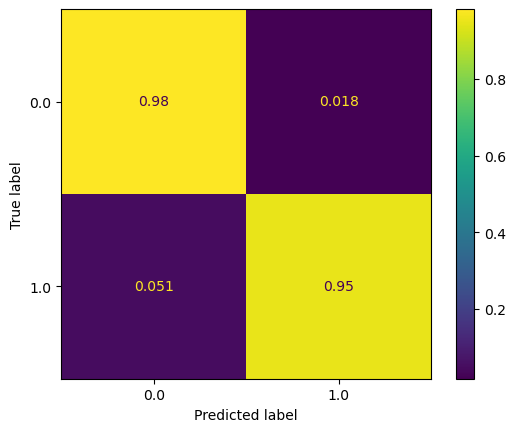

In [99]:
flat_preds_arr = np.array(attention_pred_arr).flatten()
cm = confusion_matrix(flat_truth_arr, flat_preds_arr, labels=list(range(2)))
ConfusionMatrixDisplay.from_predictions(flat_truth_arr, flat_preds_arr, normalize='true')

In [100]:
# Calculating the True Positive Rate, False Positive Rate
def tpr_fpr_tnr_fnr(cm):
    tn = cm[0][0]
    fp = cm[0][1]
    fn = cm[1][0]
    tp = cm[1][1]
    tpr = tp/(tp+fn)
    fpr = fp/(fp+tn)
    tnr, fnr = 1-tpr, 1-fpr
    return tpr, fpr, tnr, fnr

In [101]:
tpr, fpr, tnr, fnr = tpr_fpr_tnr_fnr(cm)
print("True Positive Rate(TPR): ",tpr)
print("False Positive Rate(FPR): ",fpr)
print("True Negative Rate(TNR): ", tnr)
print("False Negative Rate(FNR): ", fnr)

True Positive Rate(TPR):  0.9486385385608174
False Positive Rate(FPR):  0.01834569035251372
True Negative Rate(TNR):  0.05136146143918263
False Negative Rate(FNR):  0.9816543096474862


In [102]:
print("F1 score of the predictions: ",f1_score(flat_truth_arr, flat_preds_arr, average='macro'))

F1 score of the predictions:  0.9667162612297573


# AUC 

In [103]:

# ground_truth = y_train[44].ravel()
# predicted = attention_pred.ravel()
# fpr, tpr, _ = roc_curve(ground_truth, predicted)
# roc_auc = auc(fpr,tpr)

In [104]:
# fig, ax = plt.subplots(1,1)
# ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
# ax.plot([0, 1], [0, 1], 'k--')
# ax.set_xlim([0.0, 1.0])
# ax.set_ylim([0.0, 1.05])
# ax.set_xlabel('False Positive Rate')
# ax.set_ylabel('True Positive Rate')
# ax.set_title('Receiver operating characteristic example')
# ax.legend(loc="lower right")

But this could be wrong: https://in.mathworks.com/matlabcentral/answers/301203-roc-curve-for-image-segmentation

# Elliptical Fourier Descriptors

In [105]:
def get_contours(img_gray):
    img_gray = np.array(img_gray, np.uint8)
    img_gray = img_gray*255
    contours, hierarchy = cv2.findContours(image=img_gray, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)       
    image_copy = img_gray.copy()
    image_copy = cv2.merge((image_copy, image_copy, image_copy))
    cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)
    fig,ax=plt.subplots(1, 2, figsize=(10, 5), squeeze=False)
    ax[0][0].set_title("Binary mask")
    ax[0][0].imshow(img_gray, cmap='gray')
    ax[0][0].axis('off')
    
    ax[0][1].set_title("Contour identified")
    ax[0][1].imshow(image_copy, cmap='gray')
    ax[0][1].axis('off')
    return contours

In [118]:
def get_EFD(gnd_contours, pred_contours):
    gnd_coeffs = []
    for cnt in gnd_contours:
        # Find the coefficients of all contours
        gnd_coeffs.append(pyefd.elliptic_fourier_descriptors(
            np.squeeze(cnt), order=10))
    pred_coeffs = []
    for cnt in pred_contours:
        # Find the coefficients of all contours
        try:
            pred_coeffs.append(pyefd.elliptic_fourier_descriptors(np.squeeze(cnt), order=10))
        except:
            continue

    gnd_coeffs = gnd_coeffs[0]
    pred_coeffs = pred_coeffs[0]
    
#     print("Ground truth EFD vector shape: ", gnd_coeffs.shape)
#     print("Prediction EFD vector shape: ",pred_coeffs.shape)
    
    dist = np.linalg.norm(pred_coeffs - gnd_coeffs)
    return dist
#     print("Eucli"dist)

In [119]:
simple_pred_arr = np.array(simple_pred_arr)
combined_pred_arr = np.array(combined_pred_arr)
residual_pred_arr = np.array(residual_pred_arr)
attention_pred_arr = np.array(attention_pred_arr)

In [120]:
# list of eucledian distances

euc_proper_indices = []
for i in range(Y_train.shape[0]):
    img_gray = np.array(Y_train[i], np.uint8)
    img_gray = img_gray*255
    contours, hierarchy = cv2.findContours(image=img_gray, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)       
    image_copy = img_gray.copy()
    image_copy = cv2.merge((image_copy, image_copy, image_copy))
    cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

    g_c = contours

    img_gray = np.array(simple_pred_arr[i], np.uint8)
    img_gray = img_gray*255
    contours, hierarchy = cv2.findContours(image=img_gray, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)       
    image_copy = img_gray.copy()
    image_copy = cv2.merge((image_copy, image_copy, image_copy))
    cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

    simple_c = contours

    img_gray = np.array(combined_pred_arr[i], np.uint8)
    img_gray = img_gray*255
    contours, hierarchy = cv2.findContours(image=img_gray, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)       
    image_copy = img_gray.copy()
    image_copy = cv2.merge((image_copy, image_copy, image_copy))
    cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

    combined_c = contours

    img_gray = np.array(residual_pred_arr[i], np.uint8)
    img_gray = img_gray*255
    contours, hierarchy = cv2.findContours(image=img_gray, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)       
    image_copy = img_gray.copy()
    image_copy = cv2.merge((image_copy, image_copy, image_copy))
    cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

    residual_c = contours

    img_gray = np.array(attention_pred_arr[i], np.uint8)
    img_gray = img_gray*255
    contours, hierarchy = cv2.findContours(image=img_gray, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)       
    image_copy = img_gray.copy()
    image_copy = cv2.merge((image_copy, image_copy, image_copy))
    cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

    attention_c = contours

    s_dist = get_EFD(g_c, simple_c)
    c_dist = get_EFD(g_c, combined_c)
    r_dist = get_EFD(g_c, residual_c)
    a_dist = get_EFD(g_c, attention_c)

    if(s_dist>c_dist>r_dist>a_dist):
#         print(s_dist, c_dist, r_dist, a_dist)
#         print(i)
        euc_proper_indices.append(i)

In [121]:
len(euc_proper_indices)

8

#### Randomly picking examples for drawing contours

In [ ]:
# Selecting one image and getting all the predictions
r_num = euc_proper_indices[random.randint(0, len(euc_proper_indices)-1)]
img_chosen = X_train[r_num]
mask_chosen = Y_train[r_num]

In [ ]:
# Draw the contour for ground truth image
gnd_contours = get_contours(mask_chosen)

In [ ]:
# Draw the contour for the prediction image
img_pred = enhance_model(img_chosen, simple_segnet).reshape(192,256)
pred_contours = get_contours(img_pred)

In [ ]:
simple_dist = get_EFD(gnd_contours, pred_contours)

In [ ]:
# Draw the contour for the prediction image
img_pred = enhance_model(img_chosen, combined_segnet).reshape(192,256)
pred_contours = get_contours(img_pred)

In [ ]:
combined_dist = get_EFD(gnd_contours, pred_contours)

In [ ]:
# Draw the contour for the prediction image
img_pred = (ressegnet_model.predict(np.expand_dims(img_chosen,0))[0,:,:,0] > 0.5).astype(np.uint8)
pred_contours = get_contours(img_pred)

In [ ]:
residual_dist = get_EFD(gnd_contours, pred_contours)

In [ ]:
# Draw the contour for the prediction image
img_pred = (att_res_SegNet_model.predict(np.expand_dims(img_chosen,0))[0,:,:,0] > 0.5).astype(np.uint8)
pred_contours = get_contours(img_pred)

In [ ]:
attention_dist = get_EFD(gnd_contours, pred_contours)

In [ ]:
fig,ax=plt.subplots(1, 5, figsize=(10, 5), squeeze=False)
test_img = X_train[r_num]
test_img_input = np.expand_dims(test_img, 0)
ax[0][0].set_title("Ground Truth")
ax[0][0].imshow(Y_train[r_num], cmap='gray')
ax[0][0].set_xlabel("Eucledian Distance")
ax[0][0].set_xticks([])
ax[0][0].set_yticks([])

ax[0][1].set_title("Simple Segnet")
ax[0][1].imshow(enhance_model(test_img, simple_segnet).reshape(192,256), cmap='gray')
ax[0][1].set_xlabel("{:.2f}".format(simple_dist))
ax[0][1].set_xticks([])
ax[0][1].set_yticks([])

ax[0][2].set_title("Combined Segnet")
ax[0][2].imshow(enhance_model(test_img, combined_segnet).reshape(192,256), cmap='gray')
ax[0][2].set_xlabel("{:.2f}".format(combined_dist, cmap='gray'))
ax[0][2].set_xticks([])
ax[0][2].set_yticks([])

ax[0][3].set_title("Residual Segnet")
ax[0][3].imshow((ressegnet_model.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8), cmap='gray')
ax[0][3].set_xlabel("{:.2f}".format(residual_dist, cmap='gray'))
ax[0][3].set_xticks([])
ax[0][3].set_yticks([])

ax[0][4].set_title("Attention Segnet")
ax[0][4].imshow((att_res_SegNet_model.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8), cmap='gray')
ax[0][4].set_xlabel("{:.2f}".format(attention_dist, cmap='gray'))
ax[0][4].set_xticks([])
ax[0][4].set_yticks([]);

### Shape matching

In [ ]:
# list of shape matching
shape_proper_indices = []
simple_shape=[]
combined_shape=[]
residual_shape=[]
attention_shape=[]
ex_ct = 0
for i in range(Y_train.shape[0]):
    img_gray = np.array(Y_train[i], np.uint8)
    img_gray = img_gray*255
    contours, hierarchy = cv2.findContours(image=img_gray, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)       
    image_copy = img_gray.copy()
    image_copy = cv2.merge((image_copy, image_copy, image_copy))
    cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)
    
    g_c = contours
    
    img_gray = np.array(simple_pred_arr[i], np.uint8)
    img_gray = img_gray*255
    contours, hierarchy = cv2.findContours(image=img_gray, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)       
    image_copy = img_gray.copy()
    image_copy = cv2.merge((image_copy, image_copy, image_copy))
    cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)
    
    simple_c = contours
    
    img_gray = np.array(combined_pred_arr[i], np.uint8)
    img_gray = img_gray*255
    contours, hierarchy = cv2.findContours(image=img_gray, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)       
    image_copy = img_gray.copy()
    image_copy = cv2.merge((image_copy, image_copy, image_copy))
    cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)
    
    combined_c = contours
    
    img_gray = np.array(residual_pred_arr[i], np.uint8)
    img_gray = img_gray*255
    contours, hierarchy = cv2.findContours(image=img_gray, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)       
    image_copy = img_gray.copy()
    image_copy = cv2.merge((image_copy, image_copy, image_copy))
    cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)
    
    residual_c = contours
    
    img_gray = np.array(attention_pred_arr[i], np.uint8)
    img_gray = img_gray*255
    contours, hierarchy = cv2.findContours(image=img_gray, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)       
    image_copy = img_gray.copy()
    image_copy = cv2.merge((image_copy, image_copy, image_copy))
    cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)
    
    attention_c = contours
    
    s_dist = cv2.matchShapes(g_c[0], simple_c[0],1,0.0)
    c_dist = cv2.matchShapes(g_c[0], combined_c[0],1,0.0)
    r_dist = cv2.matchShapes(g_c[0], residual_c[0],1,0.0)
    a_dist = cv2.matchShapes(g_c[0], attention_c[0],1,0.0)
    
    simple_shape.append(s_dist)
    combined_shape.append(c_dist)
    residual_shape.append(r_dist)
    attention_shape.append(a_dist)
    
    if(s_dist>c_dist>r_dist>a_dist):
#         print(s_dist, c_dist, r_dist, a_dist)
#         print(i)
        shape_proper_indices.append(i)
    if(a_dist<s_dist and a_dist<c_dist and a_dist<r_dist):
        ex_ct+=1

In [ ]:
print("Number of cases where the trend is followed: ",len(shape_proper_indices))

In [ ]:
print("Number of cases where attention segnet performs better than other models: ", ex_ct)

In [ ]:
# Selecting one image and getting all the predictions
# rs_num = shape_proper_indices[random.randint(0, len(shape_proper_indices)-1)]
rs_num = random.randint(0, X_train.shape[0]-1)
img_chosen = X_train[rs_num]
mask_chosen = Y_train[rs_num]

In [ ]:
fig,ax=plt.subplots(1, 5, figsize=(10, 5), squeeze=False)
test_img = X_train[rs_num]
test_img_input = np.expand_dims(test_img, 0)
ax[0][0].set_title("Ground Truth")
ax[0][0].imshow(Y_train[rs_num], cmap='gray')
ax[0][0].set_xlabel("Shape matching score")
ax[0][0].set_xticks([])
ax[0][0].set_yticks([])

ax[0][1].set_title("Simple Segnet")
ax[0][1].imshow(enhance_model(test_img, simple_segnet).reshape(192,256), cmap='gray')
ax[0][1].set_xlabel("{:.2f}".format(simple_shape[rs_num]%100))
ax[0][1].set_xticks([])
ax[0][1].set_yticks([])

ax[0][2].set_title("Combined Segnet")
ax[0][2].imshow(enhance_model(test_img, combined_segnet).reshape(192,256), cmap='gray')
ax[0][2].set_xlabel("{:.2f}".format(combined_shape[rs_num]%100))
ax[0][2].set_xticks([])
ax[0][2].set_yticks([])

ax[0][3].set_title("Residual Segnet")
ax[0][3].imshow((ressegnet_model.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8), cmap='gray')
ax[0][3].set_xlabel("{:.2f}".format(residual_shape[rs_num]%100))
ax[0][3].set_xticks([])
ax[0][3].set_yticks([])

ax[0][4].set_title("Attention Segnet")
ax[0][4].imshow((att_res_SegNet_model.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8), cmap='gray')
ax[0][4].set_xlabel("{:.2f}".format(attention_shape[rs_num]%100))
ax[0][4].set_xticks([])
ax[0][4].set_yticks([]);